In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from datetime import timedelta
from pandas.plotting import register_matplotlib_converters
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import statsmodels.api as sm
register_matplotlib_converters()
from time import time
import csv

In [2]:
def parser(s):
    return datetime.strptime(s, "%d.%m.%Y")

In [3]:
# Read data
df_sales = pd.read_csv('merged.csv', parse_dates=[2], index_col=2, squeeze=True, date_parser=parser)
df_sales

,Store,Dept,Weekly_Sales,IsHoliday,Type,Size,Temperatur,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
Date,,,,,,,,,,,,,,,
2010-02-05,1,1,24924.50,False,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106
2010-02-12,1,1,46039.49,True,A,151315,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106
2010-02-19,1,1,41595.55,False,A,151315,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106
2010-02-26,1,1,19403.54,False,A,151315,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106
2010-03-05,1,1,21827.90,False,A,151315,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-09-28,45,98,508.37,False,B,118221,64.88,3.997,4556.61,20.64,1.50,1601.01,3288.25,192.013558,8.684
2012-10-05,45,98,628.10,False,B,118221,64.89,3.985,5046.74,NaN,18.82,2253.43,2340.01,192.170412,8.667
2012-10-12,45,98,1061.02,False,B,118221,54.47,4.000,1956.28,NaN,7.89,599.32,3990.54,192.327265,8.667


In [5]:
#We probably have to slice the df into each shop and dept.

# Reduce Dataframe to Date and Revenue columns

df_sales_shops = df_sales.drop(
    ['Dept','IsHoliday','Type','Size','Temperatur','Fuel_Price','MarkDown1','MarkDown2','MarkDown3','MarkDown4','MarkDown5','CPI','Unemployment']
    ,axis='columns')

store1 = df_sales_shops[df_sales_shops['Store'] == 1]
index = pd.DataFrame(store1.index)
index = index.drop_duplicates()

# Sums up all department sales per week for each shop
stores_revenue = []
for store in range(45):

    temp = df_sales_shops[df_sales_shops['Store'] == store+1]
    stores_revenue.append(pd.DataFrame(temp.groupby(['Date']).Weekly_Sales.sum()))
    stores_revenue[store].reset_index(drop=True, inplace=True)

print(stores_revenue[0])
print(index)

     Weekly_Sales
0      1643690.90
1      1641957.44
2      1611968.17
3      1409727.59
4      1554806.68
..            ...
138    1437059.26
139    1670785.97
140    1573072.81
141    1508068.77
142    1493659.74

[143 rows x 1 columns]
          Date
0   2010-02-05
1   2010-02-12
2   2010-02-19
3   2010-02-26
4   2010-03-05
..         ...
138 2012-09-28
139 2012-10-05
140 2012-10-12
141 2012-10-19
142 2012-10-26

[143 rows x 1 columns]


In [6]:
# Safe data as csv file

df_stores_revenue = df_sales_shops[df_sales_shops['Store'].between(1, 45)].groupby(['Store', 'Date'])['Weekly_Sales'].sum() \
                                    .unstack(level='Store') \
                                    .rename_axis(columns=None).add_prefix('Store')

df_stores_revenue.to_csv("stores_revenue.csv", sep=',',index=True)

df_stores_revenue

,Store1,Store2,Store3,Store4,Store5,Store6,Store7,Store8,Store9,Store10,...,Store36,Store37,Store38,Store39,Store40,Store41,Store42,Store43,Store44,Store45
Date,,,,,,,,,,,,,,,,,,,,,
2010-02-05,1643690.90,2136989.46,461622.22,2135143.87,317173.10,1652635.10,496725.44,1004137.09,549505.55,2193048.75,...,467546.74,536006.73,358496.14,1230596.80,1001943.80,1086533.18,543384.01,647029.28,281090.95,890689.51
2010-02-12,1641957.44,2137809.50,420728.96,2188307.39,311825.70,1606283.86,524104.92,994801.40,552677.48,2176028.52,...,469563.70,529852.70,342214.90,1266229.07,955338.29,1075656.34,575709.96,682918.99,286857.13,656988.64
2010-02-19,1611968.17,2124451.54,421642.19,2049860.26,303447.57,1567138.07,506760.54,963960.37,511327.90,2113432.58,...,470281.03,510382.50,327237.92,1230591.97,916289.20,1052034.74,508794.87,658997.55,267956.30,841264.04
2010-02-26,1409727.59,1865097.27,407204.86,1925728.84,270281.63,1432953.21,496083.24,847592.11,473773.27,2006774.96,...,447519.44,513615.82,334222.73,1168582.02,863917.41,991941.73,491510.58,618702.79,273079.07,741891.65
2010-03-05,1554806.68,1991013.13,415202.04,1971057.44,288855.71,1601348.82,491419.55,881503.95,507297.88,1987090.09,...,480203.43,519255.68,372239.89,1266254.21,990152.28,1063557.49,554972.42,658600.05,284617.27,777951.22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-09-28,1437059.26,1746470.56,389813.02,2027620.23,310141.68,1369131.46,525545.76,884724.41,516361.06,1694862.41,...,270677.98,527953.14,398468.08,1495607.07,919595.44,1307928.01,505978.46,577792.32,355307.94,713173.95
2012-10-05,1670785.97,1998321.04,443557.65,2209835.43,343048.29,1518177.71,505830.56,976436.02,606755.30,1758971.38,...,277137.86,546122.37,458479.01,1574408.67,1069112.00,1400160.95,593162.53,642614.89,337390.44,733455.07
2012-10-12,1573072.81,1900745.13,410804.39,2133026.07,325345.41,1459396.84,503463.93,927511.99,558464.80,1713889.11,...,300236.85,521810.75,437320.66,1494417.07,982523.26,1409544.97,612379.90,619369.72,337796.13,734464.36


In [7]:
# Creates a table which shows the difference between week n and n-1
first_diff = df_stores_revenue.copy()
for column in df_stores_revenue:
    first_diff[column] = first_diff[column].diff()[1:]

first_diff.drop(first_diff.index[[0]], inplace=True)
first_diff

,Store1,Store2,Store3,Store4,Store5,Store6,Store7,Store8,Store9,Store10,...,Store36,Store37,Store38,Store39,Store40,Store41,Store42,Store43,Store44,Store45
Date,,,,,,,,,,,,,,,,,,,,,
2010-02-12,-1733.46,820.04,-40893.26,53163.52,-5347.40,-46351.24,27379.48,-9335.69,3171.93,-17020.23,...,2016.96,-6154.03,-16281.24,35632.27,-46605.51,-10876.84,32325.95,35889.71,5766.18,-233700.87
2010-02-19,-29989.27,-13357.96,913.23,-138447.13,-8378.13,-39145.79,-17344.38,-30841.03,-41349.58,-62595.94,...,717.33,-19470.20,-14976.98,-35637.10,-39049.09,-23621.60,-66915.09,-23921.44,-18900.83,184275.40
2010-02-26,-202240.58,-259354.27,-14437.33,-124131.42,-33165.94,-134184.86,-10677.30,-116368.26,-37554.63,-106657.62,...,-22761.59,3233.32,6984.81,-62009.95,-52371.79,-60093.01,-17284.29,-40294.76,5122.77,-99372.39
2010-03-05,145079.09,125915.86,7997.18,45328.60,18574.08,168395.61,-4663.69,33911.84,33524.61,-19684.87,...,32683.99,5639.86,38017.16,97672.19,126234.87,71615.76,63461.84,39897.26,11538.20,36059.57
2010-03-12,-115265.09,-529.35,-31001.35,-76733.35,8437.88,-42727.46,-10967.45,-21167.79,-13152.08,-45743.96,...,-38769.23,-6240.33,-30215.97,-21862.38,-90799.88,-39559.78,33391.20,-13213.11,-12426.44,-12263.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012-09-28,-69066.80,-82945.11,-24579.07,-91818.30,2834.92,-56472.19,-5296.49,26927.96,-17395.82,23004.84,...,-23126.47,6632.16,-11132.90,-60065.44,19827.04,31318.65,-21187.24,-24197.70,19290.34,-9912.25
2012-10-05,233726.71,251850.48,53744.63,182215.20,32906.61,149046.25,-19715.20,91711.61,90394.24,64108.97,...,6459.88,18169.23,60010.93,78801.60,149516.56,92232.94,87184.07,64822.57,-17917.50,20281.12
2012-10-12,-97713.16,-97575.91,-32753.26,-76809.36,-17702.88,-58780.87,-2366.63,-48924.03,-48290.50,-45082.27,...,23098.99,-24311.62,-21158.35,-79991.60,-86588.74,9384.02,19217.37,-23245.17,405.69,1009.29


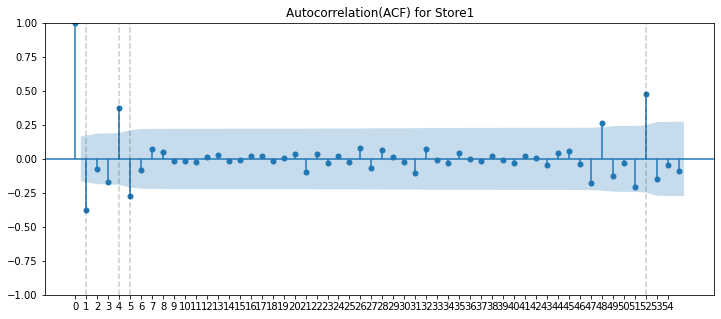

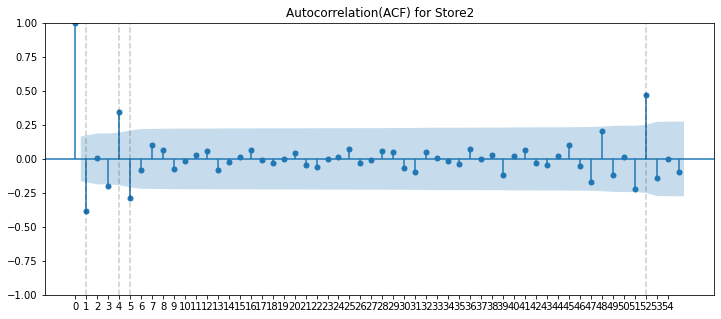

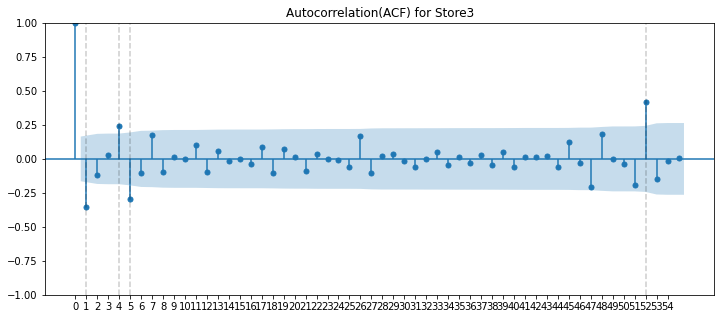

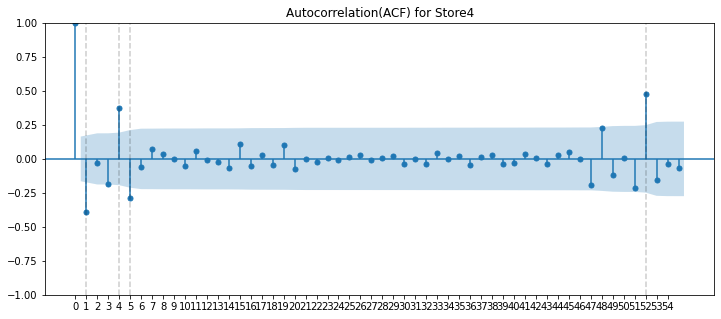

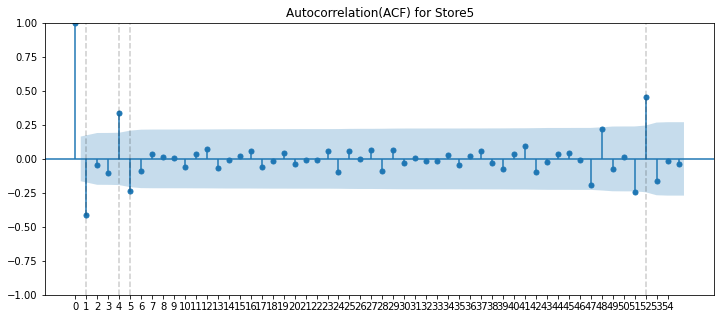

...

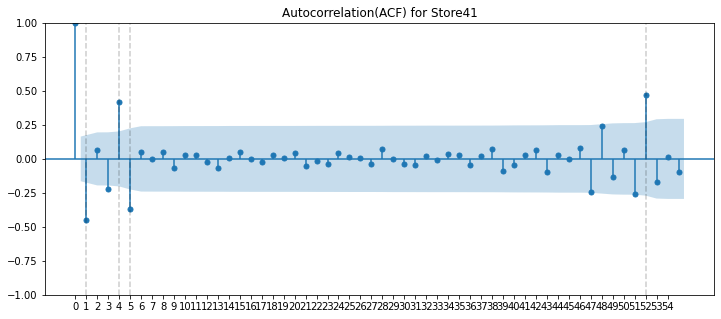

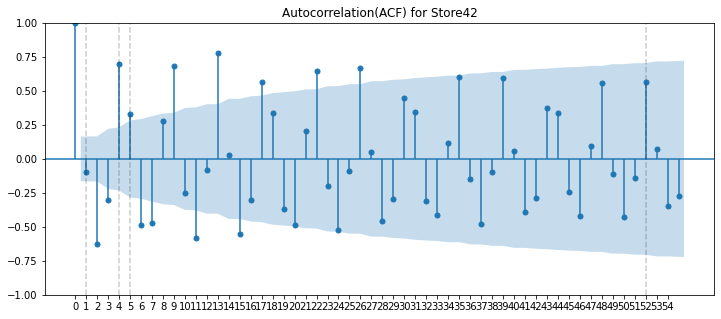

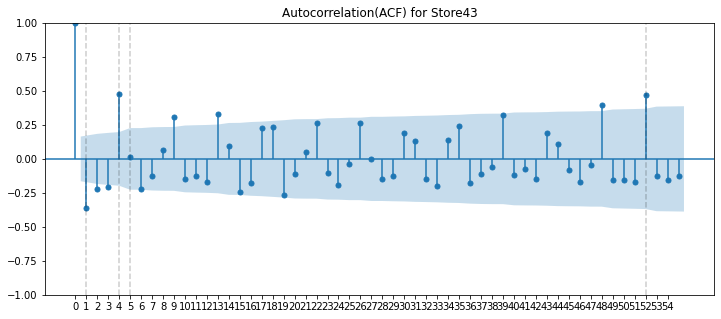

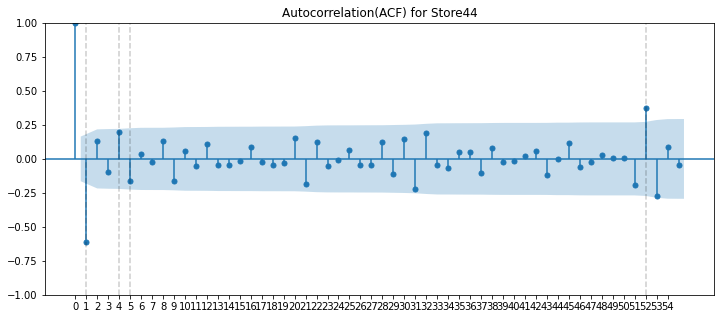

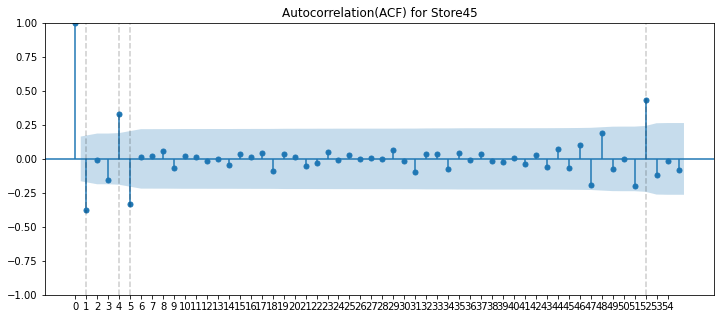

In [8]:
# Creates ACF Plots for the determination of the Moving Average (MA) part of SARIMA

for column in first_diff:
    fig, ax = plt.subplots(figsize=(12, 5))
    lags=55
    if len(first_diff[column]) < 55:
        lags=len(first_diff[column])-1
    acf_plot = plot_acf(first_diff[column], lags=lags, title='Autocorrelation(ACF) for {}'.format(column), ax=ax, bartlett_confint=True)
    plt.xticks(range(lags))
    
    if lags >= 52:
        for x in (1,4,5,52):
            plt.axvline(x, color='k', linestyle='--', alpha=0.2)
    
    plt.show()

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


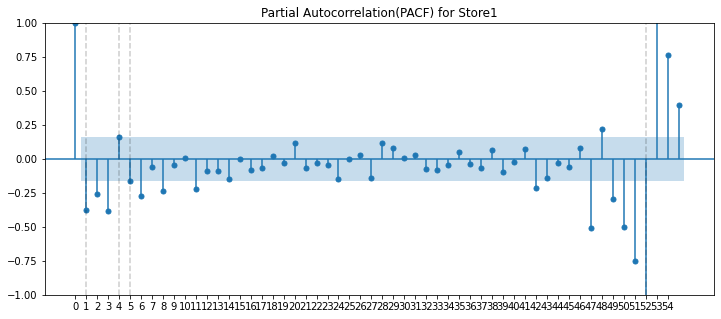

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


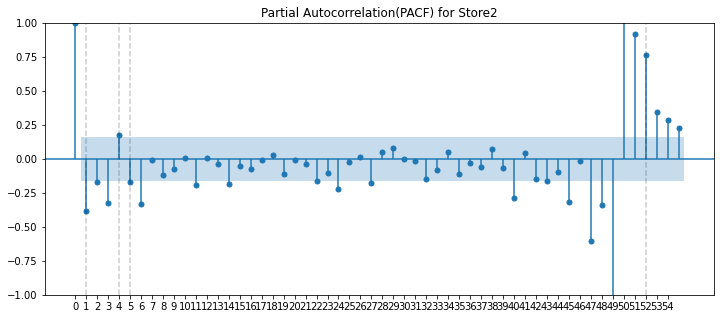

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


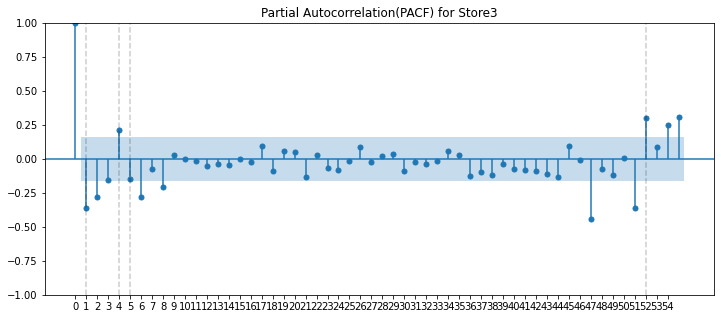

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


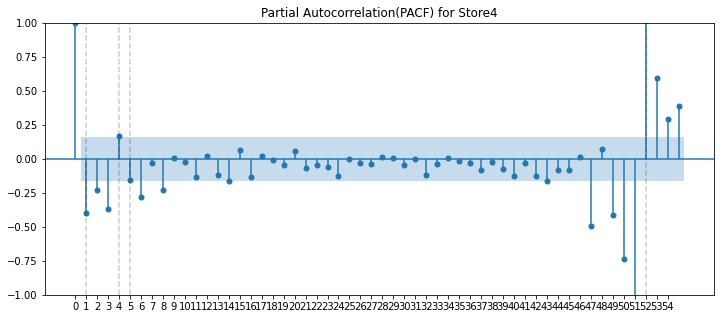

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


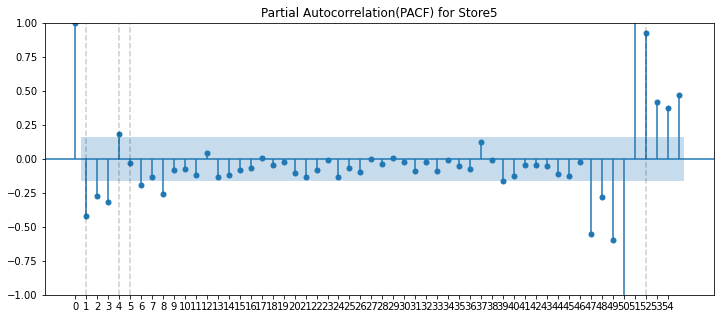

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


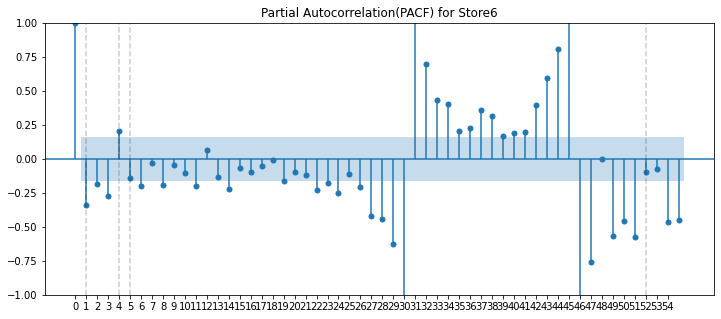

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


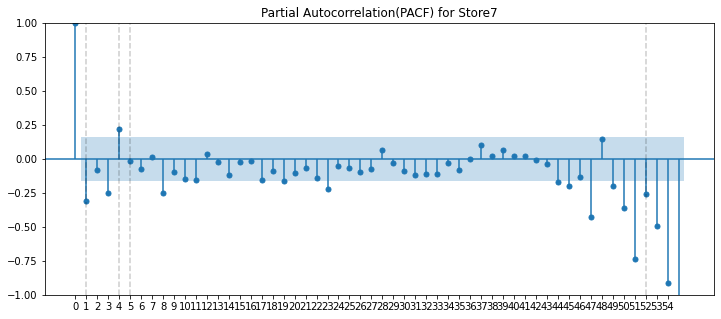

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


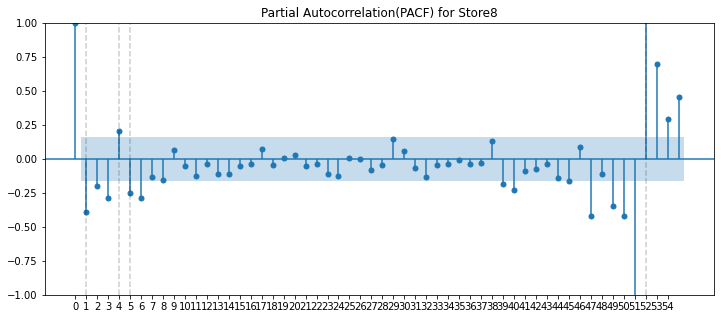

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


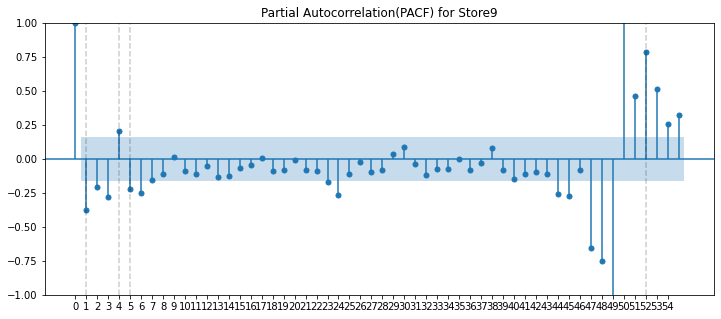

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


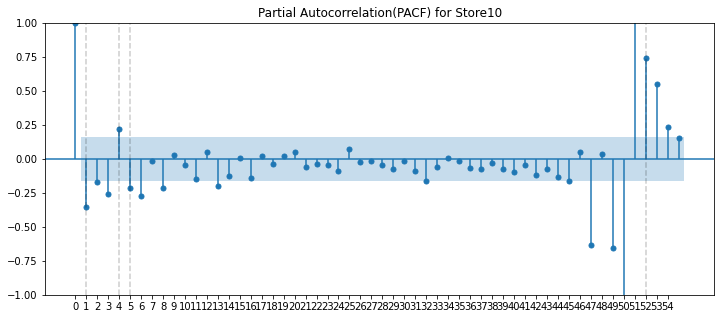

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


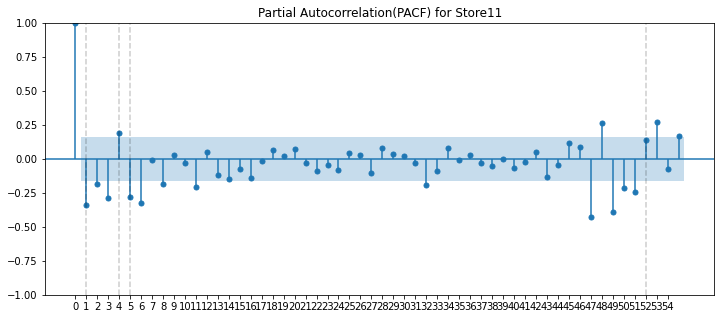

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


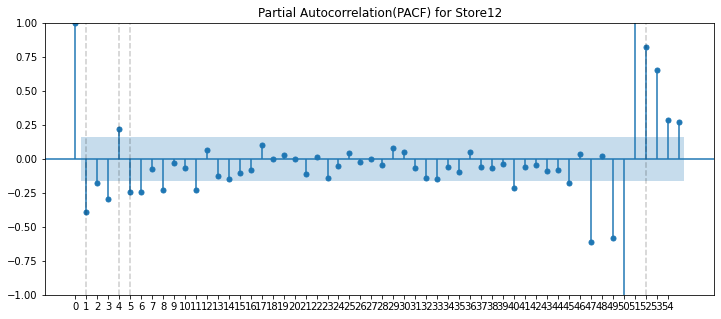

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


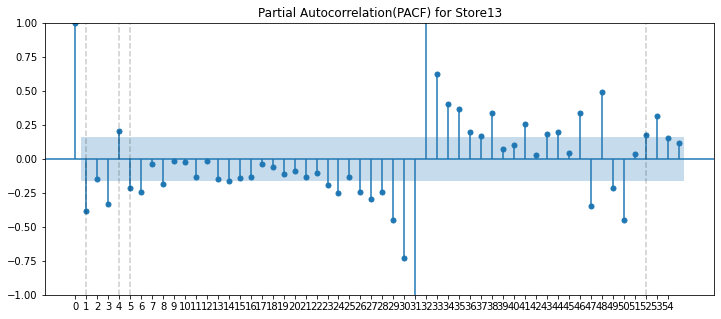

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


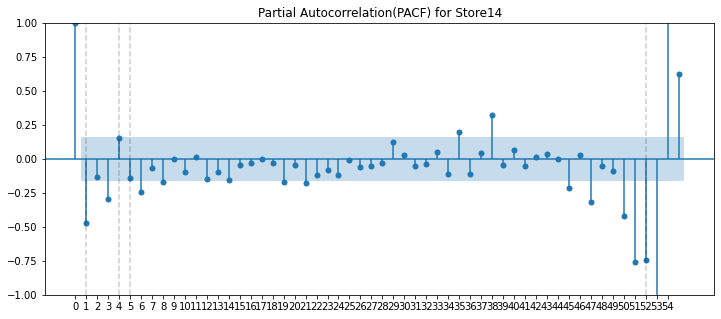

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


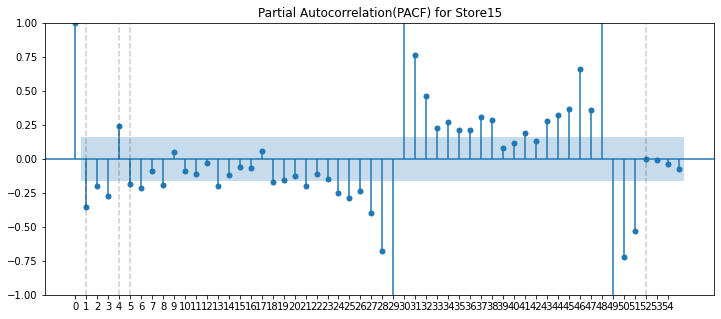

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


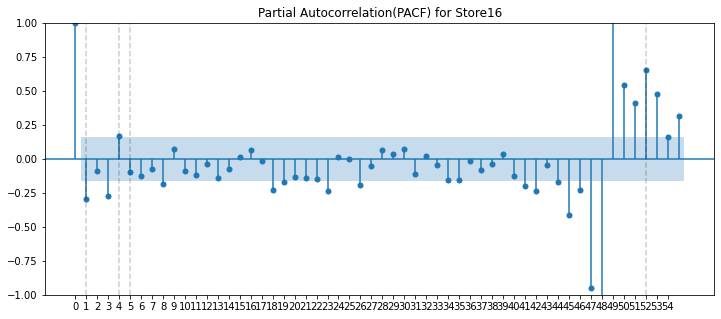

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


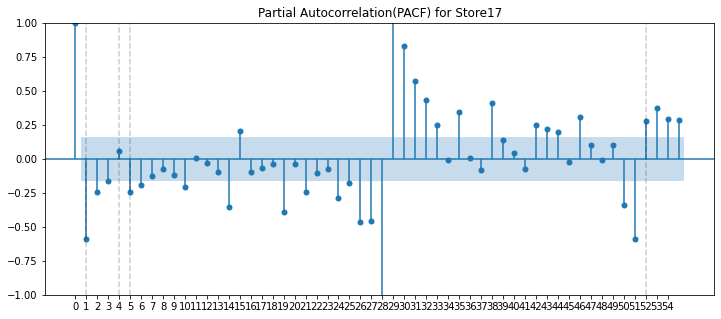

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


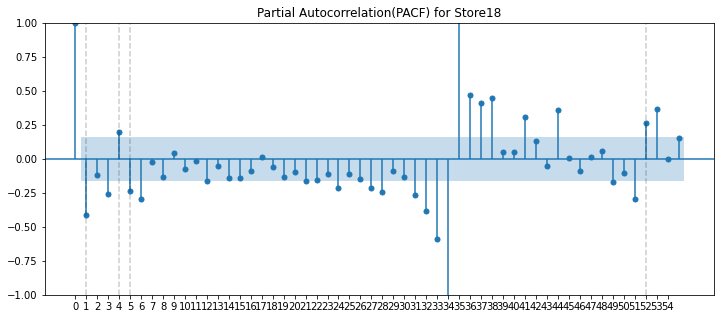

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


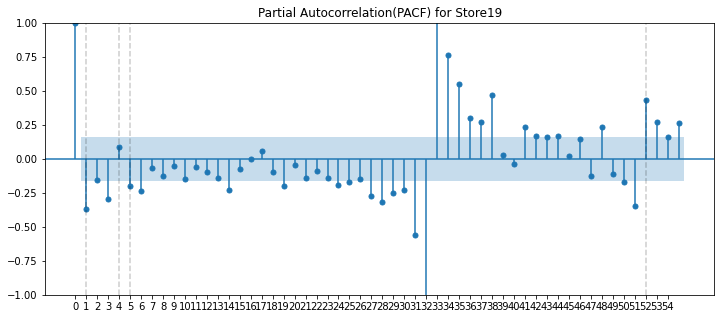

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


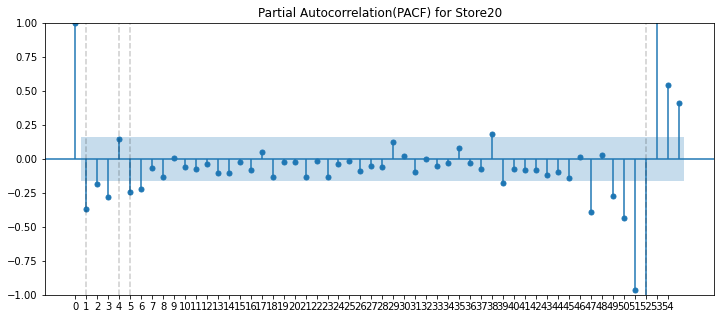

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


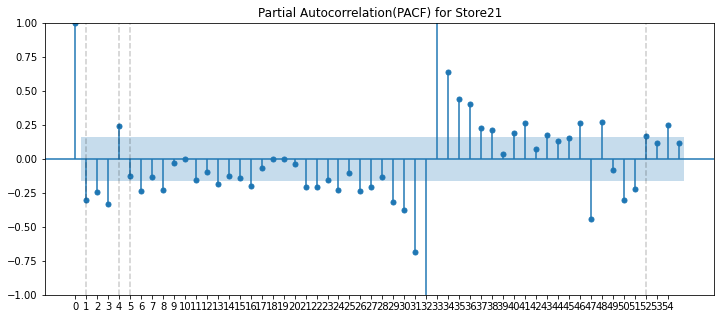

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


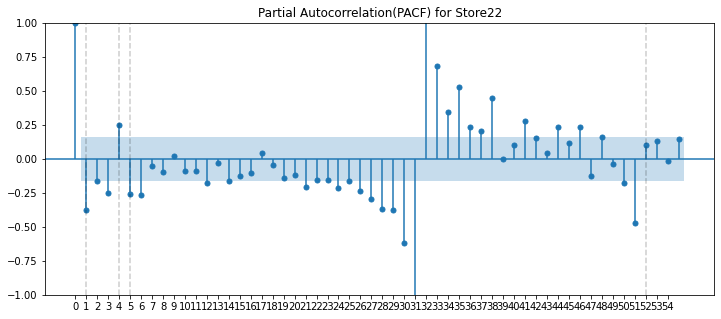

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


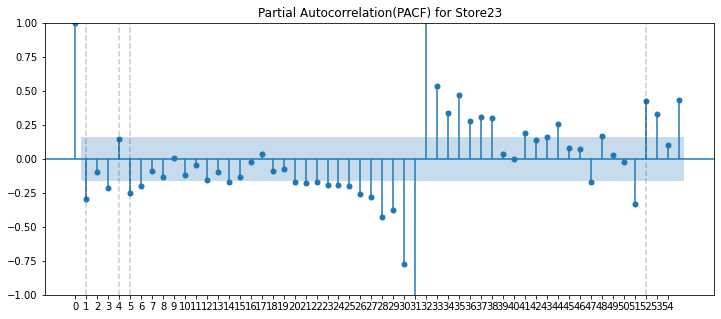

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


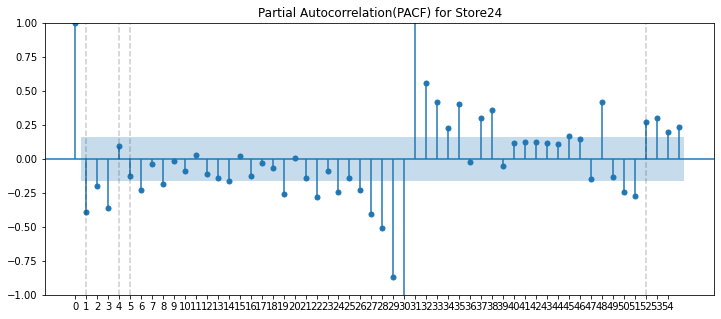

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


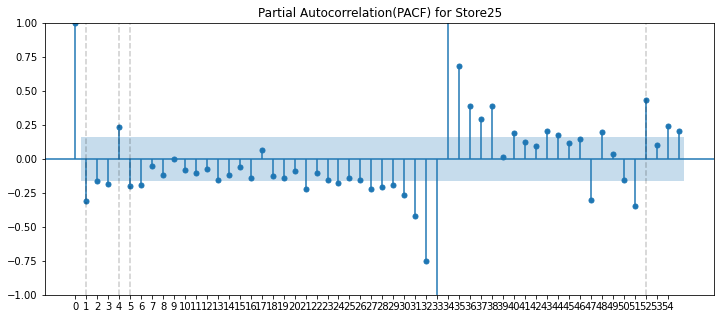

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


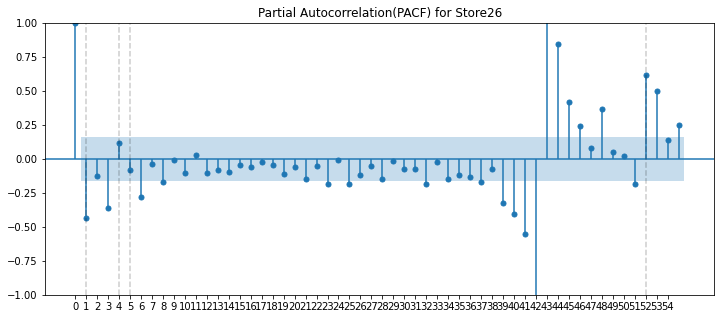

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


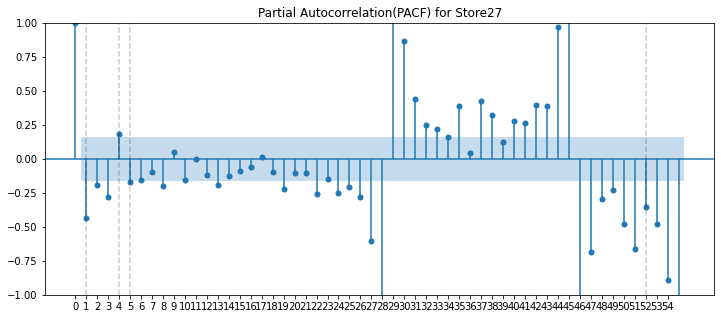

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


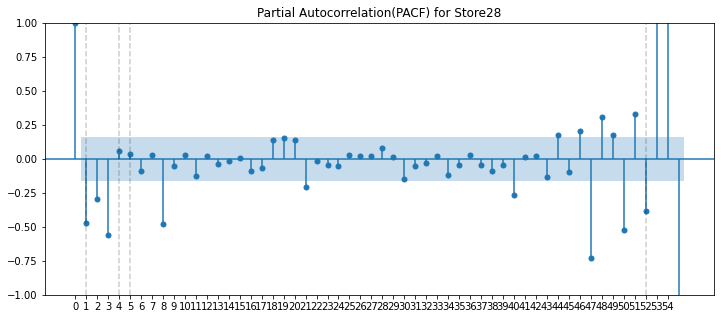

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


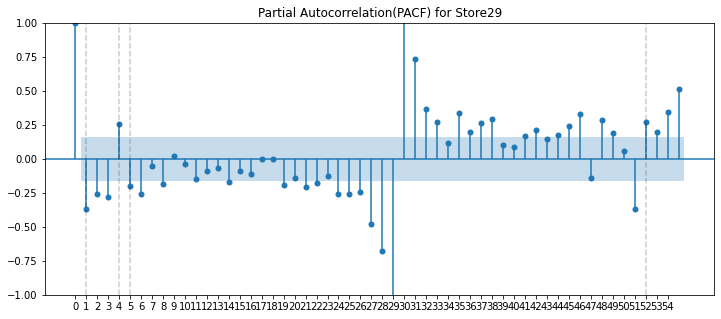

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


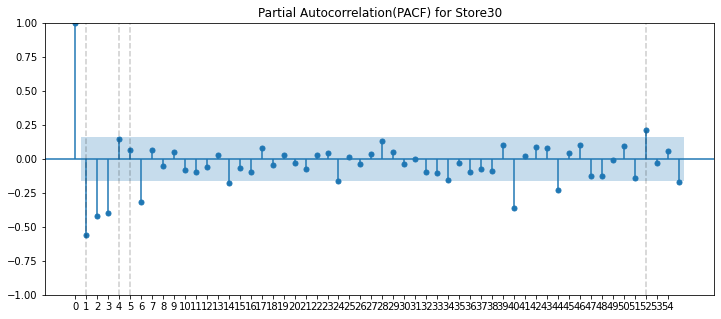

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


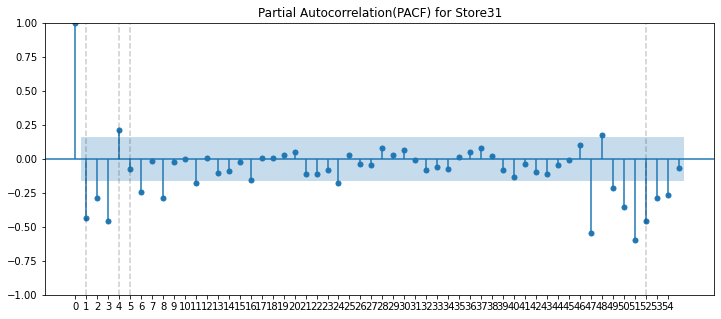

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


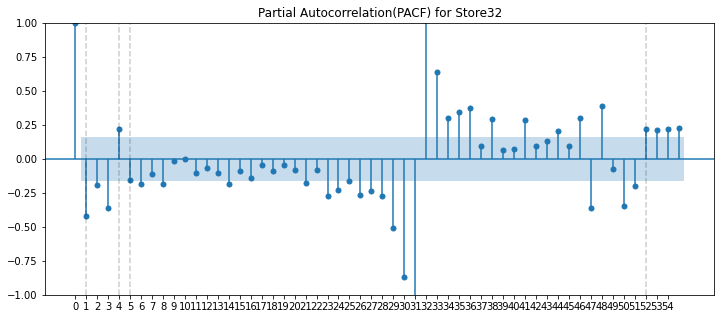

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


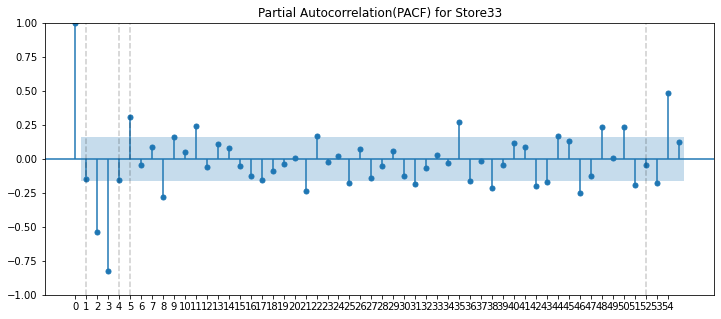

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


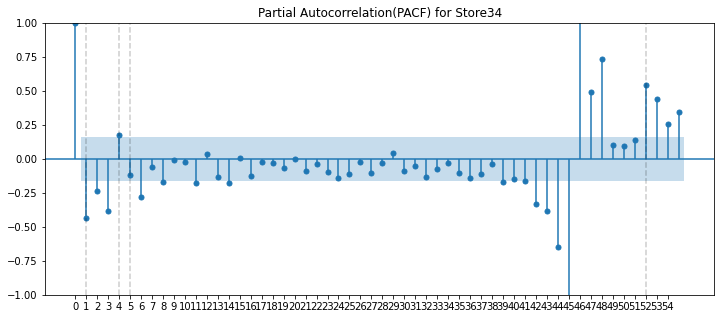

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


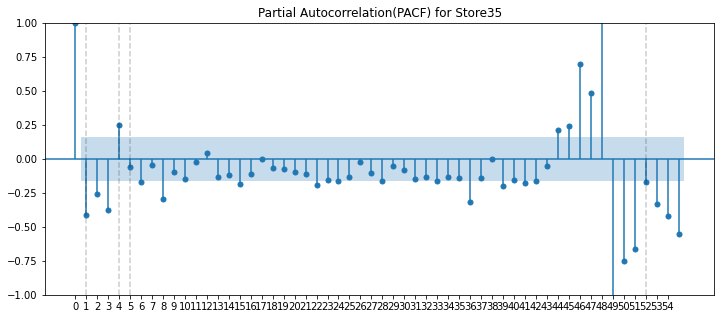

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


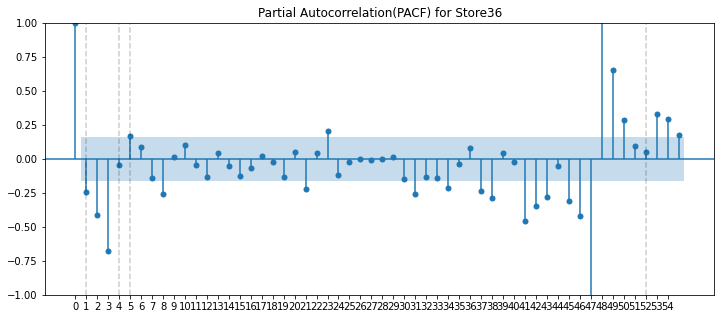

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


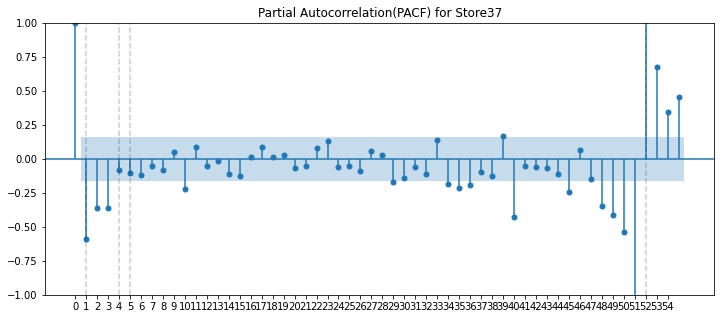

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


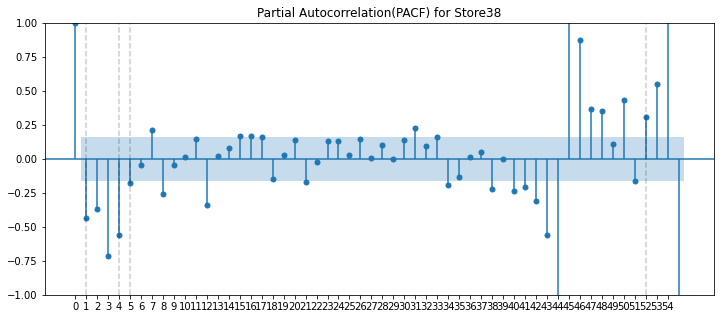

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


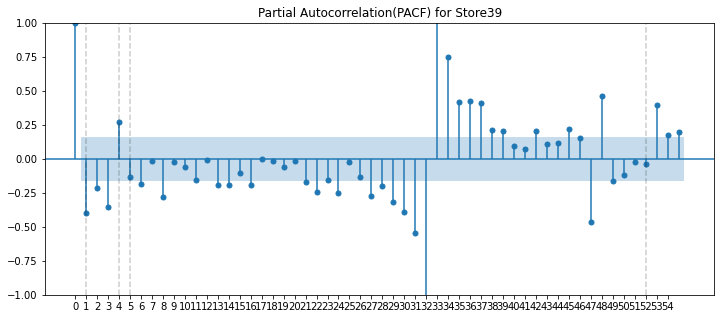

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


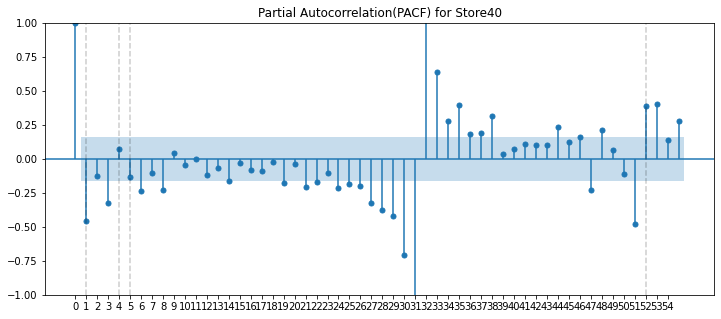

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


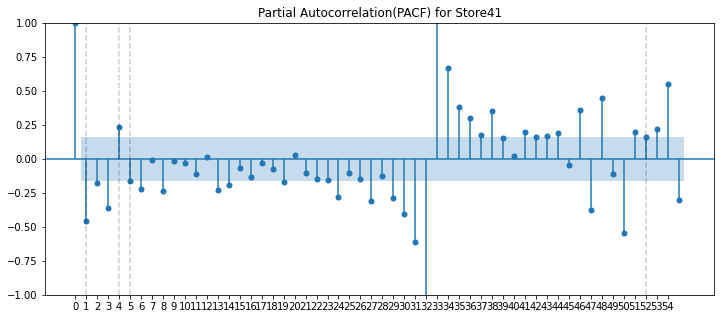

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


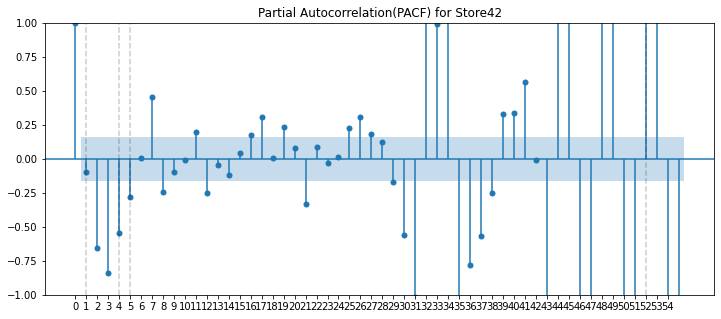

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


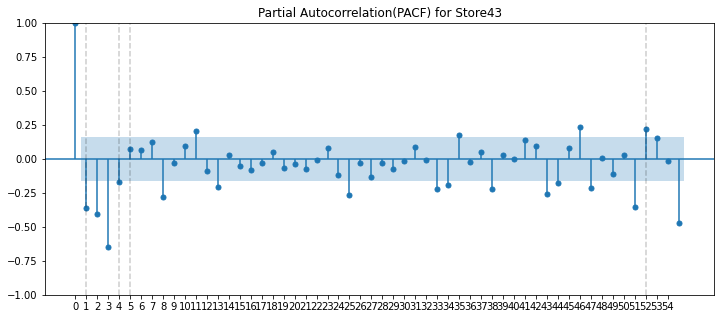

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


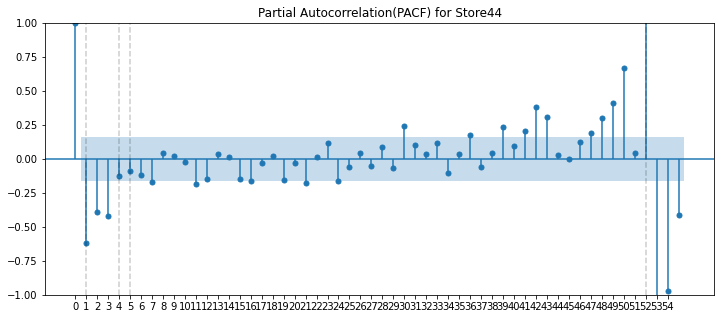

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


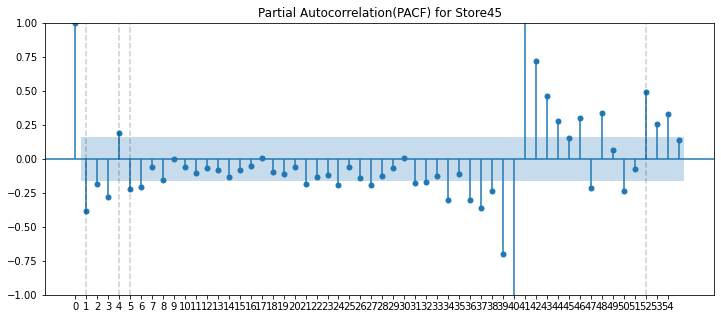

In [9]:
# Creates PACF Plots for the determination of the Auto Regressive (AR) part of SARIMA

for column in first_diff:
    fig, ax = plt.subplots(figsize=(12, 5))
    lags=55
    if len(first_diff[column]) < 55:
        lags=len(first_diff[column])-1
    acf_plot = plot_pacf(first_diff[column], lags=lags, title='Partial Autocorrelation(PACF) for {}'.format(column), ax=ax)
    plt.xticks(range(lags))
    
    if lags >= 52:
        for x in (1,4,5,52):
            plt.axvline(x, color='k', linestyle='--', alpha=0.2)
    
    plt.show()

In [10]:
# Seperating the time series in training and test data
# Whole time frame = 05th feb 2010 - 26th oct 2012 = 143 data points
# using 85% (122)(1th june 2012) for training, 15% (21) for testing

train_end = datetime(2012,6,1)
test_end = datetime(2012,10,26)

# Date for the actual forecast for the challenge
#test_end = datetime(2013,7,26)

train_data = []
test_data = []
for column in df_stores_revenue:
    train_data.append(df_stores_revenue[column][:train_end])
    test_data.append(df_stores_revenue[column][train_end + timedelta(days=1):test_end])
    

print('Train_Data')
print(train_data[0])
print('Test_Data')
print(test_data[0])

Train_Data
Date
2010-02-05    1643690.90
2010-02-12    1641957.44
2010-02-19    1611968.17
2010-02-26    1409727.59
2010-03-05    1554806.68
                 ...    
2012-05-04    1684519.99
2012-05-11    1611096.05
2012-05-18    1595901.87
2012-05-25    1555444.55
2012-06-01    1624477.58
Name: Store1, Length: 122, dtype: float64
Test_Data
Date
2012-06-08    1697230.96
2012-06-15    1630607.00
2012-06-22    1527845.81
2012-06-29    1540421.49
2012-07-06    1769854.16
2012-07-13    1527014.04
2012-07-20    1497954.76
2012-07-27    1439123.71
2012-08-03    1631135.79
2012-08-10    1592409.97
2012-08-17    1597868.05
2012-08-24    1494122.38
2012-08-31    1582083.40
2012-09-07    1661767.33
2012-09-14    1517428.87
2012-09-21    1506126.06
2012-09-28    1437059.26
2012-10-05    1670785.97
2012-10-12    1573072.81
2012-10-19    1508068.77
2012-10-26    1493659.74
Name: Store1, dtype: float64


In [11]:
# Creating the models. Using orders based on ACF and PACF

'''
#FIRST TRY
orders = [(11,1,5),(6,1,5),(2,1,5),(3,1,5),(3,1,5),
          (4,1,5),(4,1,4),(6,1,5),(6,1,5),(8,1,5),
          (6,1,5),(8,1,5),(6,1,5),(6,1,5),(6,1,5),
          (3,1,4),(6,1,1),(6,1,5),(6,1,5),(6,1,5),
          (4,1,5),(6,1,5),(6,1,5),(3,1,4),(6,1,5),
          (6,1,4),(3,1,5),(3,1,4),(6,1,5),(3,1,7),
          (4,1,5),(4,1,5),(5,1,26),(3,1,5),(4,1,5),
          (3,1,13),(3,1,3),(4,1,13),(4,1,5),(3,1,5),
          (4,1,5),(7,1,13),(3,1,4),(3,1,1),(6,1,5)]
'''
#SECOND TRY (improved)
orders = [(11,1,5),(6,1,5),(2,1,5),(2,1,5),(2,1,5),
          (4,1,4),(4,1,3),(6,1,5),(2,1,4),(8,1,5),
          (6,1,5),(5,1,5),(6,1,5),(5,1,5),(6,1,5),
          (2,1,2),(1,1,1),(6,1,5),(3,1,4),(6,1,5),
          (2,1,1),(6,1,4),(6,1,5),(3,1,4),(6,1,5),
          (6,1,4),(3,1,4),(3,1,4),(6,1,5),(3,1,3),
          (2,1,5),(4,1,5),(5,1,26),(2,1,5),(4,1,1),
          (2,1,2),(2,1,1),(3,1,13),(4,1,5),(3,1,5),
          (4,1,5),(7,1,13),(3,1,4),(3,1,1),(6,1,5)]

my_seasonal_order = (1, 0, 1, 52)

model_fit = []
models = []

for i in range(45):
    model = SARIMAX(train_data[i], order=orders[i], seasonal_order=my_seasonal_order)
    models.append(model)
    model_fit1 = model.fit()
    model_fit.append(model_fit1)
    print(model_fit[i].summary())


C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parame

                                       SARIMAX Results                                       
Dep. Variable:                                Store1   No. Observations:                  122
Model:             SARIMAX(11, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1604.633
Date:                               Thu, 17 Feb 2022   AIC                           3247.266
Time:                                       19:22:07   BIC                           3300.386
Sample:                                   02-05-2010   HQIC                          3268.840
                                        - 06-01-2012                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2630      1.524     -0.173      0.863      -3.250       2.724
ar.L2      

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                               Store2   No. Observations:                  122
Model:             SARIMAX(6, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1654.553
Date:                              Thu, 17 Feb 2022   AIC                           3337.105
Time:                                      19:22:19   BIC                           3376.246
Sample:                                  02-05-2010   HQIC                          3353.002
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5593      0.665      0.842      0.400      -0.743       1.862
ar.L2         -0.85

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                               Store3   No. Observations:                  122
Model:             SARIMAX(2, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1443.250
Date:                              Thu, 17 Feb 2022   AIC                           2906.500
Time:                                      19:22:27   BIC                           2934.458
Sample:                                  02-05-2010   HQIC                          2917.855
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2355      0.239      0.987      0.324      -0.232       0.703
ar.L2         -0.49

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                               Store4   No. Observations:                  122
Model:             SARIMAX(2, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1662.059
Date:                              Thu, 17 Feb 2022   AIC                           3344.118
Time:                                      19:22:32   BIC                           3372.076
Sample:                                  02-05-2010   HQIC                          3355.473
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0710      0.540     -0.131      0.895      -1.129       0.987
ar.L2         -0.40

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                               Store5   No. Observations:                  122
Model:             SARIMAX(2, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1430.508
Date:                              Thu, 17 Feb 2022   AIC                           2881.015
Time:                                      19:22:41   BIC                           2908.973
Sample:                                  02-05-2010   HQIC                          2892.370
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1616      0.344      0.470      0.639      -0.513       0.836
ar.L2         -0.48

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parame

                                      SARIMAX Results                                       
Dep. Variable:                               Store6   No. Observations:                  122
Model:             SARIMAX(4, 1, 4)x(1, 0, [1], 52)   Log Likelihood               -1635.290
Date:                              Thu, 17 Feb 2022   AIC                           3292.579
Time:                                      19:22:52   BIC                           3323.333
Sample:                                  02-05-2010   HQIC                          3305.070
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1121      0.273     -0.411      0.681      -0.647       0.423
ar.L2         -0.28

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parame

                                      SARIMAX Results                                       
Dep. Variable:                               Store7   No. Observations:                  122
Model:             SARIMAX(4, 1, 3)x(1, 0, [1], 52)   Log Likelihood               -1530.006
Date:                              Thu, 17 Feb 2022   AIC                           3080.013
Time:                                      19:22:59   BIC                           3107.971
Sample:                                  02-05-2010   HQIC                          3091.368
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2065      0.800     -0.258      0.796      -1.774       1.361
ar.L2          0.13

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                               Store8   No. Observations:                  122
Model:             SARIMAX(6, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1555.213
Date:                              Thu, 17 Feb 2022   AIC                           3138.426
Time:                                      19:23:13   BIC                           3177.567
Sample:                                  02-05-2010   HQIC                          3154.323
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2991      6.743     -0.044      0.965     -13.515      12.917
ar.L2         -0.20

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                               Store9   No. Observations:                  122
Model:             SARIMAX(2, 1, 4)x(1, 0, [1], 52)   Log Likelihood               -1505.427
Date:                              Thu, 17 Feb 2022   AIC                           3028.854
Time:                                      19:23:20   BIC                           3054.016
Sample:                                  02-05-2010   HQIC                          3039.074
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9411      2.613     -0.360      0.719      -6.062       4.180
ar.L2         -0.21

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parame

                                      SARIMAX Results                                       
Dep. Variable:                              Store10   No. Observations:                  122
Model:             SARIMAX(8, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1674.753
Date:                              Thu, 17 Feb 2022   AIC                           3381.507
Time:                                      19:23:34   BIC                           3426.239
Sample:                                  02-05-2010   HQIC                          3399.674
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4482      1.708     -0.262      0.793      -3.795       2.899
ar.L2         -0.34

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store11   No. Observations:                  122
Model:             SARIMAX(6, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1605.258
Date:                              Thu, 17 Feb 2022   AIC                           3238.516
Time:                                      19:23:48   BIC                           3277.657
Sample:                                  02-05-2010   HQIC                          3254.413
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1111      1.282     -0.087      0.931      -2.624       2.401
ar.L2         -0.36

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                              Store12   No. Observations:                  122
Model:             SARIMAX(5, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1585.967
Date:                              Thu, 17 Feb 2022   AIC                           3197.934
Time:                                      19:23:59   BIC                           3234.279
Sample:                                  02-05-2010   HQIC                          3212.695
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4672      0.651     -0.717      0.473      -1.744       0.809
ar.L2         -0.47

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store13   No. Observations:                  122
Model:             SARIMAX(6, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1666.112
Date:                              Thu, 17 Feb 2022   AIC                           3360.223
Time:                                      19:24:12   BIC                           3399.364
Sample:                                  02-05-2010   HQIC                          3376.120
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1078      2.046      0.053      0.958      -3.903       4.118
ar.L2         -0.57

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store14   No. Observations:                  122
Model:             SARIMAX(5, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1673.263
Date:                              Thu, 17 Feb 2022   AIC                           3372.525
Time:                                      19:24:25   BIC                           3408.871
Sample:                                  02-05-2010   HQIC                          3387.287
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0118      0.459     -2.203      0.028      -1.912      -0.112
ar.L2         -0.51

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store15   No. Observations:                  122
Model:             SARIMAX(6, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1564.159
Date:                              Thu, 17 Feb 2022   AIC                           3156.319
Time:                                      19:24:39   BIC                           3195.460
Sample:                                  02-05-2010   HQIC                          3172.216
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4982      3.771     -0.132      0.895      -7.890       6.893
ar.L2          0.10

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                              Store16   No. Observations:                  122
Model:             SARIMAX(2, 1, 2)x(1, 0, [1], 52)   Log Likelihood               -1514.355
Date:                              Thu, 17 Feb 2022   AIC                           3042.711
Time:                                      19:24:45   BIC                           3062.281
Sample:                                  02-05-2010   HQIC                          3050.659
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1338      0.591     -0.226      0.821      -1.293       1.025
ar.L2          0.58

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                     SARIMAX Results                                      
Dep. Variable:                            Store17   No. Observations:                  122
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 52)   Log Likelihood               -1567.243
Date:                            Thu, 17 Feb 2022   AIC                           3144.486
Time:                                    19:24:47   BIC                           3158.465
Sample:                                02-05-2010   HQIC                          3150.163
                                     - 06-01-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1037      0.105      0.989      0.323      -0.102       0.309
ma.L1         -0.7804      0.085   

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store18   No. Observations:                  122
Model:             SARIMAX(6, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1613.525
Date:                              Thu, 17 Feb 2022   AIC                           3255.049
Time:                                      19:25:01   BIC                           3294.191
Sample:                                  02-05-2010   HQIC                          3270.946
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8412      0.853     -0.987      0.324      -2.512       0.830
ar.L2         -0.13

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store19   No. Observations:                  122
Model:             SARIMAX(3, 1, 4)x(1, 0, [1], 52)   Log Likelihood               -1636.432
Date:                              Thu, 17 Feb 2022   AIC                           3292.865
Time:                                      19:25:11   BIC                           3320.823
Sample:                                  02-05-2010   HQIC                          3304.220
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0492      0.944     -0.052      0.958      -1.899       1.801
ar.L2         -0.00

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store20   No. Observations:                  122
Model:             SARIMAX(6, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1671.136
Date:                              Thu, 17 Feb 2022   AIC                           3370.272
Time:                                      19:25:25   BIC                           3409.413
Sample:                                  02-05-2010   HQIC                          3386.169
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3637      9.483     -0.038      0.969     -18.950      18.222
ar.L2         -0.40

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parame

                                     SARIMAX Results                                      
Dep. Variable:                            Store21   No. Observations:                  122
Model:             SARIMAX(2, 1, 1)x(1, 0, 1, 52)   Log Likelihood               -1581.982
Date:                            Thu, 17 Feb 2022   AIC                           3175.963
Time:                                    19:25:29   BIC                           3192.738
Sample:                                02-05-2010   HQIC                          3182.776
                                     - 06-01-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4175      0.088      4.746      0.000       0.245       0.590
ar.L2          0.0302      0.147   

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parame

                                      SARIMAX Results                                       
Dep. Variable:                              Store22   No. Observations:                  122
Model:             SARIMAX(6, 1, 4)x(1, 0, [1], 52)   Log Likelihood               -1602.061
Date:                              Thu, 17 Feb 2022   AIC                           3230.122
Time:                                      19:25:40   BIC                           3266.467
Sample:                                  02-05-2010   HQIC                          3244.883
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3132      1.357      0.231      0.817      -2.346       2.972
ar.L2         -0.39

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store23   No. Observations:                  122
Model:             SARIMAX(6, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1651.058
Date:                              Thu, 17 Feb 2022   AIC                           3330.117
Time:                                      19:25:52   BIC                           3369.258
Sample:                                  02-05-2010   HQIC                          3346.013
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3686      1.336     -0.276      0.783      -2.987       2.250
ar.L2          0.29

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store24   No. Observations:                  122
Model:             SARIMAX(3, 1, 4)x(1, 0, [1], 52)   Log Likelihood               -1621.019
Date:                              Thu, 17 Feb 2022   AIC                           3262.038
Time:                                      19:26:00   BIC                           3289.996
Sample:                                  02-05-2010   HQIC                          3273.393
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0849      0.689     -0.123      0.902      -1.435       1.265
ar.L2          0.27

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('T

                                      SARIMAX Results                                       
Dep. Variable:                              Store25   No. Observations:                  122
Model:             SARIMAX(6, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1551.864
Date:                              Thu, 17 Feb 2022   AIC                           3131.728
Time:                                      19:26:12   BIC                           3170.869
Sample:                                  02-05-2010   HQIC                          3147.624
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0862      7.239     -0.012      0.990     -14.275      14.103
ar.L2         -0.19

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store26   No. Observations:                  122
Model:             SARIMAX(6, 1, 4)x(1, 0, [1], 52)   Log Likelihood               -1564.576
Date:                              Thu, 17 Feb 2022   AIC                           3155.152
Time:                                      19:26:23   BIC                           3191.497
Sample:                                  02-05-2010   HQIC                          3169.913
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6388      1.213     -0.527      0.598      -3.016       1.738
ar.L2          0.06

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                              Store27   No. Observations:                  122
Model:             SARIMAX(3, 1, 4)x(1, 0, [1], 52)   Log Likelihood               -1660.908
Date:                              Thu, 17 Feb 2022   AIC                           3341.816
Time:                                      19:26:29   BIC                           3369.774
Sample:                                  02-05-2010   HQIC                          3353.171
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0603      1.175     -0.902      0.367      -3.364       1.244
ar.L2         -0.85

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                              Store28   No. Observations:                  122
Model:             SARIMAX(3, 1, 4)x(1, 0, [1], 52)   Log Likelihood               -1624.298
Date:                              Thu, 17 Feb 2022   AIC                           3268.595
Time:                                      19:26:34   BIC                           3296.553
Sample:                                  02-05-2010   HQIC                          3279.950
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.5080      2.784     -0.542      0.588      -6.965       3.949
ar.L2         -1.05

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store29   No. Observations:                  122
Model:             SARIMAX(6, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1542.874
Date:                              Thu, 17 Feb 2022   AIC                           3113.748
Time:                                      19:26:46   BIC                           3152.889
Sample:                                  02-05-2010   HQIC                          3129.644
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2296      1.056     -0.217      0.828      -2.300       1.841
ar.L2         -0.73

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                              Store30   No. Observations:                  122
Model:             SARIMAX(3, 1, 3)x(1, 0, [1], 52)   Log Likelihood               -1395.406
Date:                              Thu, 17 Feb 2022   AIC                           2808.812
Time:                                      19:26:52   BIC                           2833.974
Sample:                                  02-05-2010   HQIC                          2819.031
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0023      0.285     -3.517      0.000      -1.561      -0.444
ar.L2         -1.00

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                              Store31   No. Observations:                  122
Model:             SARIMAX(2, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1586.856
Date:                              Thu, 17 Feb 2022   AIC                           3193.713
Time:                                      19:26:57   BIC                           3221.670
Sample:                                  02-05-2010   HQIC                          3205.067
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1423      0.230      0.618      0.537      -0.309       0.593
ar.L2         -0.40

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                              Store32   No. Observations:                  122
Model:             SARIMAX(4, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1592.384
Date:                              Thu, 17 Feb 2022   AIC                           3208.768
Time:                                      19:27:05   BIC                           3242.318
Sample:                                  02-05-2010   HQIC                          3222.394
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0233      0.559     -0.042      0.967      -1.118       1.072
ar.L2         -0.17

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parame

                                       SARIMAX Results                                       
Dep. Variable:                               Store33   No. Observations:                  122
Model:             SARIMAX(5, 1, 26)x(1, 0, [1], 52)   Log Likelihood               -1521.711
Date:                               Thu, 17 Feb 2022   AIC                           3111.423
Time:                                       19:28:40   BIC                           3206.480
Sample:                                   02-05-2010   HQIC                          3150.029
                                        - 06-01-2012                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5216      0.092     -5.655      0.000      -0.702      -0.341
ar.L2      

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                              Store34   No. Observations:                  122
Model:             SARIMAX(2, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1561.596
Date:                              Thu, 17 Feb 2022   AIC                           3143.193
Time:                                      19:28:45   BIC                           3171.151
Sample:                                  02-05-2010   HQIC                          3154.547
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0189      0.317      0.060      0.952      -0.602       0.640
ar.L2         -0.57

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                     SARIMAX Results                                      
Dep. Variable:                            Store35   No. Observations:                  122
Model:             SARIMAX(4, 1, 1)x(1, 0, 1, 52)   Log Likelihood               -1622.564
Date:                            Thu, 17 Feb 2022   AIC                           3261.127
Time:                                    19:28:49   BIC                           3283.493
Sample:                                02-05-2010   HQIC                          3270.211
                                     - 06-01-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5410      0.610     -0.887      0.375      -1.736       0.654
ar.L2         -0.3173      0.344   

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store36   No. Observations:                  122
Model:             SARIMAX(2, 1, 2)x(1, 0, [1], 52)   Log Likelihood               -1360.664
Date:                              Thu, 17 Feb 2022   AIC                           2735.329
Time:                                      19:28:54   BIC                           2754.899
Sample:                                  02-05-2010   HQIC                          2743.277
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2659      0.011     25.222      0.000       0.245       0.287
ar.L2         -0.99

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                     SARIMAX Results                                      
Dep. Variable:                            Store37   No. Observations:                  122
Model:             SARIMAX(2, 1, 1)x(1, 0, 1, 52)   Log Likelihood               -1414.325
Date:                            Thu, 17 Feb 2022   AIC                           2840.650
Time:                                    19:28:56   BIC                           2857.425
Sample:                                02-05-2010   HQIC                          2847.463
                                     - 06-01-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8190      0.107      7.628      0.000       0.609       1.029
ar.L2          0.1421      0.030   

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                       SARIMAX Results                                       
Dep. Variable:                               Store38   No. Observations:                  122
Model:             SARIMAX(3, 1, 13)x(1, 0, [1], 52)   Log Likelihood               -1400.832
Date:                               Thu, 17 Feb 2022   AIC                           2839.664
Time:                                       19:29:42   BIC                           2892.784
Sample:                                   02-05-2010   HQIC                          2861.238
                                        - 06-01-2012                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5081      0.191     -2.664      0.008      -0.882      -0.134
ar.L2      

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('T

                                      SARIMAX Results                                       
Dep. Variable:                              Store39   No. Observations:                  122
Model:             SARIMAX(4, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1625.985
Date:                              Thu, 17 Feb 2022   AIC                           3275.970
Time:                                      19:29:49   BIC                           3309.519
Sample:                                  02-05-2010   HQIC                          3289.595
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1149      0.565     -0.203      0.839      -1.223       0.993
ar.L2         -0.09

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                              Store40   No. Observations:                  122
Model:             SARIMAX(3, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1576.292
Date:                              Thu, 17 Feb 2022   AIC                           3174.584
Time:                                      19:29:55   BIC                           3205.338
Sample:                                  02-05-2010   HQIC                          3187.075
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0013      0.522     -0.002      0.998      -1.025       1.022
ar.L2         -0.40

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                      SARIMAX Results                                       
Dep. Variable:                              Store41   No. Observations:                  122
Model:             SARIMAX(4, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1613.446
Date:                              Thu, 17 Feb 2022   AIC                           3250.892
Time:                                      19:30:03   BIC                           3284.442
Sample:                                  02-05-2010   HQIC                          3264.518
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2434      0.675     -0.361      0.718      -1.566       1.079
ar.L2         -0.21

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                       SARIMAX Results                                       
Dep. Variable:                               Store42   No. Observations:                  122
Model:             SARIMAX(7, 1, 13)x(1, 0, [1], 52)   Log Likelihood               -1425.711
Date:                               Thu, 17 Feb 2022   AIC                           2897.423
Time:                                       19:31:06   BIC                           2961.726
Sample:                                   02-05-2010   HQIC                          2923.539
                                        - 06-01-2012                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.8668      0.377     -4.953      0.000      -2.606      -1.128
ar.L2      

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store43   No. Observations:                  122
Model:             SARIMAX(3, 1, 4)x(1, 0, [1], 52)   Log Likelihood               -1447.694
Date:                              Thu, 17 Feb 2022   AIC                           2915.388
Time:                                      19:31:14   BIC                           2943.346
Sample:                                  02-05-2010   HQIC                          2926.743
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6714      0.416     -1.616      0.106      -1.486       0.143
ar.L2         -0.76

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


                                     SARIMAX Results                                      
Dep. Variable:                            Store44   No. Observations:                  122
Model:             SARIMAX(3, 1, 1)x(1, 0, 1, 52)   Log Likelihood               -1375.587
Date:                            Thu, 17 Feb 2022   AIC                           2765.174
Time:                                    19:31:19   BIC                           2784.745
Sample:                                02-05-2010   HQIC                          2773.123
                                     - 06-01-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.1541      0.187     -6.179      0.000      -1.520      -0.788
ar.L2         -0.4004      0.076   

C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\base\tsa_model.py:536: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  warnings.warn('No frequency information was'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Maurice\AppData\Roaming\Python\Python38\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.war

                                      SARIMAX Results                                       
Dep. Variable:                              Store45   No. Observations:                  122
Model:             SARIMAX(6, 1, 5)x(1, 0, [1], 52)   Log Likelihood               -1578.826
Date:                              Thu, 17 Feb 2022   AIC                           3185.651
Time:                                      19:31:30   BIC                           3224.792
Sample:                                  02-05-2010   HQIC                          3201.548
                                       - 06-01-2012                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0639      5.561     -0.011      0.991     -10.964      10.836
ar.L2         -0.29

Mean Absolute Percent Error: 0.0325
Root Mean Squared Error: 63482


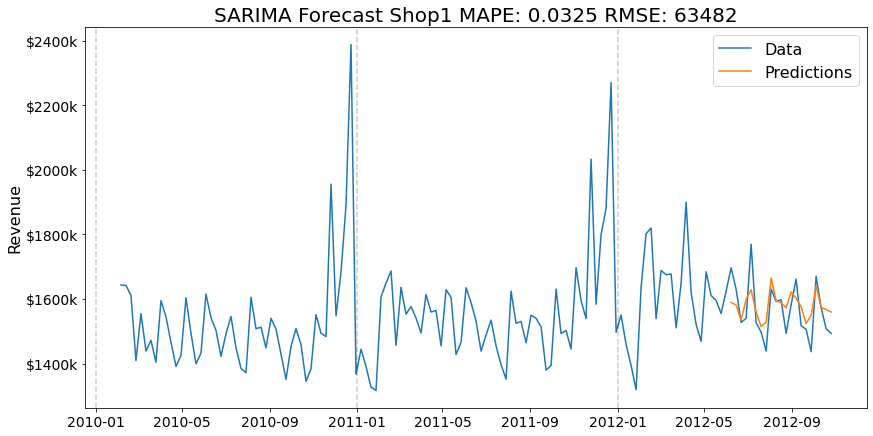

Mean Absolute Percent Error: 0.0239
Root Mean Squared Error: 60057


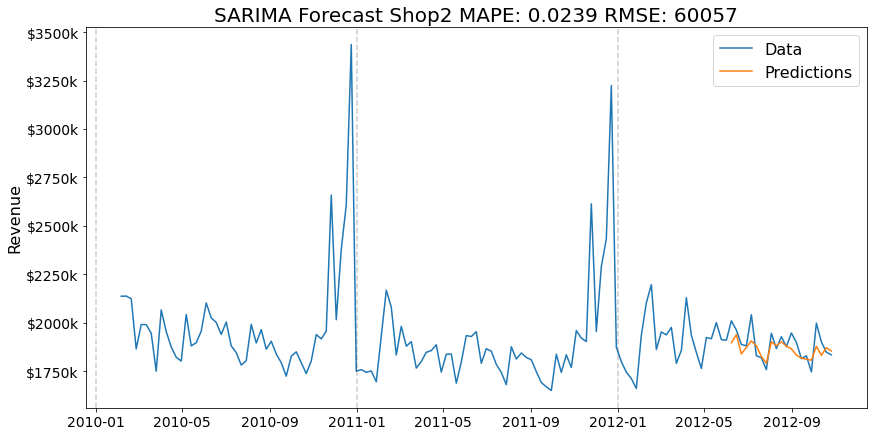

Mean Absolute Percent Error: 0.0333
Root Mean Squared Error: 16445


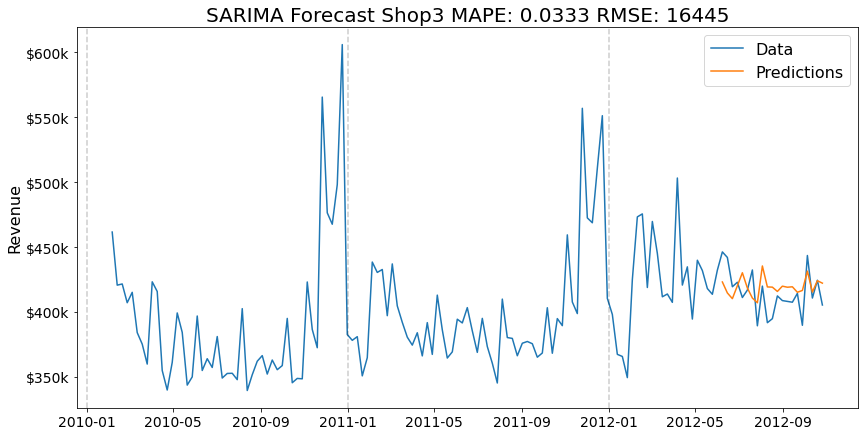

Mean Absolute Percent Error: 0.0324
Root Mean Squared Error: 80972


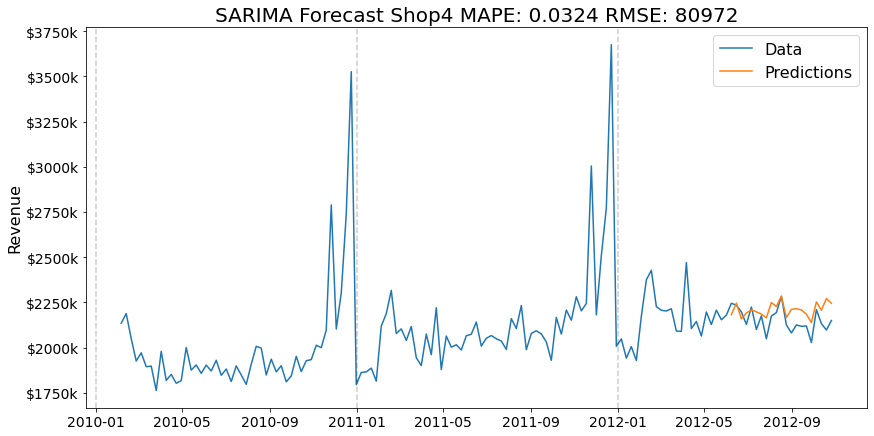

Mean Absolute Percent Error: 0.0535
Root Mean Squared Error: 19579


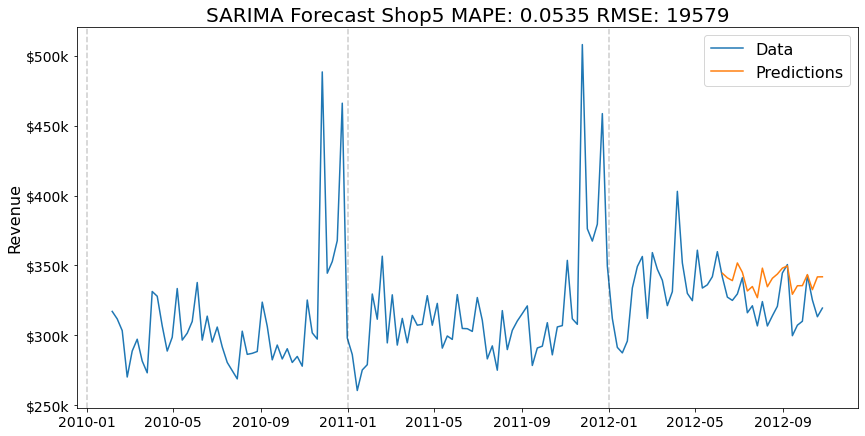

Mean Absolute Percent Error: 0.0344
Root Mean Squared Error: 72503


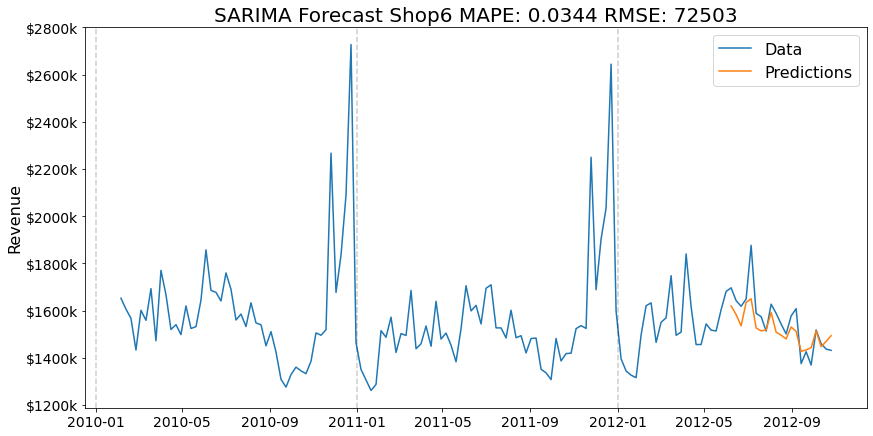

Mean Absolute Percent Error: 0.0737
Root Mean Squared Error: 50713


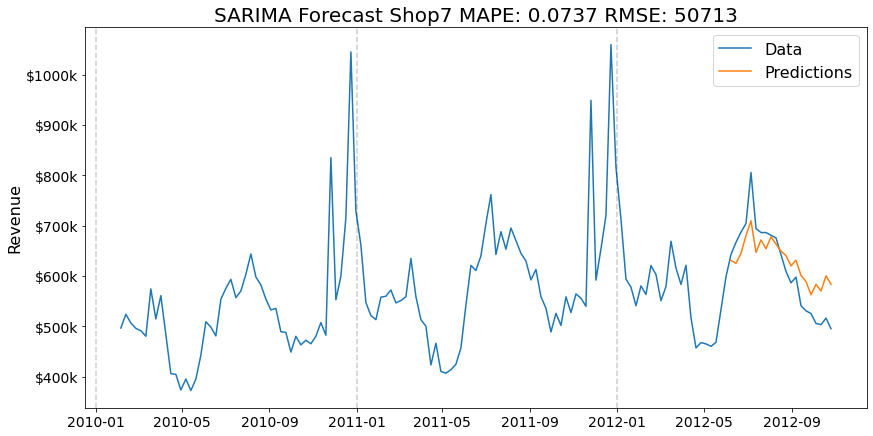

Mean Absolute Percent Error: 0.0248
Root Mean Squared Error: 26488


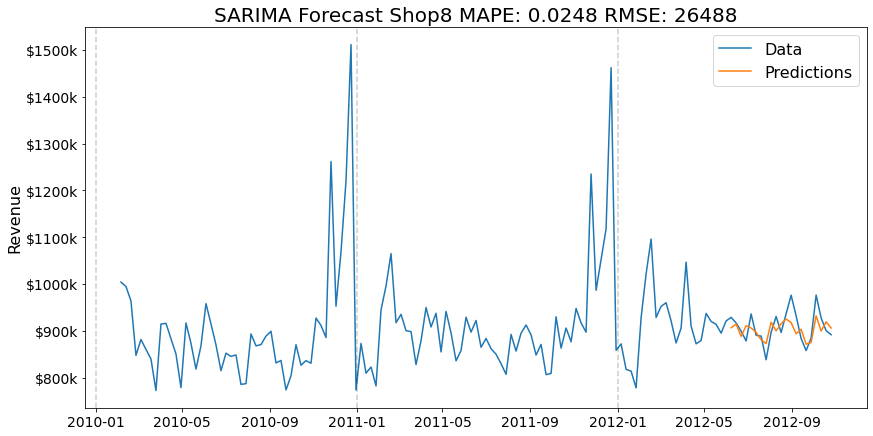

Mean Absolute Percent Error: 0.0374
Root Mean Squared Error: 23559


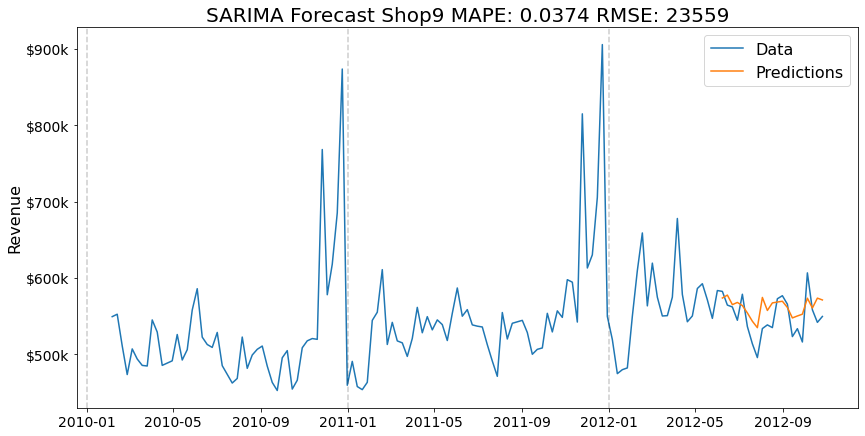

Mean Absolute Percent Error: 0.0418
Root Mean Squared Error: 85705


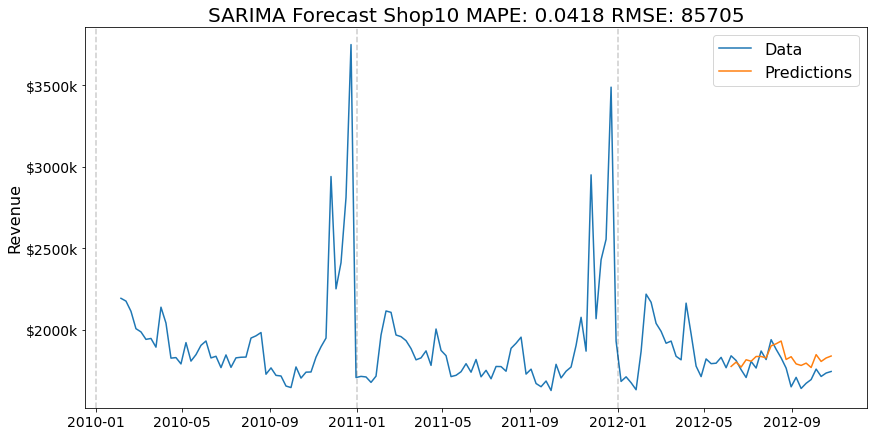

Mean Absolute Percent Error: 0.0402
Root Mean Squared Error: 65905


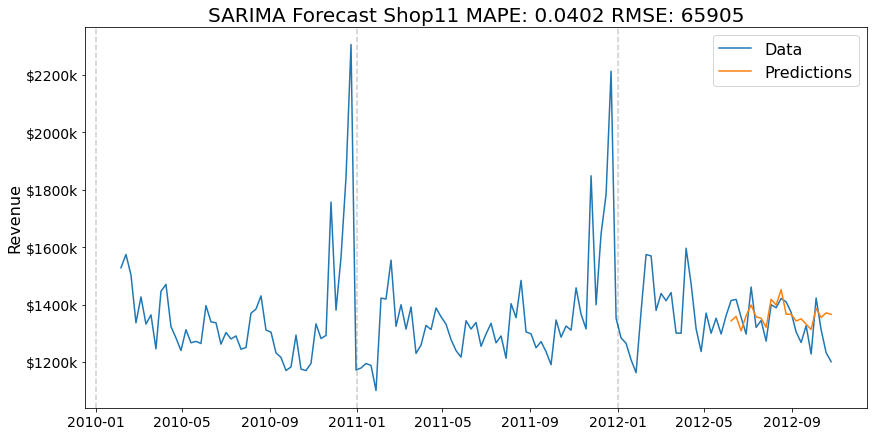

Mean Absolute Percent Error: 0.0285
Root Mean Squared Error: 36252


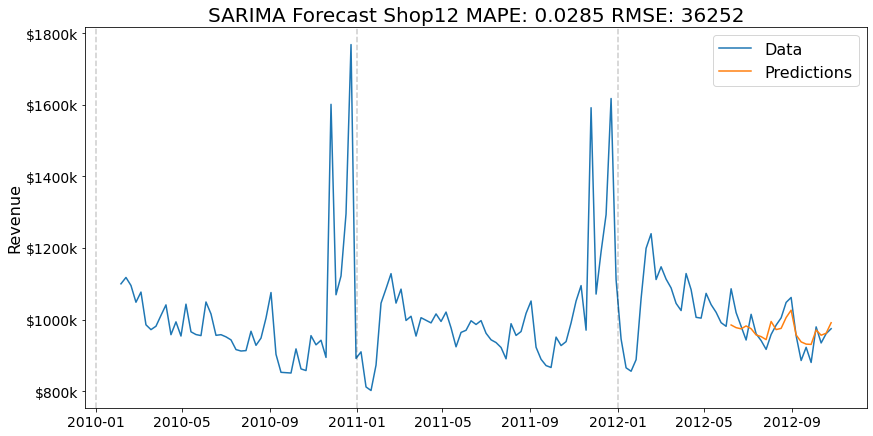

Mean Absolute Percent Error: 0.0291
Root Mean Squared Error: 70527


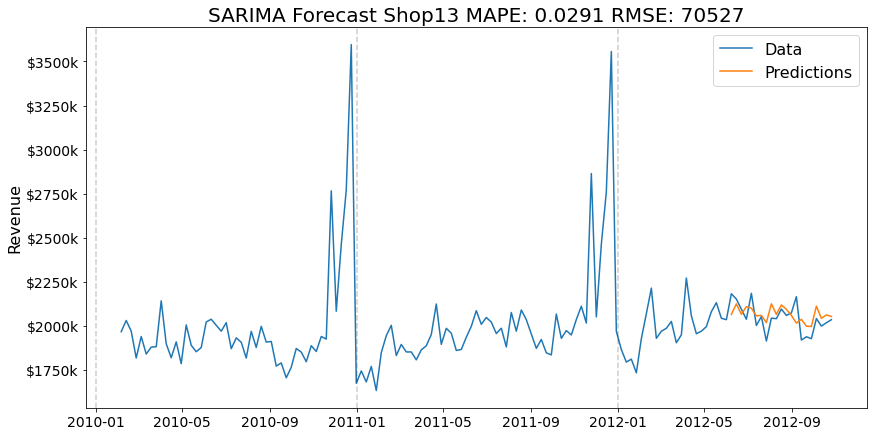

Mean Absolute Percent Error: 0.2211
Root Mean Squared Error: 378505


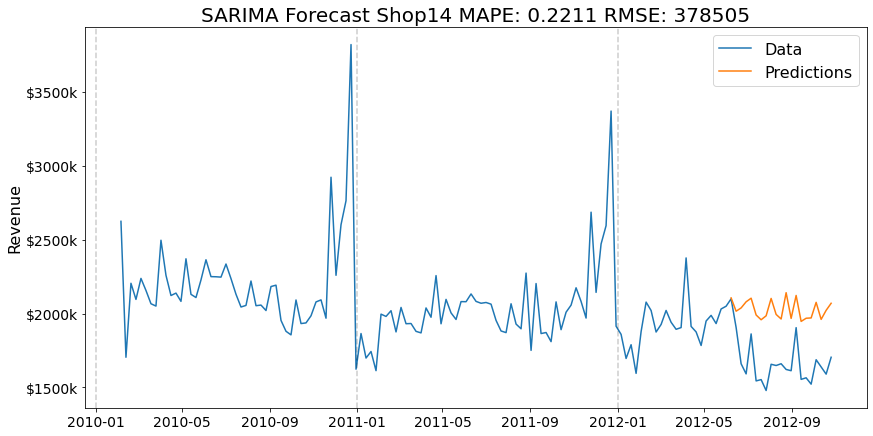

Mean Absolute Percent Error: 0.0475
Root Mean Squared Error: 31187


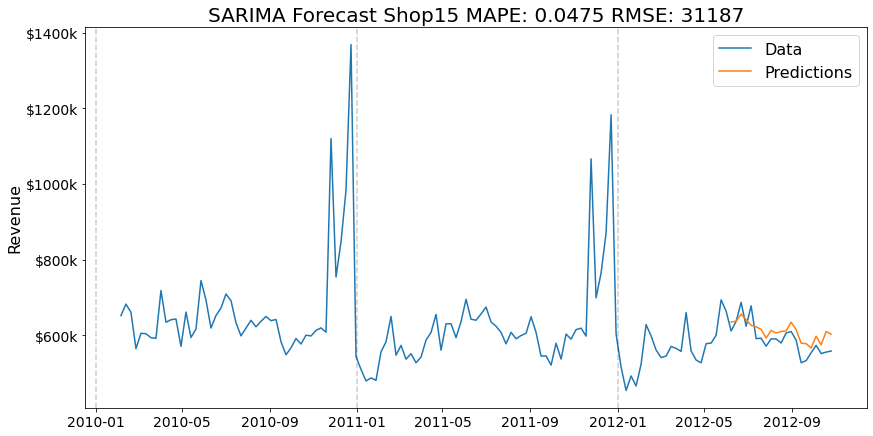

Mean Absolute Percent Error: 0.038
Root Mean Squared Error: 25027


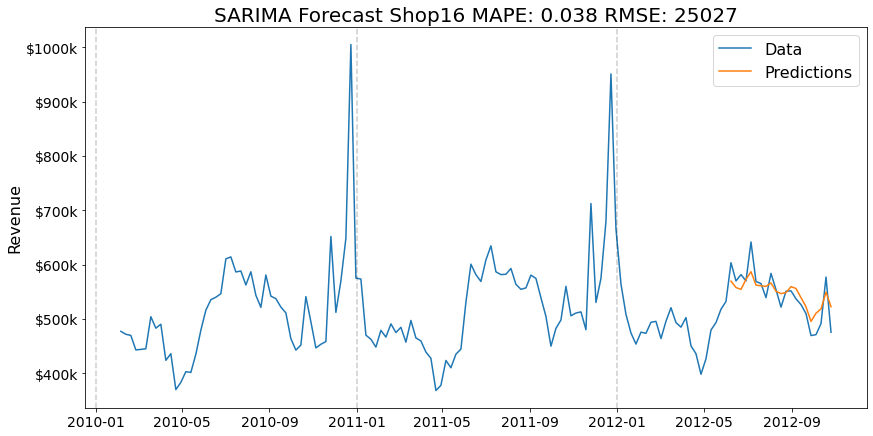

Mean Absolute Percent Error: 0.0381
Root Mean Squared Error: 48875


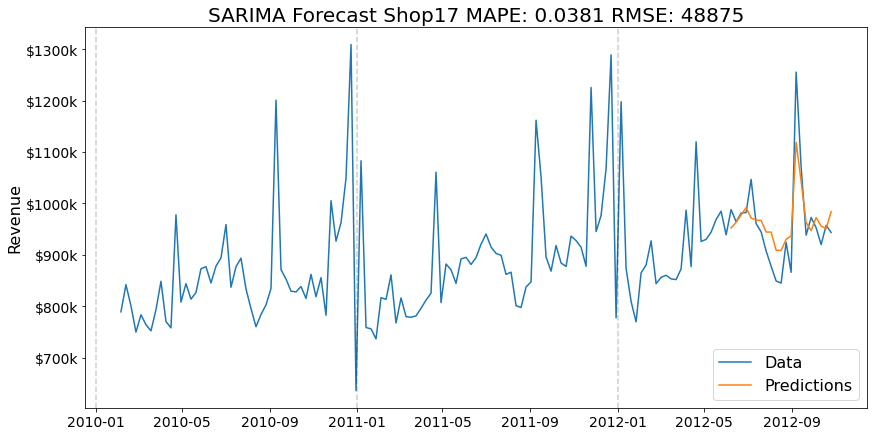

Mean Absolute Percent Error: 0.0405
Root Mean Squared Error: 70448


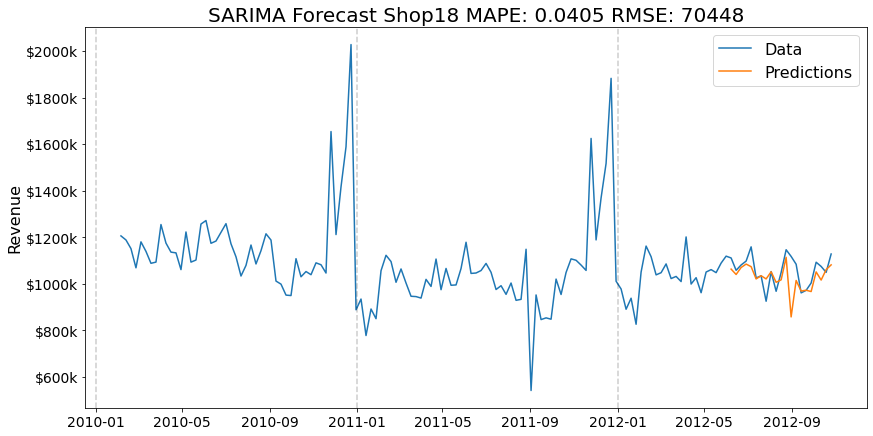

Mean Absolute Percent Error: 0.0401
Root Mean Squared Error: 64599


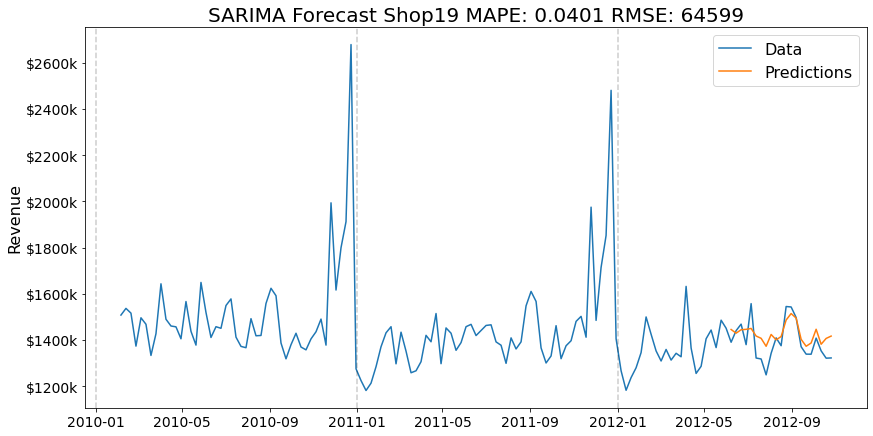

Mean Absolute Percent Error: 0.0443
Root Mean Squared Error: 104710


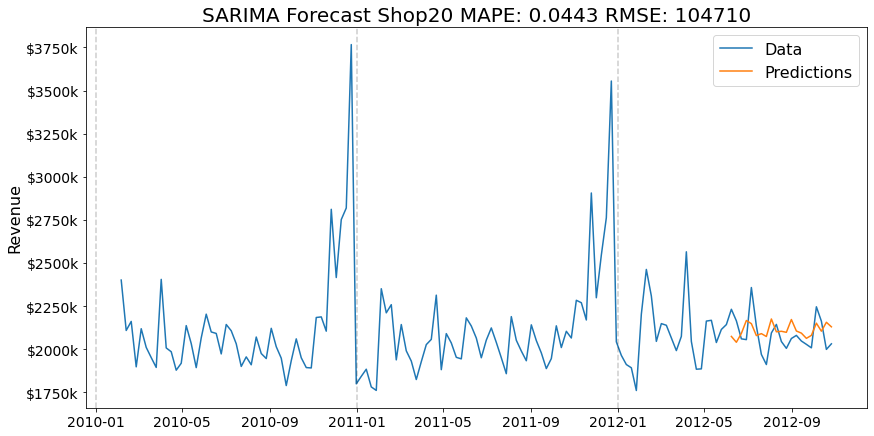

Mean Absolute Percent Error: 0.0856
Root Mean Squared Error: 61895


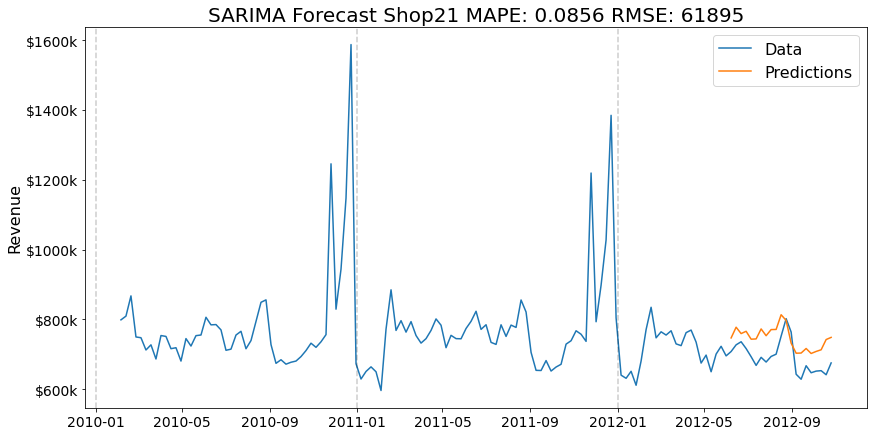

Mean Absolute Percent Error: 0.0336
Root Mean Squared Error: 40494


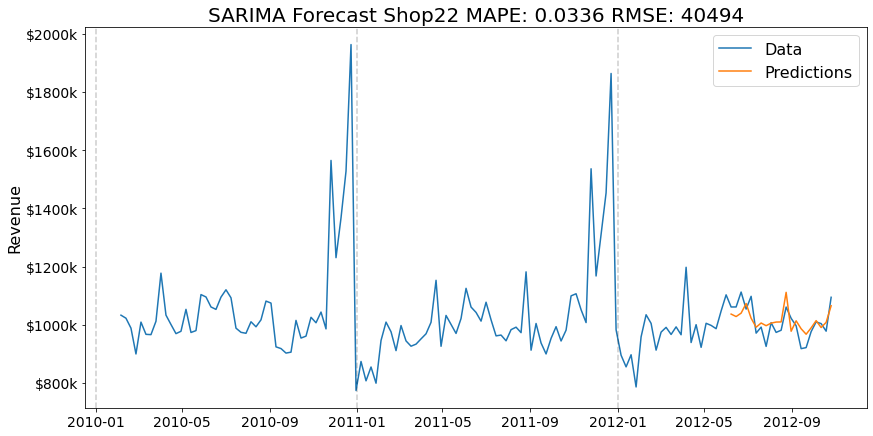

Mean Absolute Percent Error: 0.0386
Root Mean Squared Error: 77300


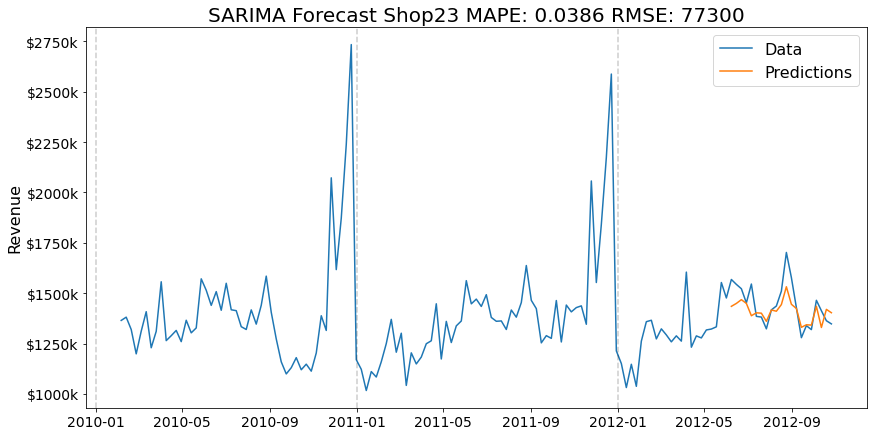

Mean Absolute Percent Error: 0.0384
Root Mean Squared Error: 65883


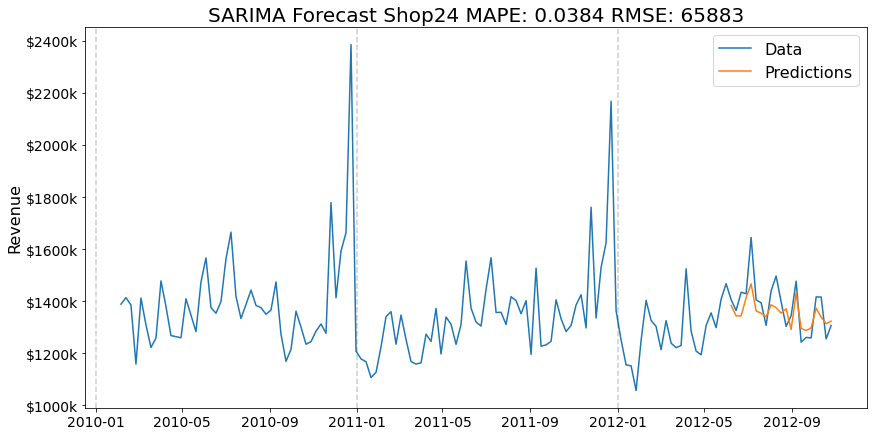

Mean Absolute Percent Error: 0.0312
Root Mean Squared Error: 27180


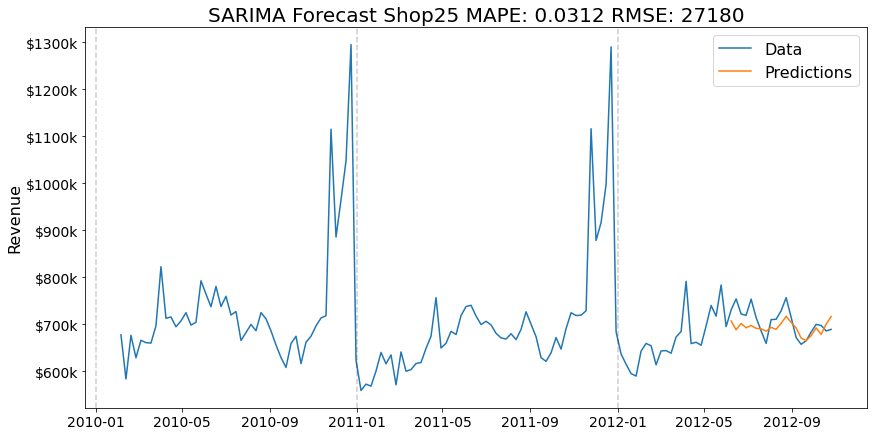

Mean Absolute Percent Error: 0.0286
Root Mean Squared Error: 36259


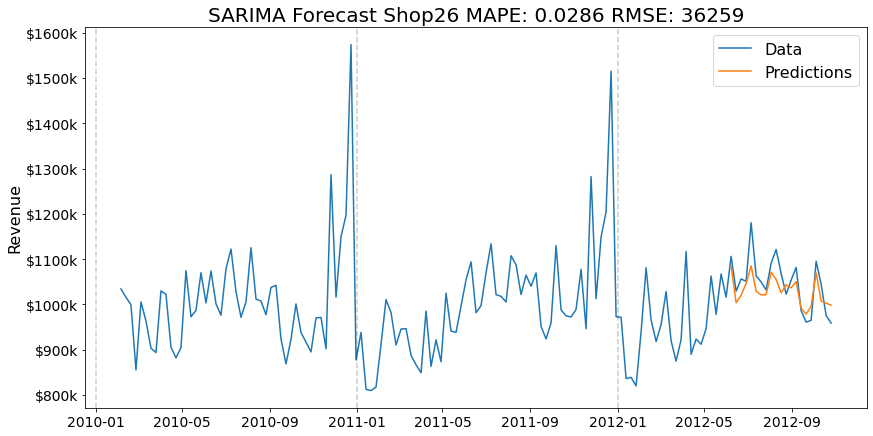

Mean Absolute Percent Error: 0.0335
Root Mean Squared Error: 75950


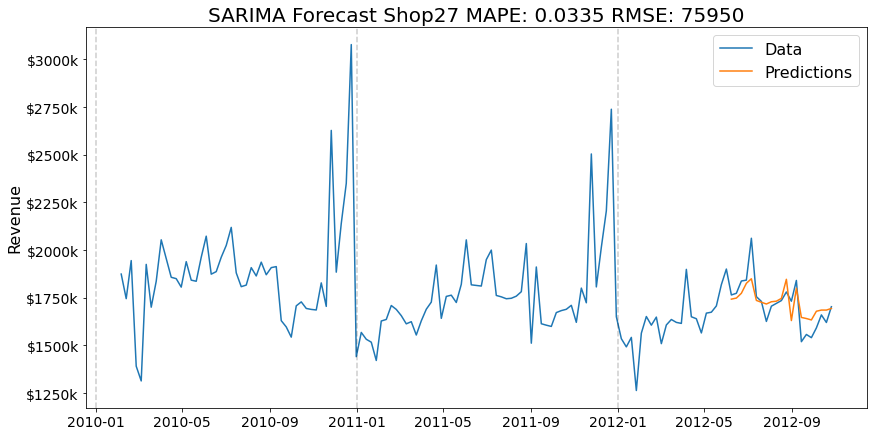

Mean Absolute Percent Error: 0.0787
Root Mean Squared Error: 105658


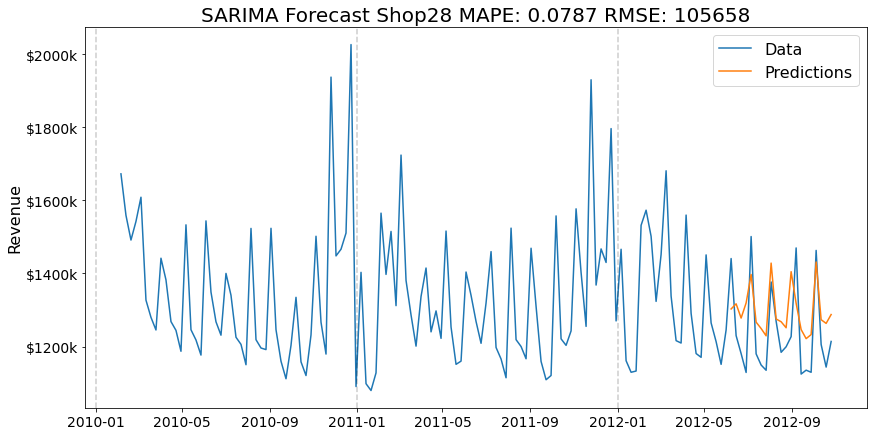

Mean Absolute Percent Error: 0.0412
Root Mean Squared Error: 30147


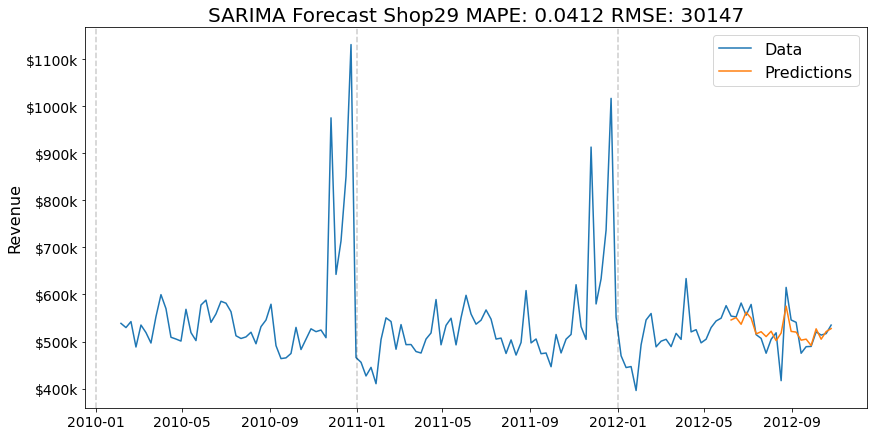

Mean Absolute Percent Error: 0.0222
Root Mean Squared Error: 11916


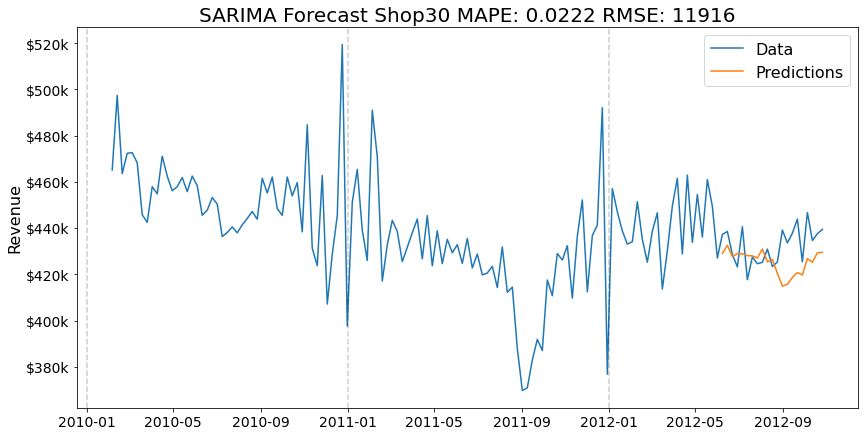

Mean Absolute Percent Error: 0.0276
Root Mean Squared Error: 42559


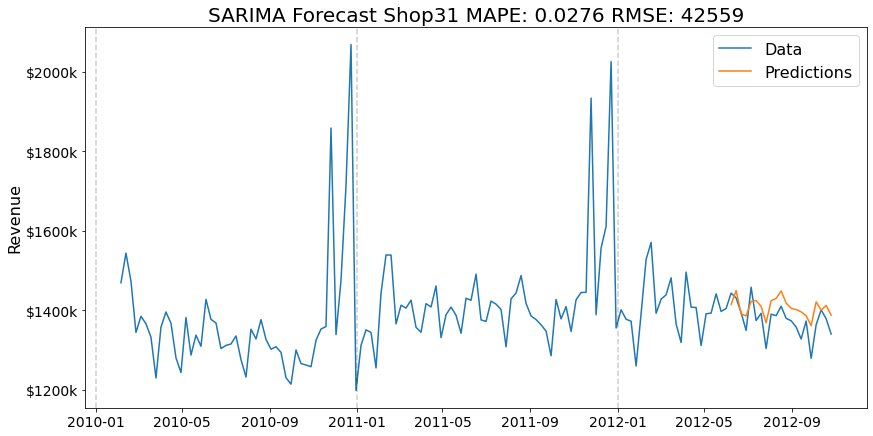

Mean Absolute Percent Error: 0.0232
Root Mean Squared Error: 32986


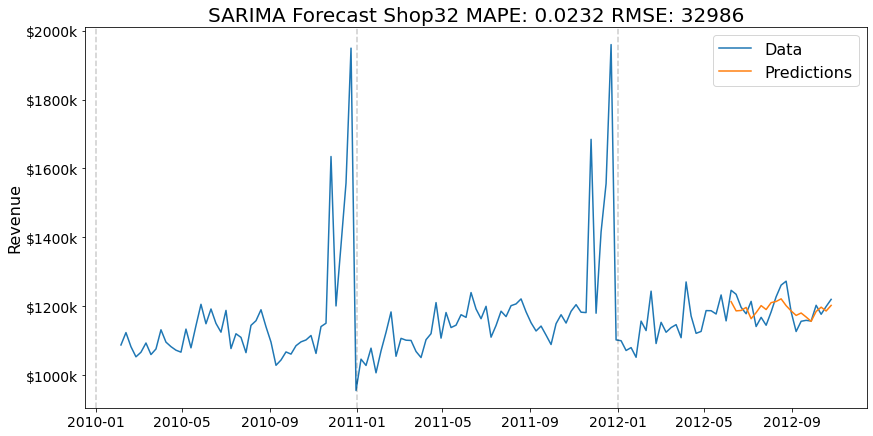

Mean Absolute Percent Error: 0.038
Root Mean Squared Error: 12950


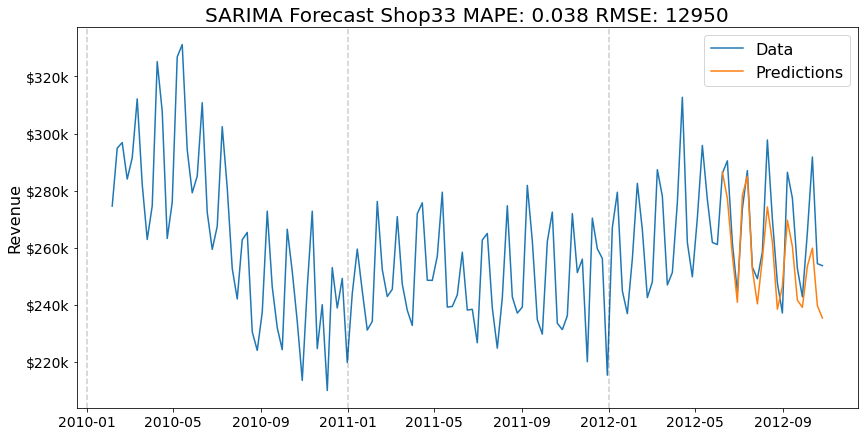

Mean Absolute Percent Error: 0.0183
Root Mean Squared Error: 20856


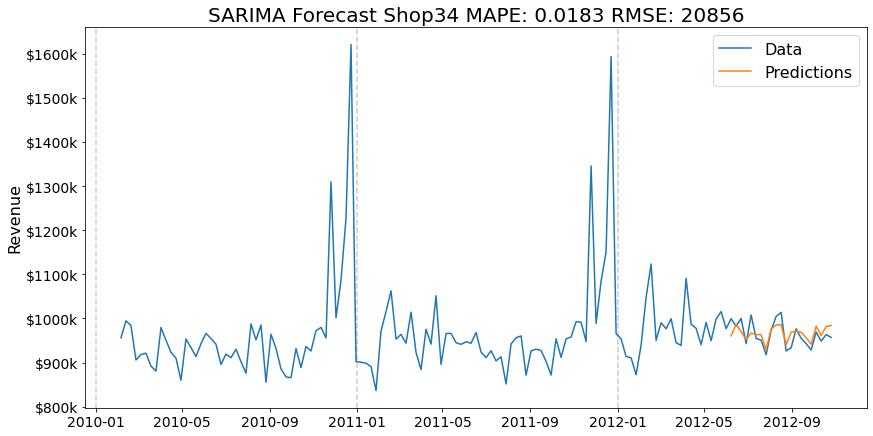

Mean Absolute Percent Error: 0.046
Root Mean Squared Error: 54820


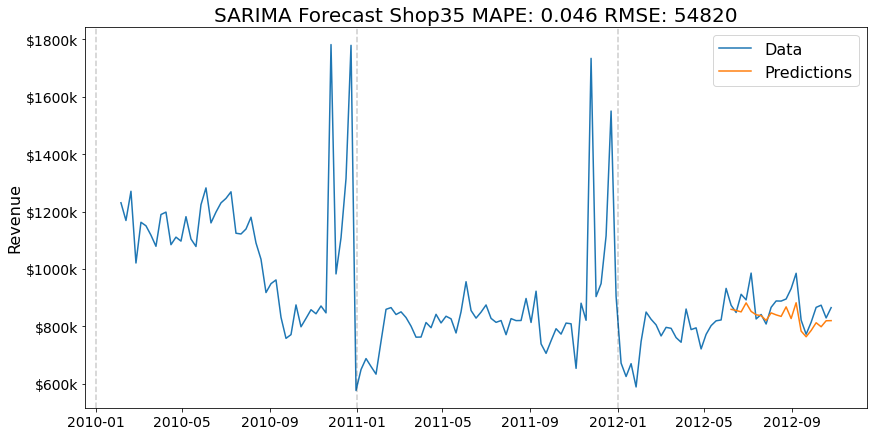

Mean Absolute Percent Error: 0.0725
Root Mean Squared Error: 23209


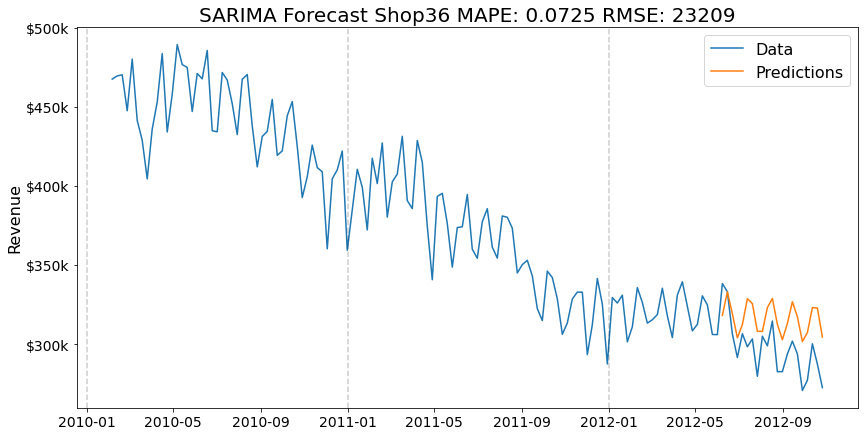

Mean Absolute Percent Error: 0.0359
Root Mean Squared Error: 21700


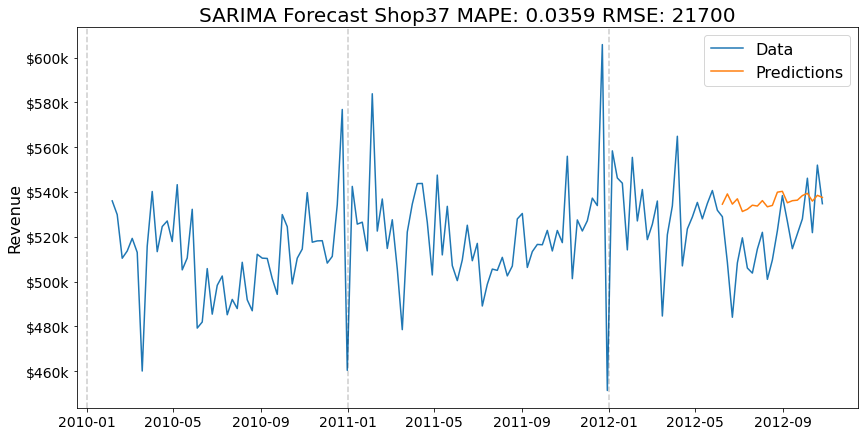

Mean Absolute Percent Error: 0.035
Root Mean Squared Error: 20439


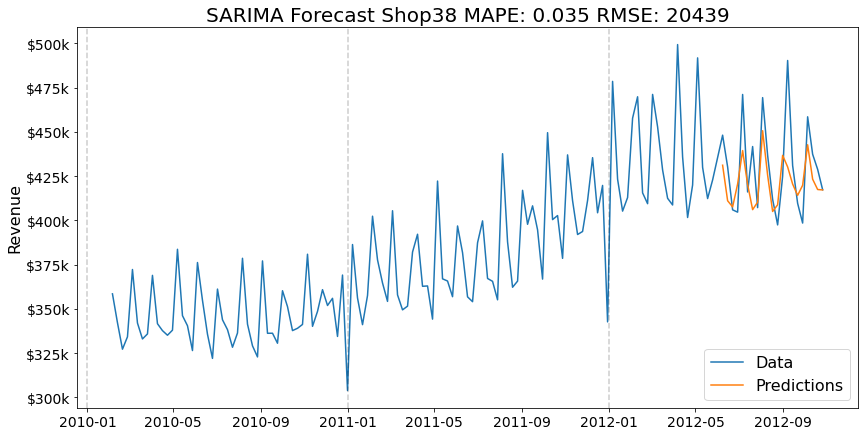

Mean Absolute Percent Error: 0.0285
Root Mean Squared Error: 58000


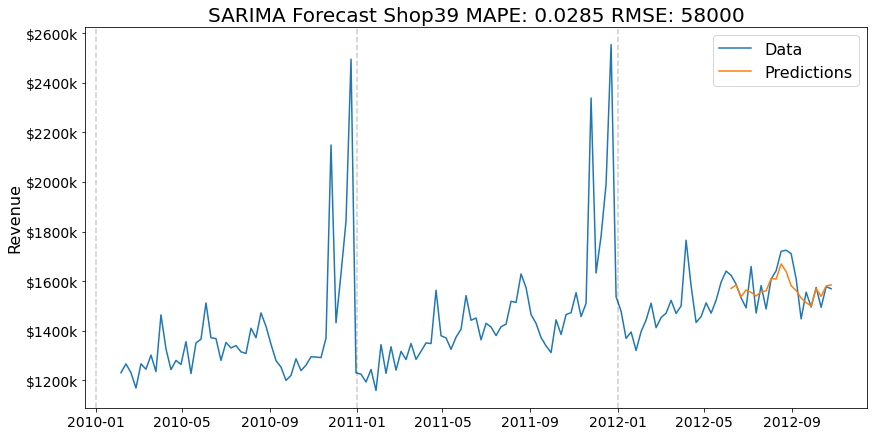

Mean Absolute Percent Error: 0.0376
Root Mean Squared Error: 48631


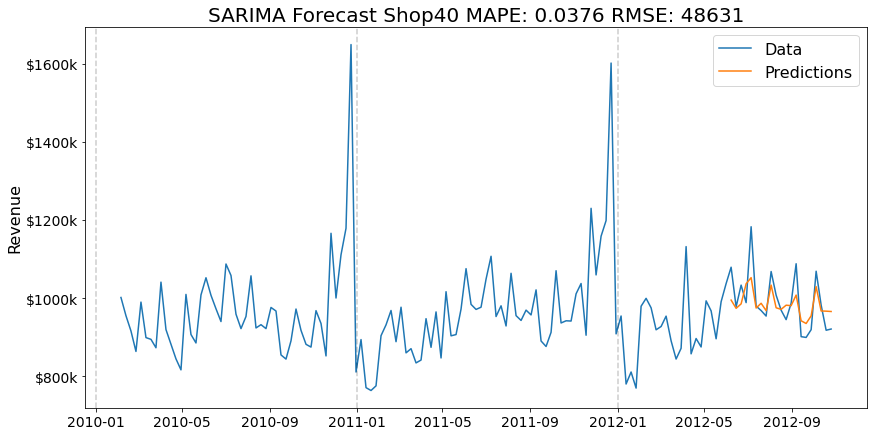

Mean Absolute Percent Error: 0.029
Root Mean Squared Error: 55865


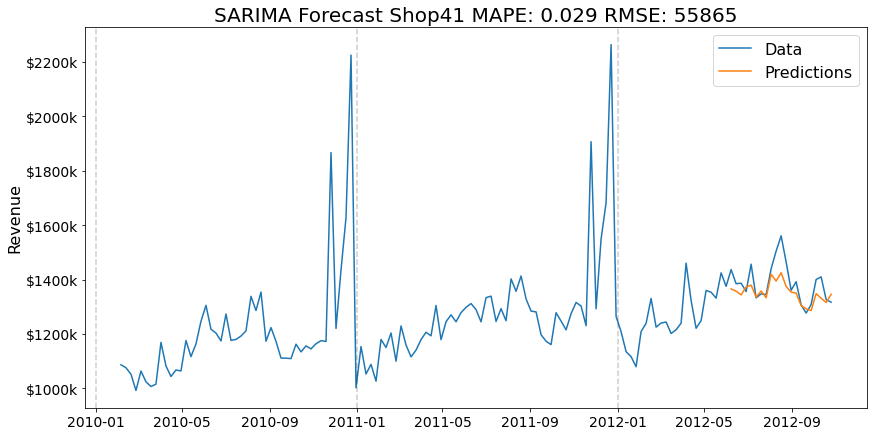

Mean Absolute Percent Error: 0.0315
Root Mean Squared Error: 21132


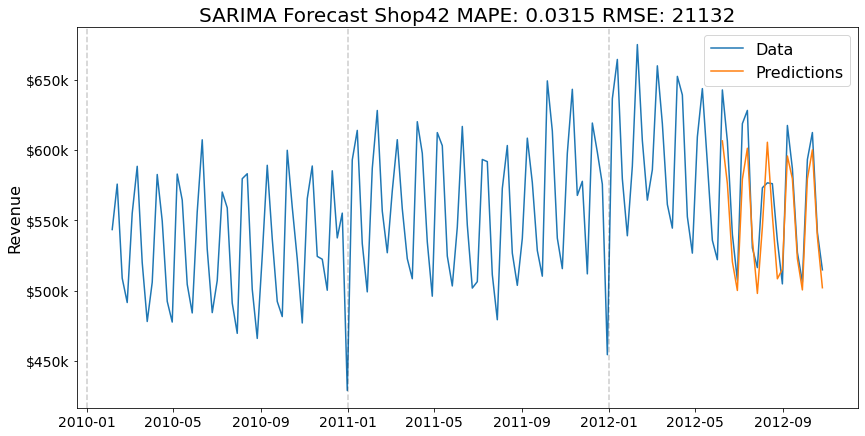

Mean Absolute Percent Error: 0.0187
Root Mean Squared Error: 13947


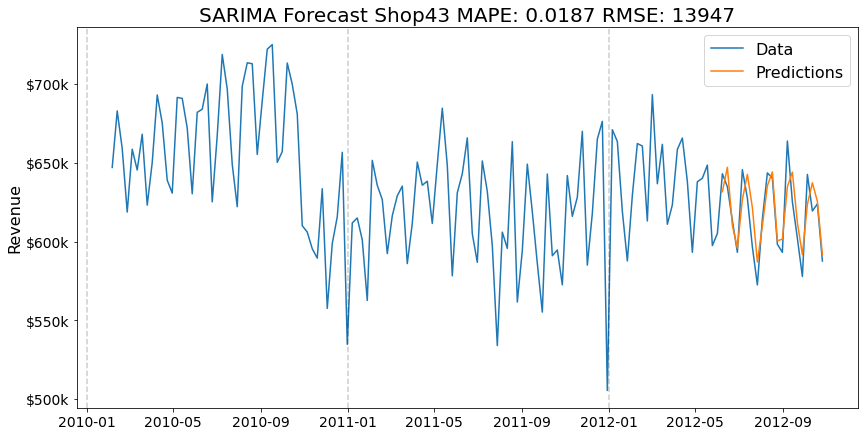

Mean Absolute Percent Error: 0.0348
Root Mean Squared Error: 14719


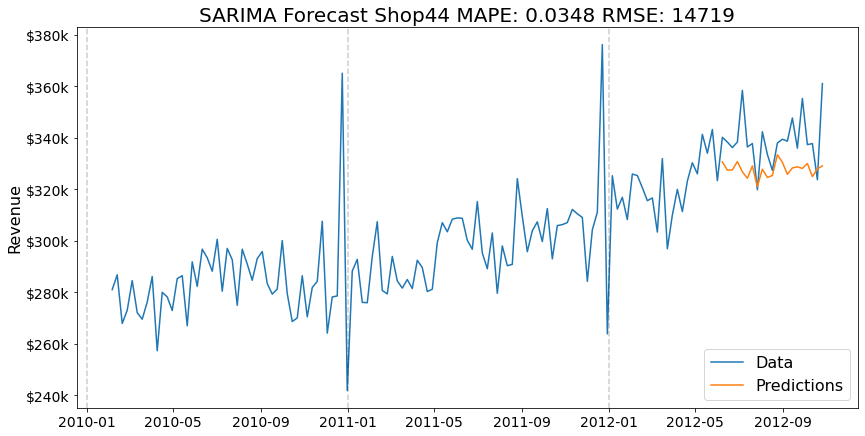

Mean Absolute Percent Error: 0.0556
Root Mean Squared Error: 45983


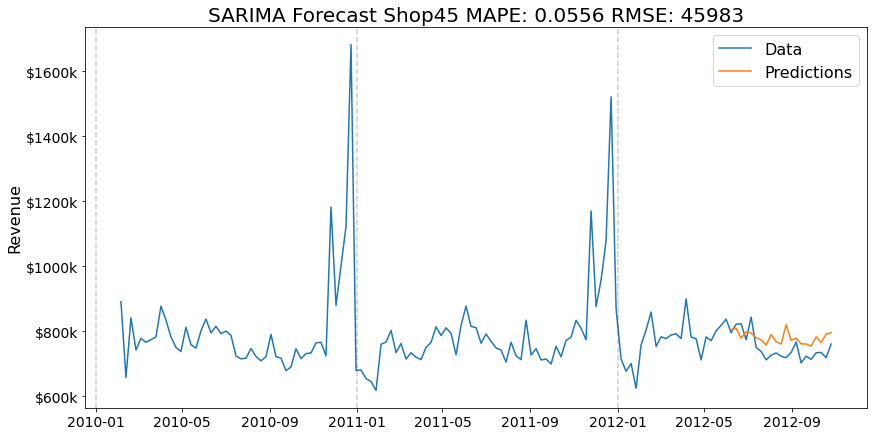

                      0             1              2             3   \
Date                                                                  
2012-06-08  1.589527e+06  1.896678e+06  423170.798395  2.182494e+06   
2012-06-15  1.581657e+06  1.938638e+06  414716.898241  2.246109e+06   
2012-06-22  1.534789e+06  1.839003e+06  410328.175184  2.158944e+06   
2012-06-29  1.599911e+06  1.873080e+06  420259.936571  2.192066e+06   
2012-07-06  1.628844e+06  1.906334e+06  430280.514842  2.207959e+06   
2012-07-13  1.559411e+06  1.881385e+06  418551.441149  2.197515e+06   
2012-07-20  1.514450e+06  1.825595e+06  410796.674332  2.185401e+06   
2012-07-27  1.528523e+06  1.790810e+06  407177.057381  2.164374e+06   
2012-08-03  1.665191e+06  1.901969e+06  435500.214920  2.249271e+06   
2012-08-10  1.594553e+06  1.881164e+06  419361.525027  2.226612e+06   
2012-08-17  1.588534e+06  1.901535e+06  419189.481083  2.284801e+06   
2012-08-24  1.572847e+06  1.879406e+06  415884.300065  2.166138e+06   
2012-0

In [12]:
# Create SARIMA forecasts based on the models
# Measure Errors
# Plot forecasts

from matplotlib.ticker import  FuncFormatter

start_date = datetime(2010,2,5)
end_date = datetime(2012,10, 26)

predictions = []
#residuals:= Difference between forecast and true value
residuals = []
#MeanError:= Mean percental difference between forecast and true values
MeanError = []
#RootMeanSqError:= Mean root of the square of the residual
RootMeanSqError = []

MeanSqError = []

test_datas = []

for i in range(45):
    prediction = model_fit[i].forecast(len(test_data[i]))
    predictions.append(pd.Series(prediction, index=test_data[i].index))
    test_data1 = pd.Series(test_data[i], index=test_data[i].index)
    test_datas.append(test_data1)

    residuals.append(test_data1 - predictions[i])
    MeanError.append(round(np.mean(abs(residuals[i]/test_data1)),4))
    RootMeanSqError.append(round(np.sqrt(np.mean(residuals[i]**2))))
    MeanSqError.append(round(np.mean(residuals[i]**2)))

    print('Mean Absolute Percent Error:', MeanError[i])
    print('Root Mean Squared Error:', RootMeanSqError[i])

    fig, ax = plt.subplots(figsize=(14,7))

    ax.plot(df_stores_revenue['Store{}'.format(i+1)])
    ax.plot(predictions[i])

    def thousands(x, pos):
        return '$%1.0fk' % (x*1e-3)

    formatter = FuncFormatter(thousands)

    ax.yaxis.set_major_formatter(formatter)


    ax.legend(('Data', 'Predictions'), fontsize=16)

    plt.title('SARIMA Forecast Shop{}'.format(i+1)+' MAPE: {}'.format(MeanError[i]) + ' RMSE: {}'.format(RootMeanSqError[i]), fontsize=20)
    plt.ylabel('Revenue', fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    for year in range(start_date.year,end_date.year+1):
        plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
    # Safe file
    #plt.savefig('SARIMA Store{}'.format(i+1)+'.jpg')
    plt.show()


# Saves the predicted values

dict = {}
for i in range(45):
    dict[i] = predictions[i]

df = pd.DataFrame(data=dict)
df.to_csv("predictions_SARIMA.csv", sep=',',index=True)

#print(df)

In [13]:
# Saves the Mean Error

dict = []
for i in range(45):
    dict.append(MeanError[i])

df = pd.DataFrame(data=dict)
print(df)
df.to_csv("MeanError_SARIMA.csv", sep=';')

         0
0   0.0325
1   0.0239
2   0.0333
3   0.0324
4   0.0535
5   0.0344
6   0.0737
7   0.0248
8   0.0374
9   0.0418
10  0.0402
11  0.0285
12  0.0291
13  0.2211
14  0.0475
15  0.0380
16  0.0381
17  0.0405
18  0.0401
19  0.0443
20  0.0856
21  0.0336
22  0.0386
23  0.0384
24  0.0312
25  0.0286
26  0.0335
27  0.0787
28  0.0412
29  0.0222
30  0.0276
31  0.0232
32  0.0380
33  0.0183
34  0.0460
35  0.0725
36  0.0359
37  0.0350
38  0.0285
39  0.0376
40  0.0290
41  0.0315
42  0.0187
43  0.0348
44  0.0556


In [21]:
# Saves the MSE

dict = []
for i in range(45):
    dict.append(MeanSqError[i])

df = pd.DataFrame(data=dict)
print('MSE SARIMA')
print(df)
df.to_csv("MeanSqError_SARIMA.csv", sep=';')

MSE SARIMA
               0
0     4029961116
1     3606806577
2      270439966
3     6556408352
4      383347081
5     5256701857
6     2571837285
7      701607079
8      555038142
9     7345314915
10    4343423935
11    1314219582
12    4974098738
13  143265892136
14     972632008
15     626352768
16    2388755984
17    4962872002
18    4173075114
19   10964179791
20    3830995074
21    1639748721
22    5975250518
23    4340603196
24     738777989
25    1314729009
26    5768352819
27   11163634039
28     908847745
29     141981900
30    1811293403
31    1088063610
32     167692856
33     434961217
34    3005247577
35     538648749
36     470879006
37     417765974
38    3364011173
39    2365019873
40    3120843331
41     446545681
42     194509815
43     216645209
44    2114477934


In [22]:
# Saves the residuals

dict = {}
for i in range(45):
    dict[i] = residuals[i]

df = pd.DataFrame(data=dict)
df.to_csv("residuals_SARIMA.csv", sep=',',index=True)

In [14]:
# Imports data for LSTM plots and error calculations

def parser(s):
    return datetime.strptime(s, "%d.%m.%Y")

df_pred_LSTM = pd.read_csv('85perc_prediction_lstm.csv', sep=';',parse_dates=[0], index_col=0, squeeze=True, date_parser=parser)
df_pred_LSTM.index = pd.to_datetime(df_pred_LSTM.index)

print(df_pred_LSTM.head())

                 Store1       Store2       Store3       Store4       Store5  \
Date                                                                          
2012-06-08  1439268.360  2008363.040  411976.9178  2098293.754  408753.4203   
2012-06-15  1513714.003  1997173.916  419000.7467  2091189.725  404846.9104   
2012-06-22  1520609.562  2013586.683  410903.8710  2075905.559  391882.9325   
2012-06-29  1429556.872  2077235.689  402376.5256  1990964.891  401333.4200   
2012-07-06  1464250.225  2102638.862  415292.2816  2080871.232  398563.6927   

                 Store6       Store7       Store8       Store9      Store10  \
Date                                                                          
2012-06-08  1606621.574  496979.1686  810808.9625  548764.3220  1993985.354   
2012-06-15  1602225.012  503035.3055  839435.1711  554811.9147  1982371.815   
2012-06-22  1596979.333  501854.1299  852731.9213  569152.3616  1937874.179   
2012-06-29  1540744.028  506322.8074  814975.2632  

Mean Absolute Percent Error: 0.0595
Root Mean Squared Error: 122971


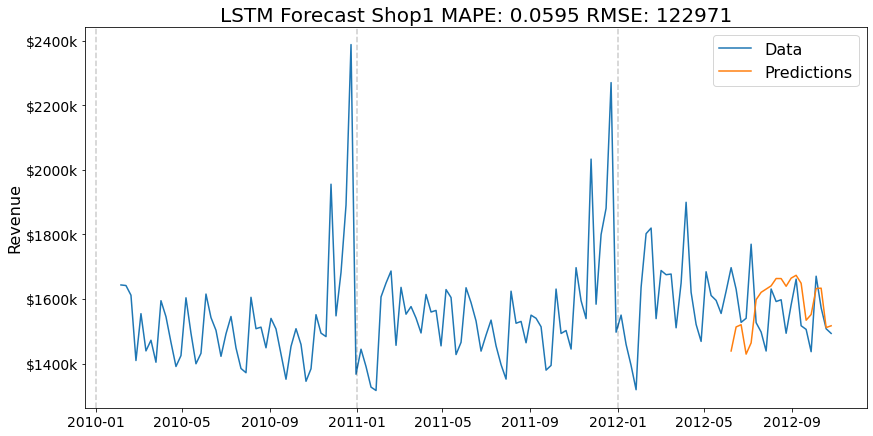

Mean Absolute Percent Error: 0.095
Root Mean Squared Error: 194859


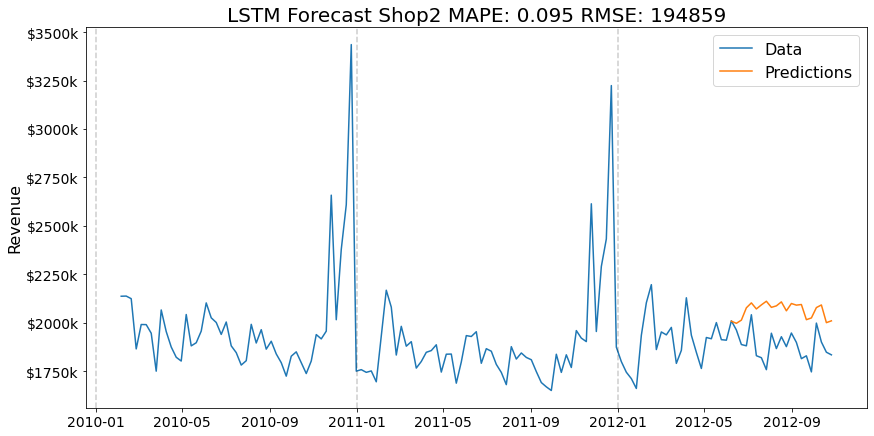

Mean Absolute Percent Error: 0.0413
Root Mean Squared Error: 19799


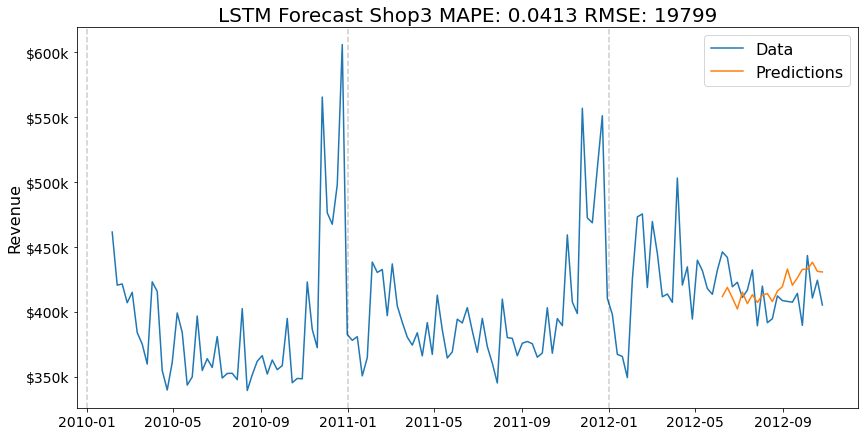

Mean Absolute Percent Error: 0.0328
Root Mean Squared Error: 85332


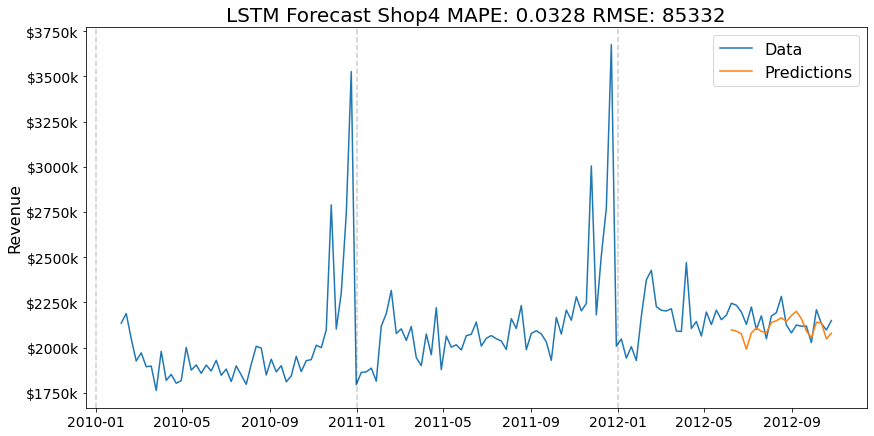

Mean Absolute Percent Error: 0.2488
Root Mean Squared Error: 81279


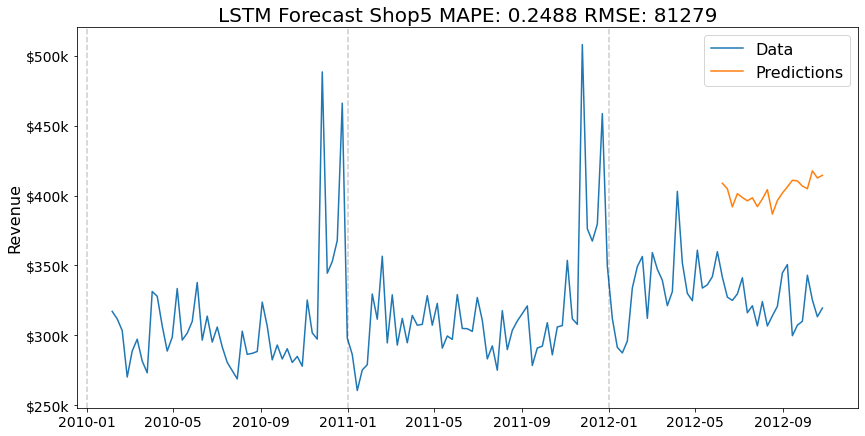

Mean Absolute Percent Error: 0.0783
Root Mean Squared Error: 140832


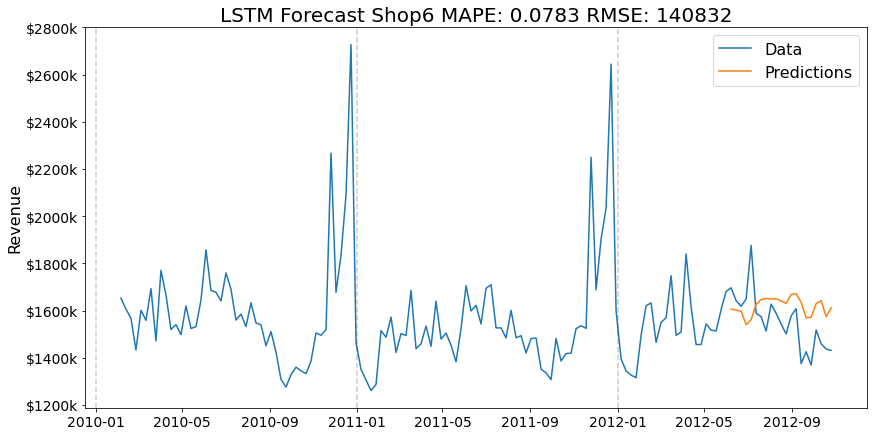

Mean Absolute Percent Error: 0.1842
Root Mean Squared Error: 145469


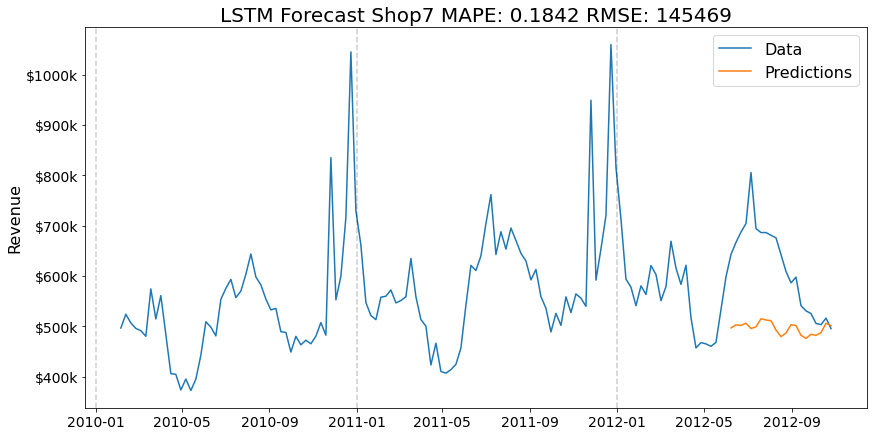

Mean Absolute Percent Error: 0.0656
Root Mean Squared Error: 69971


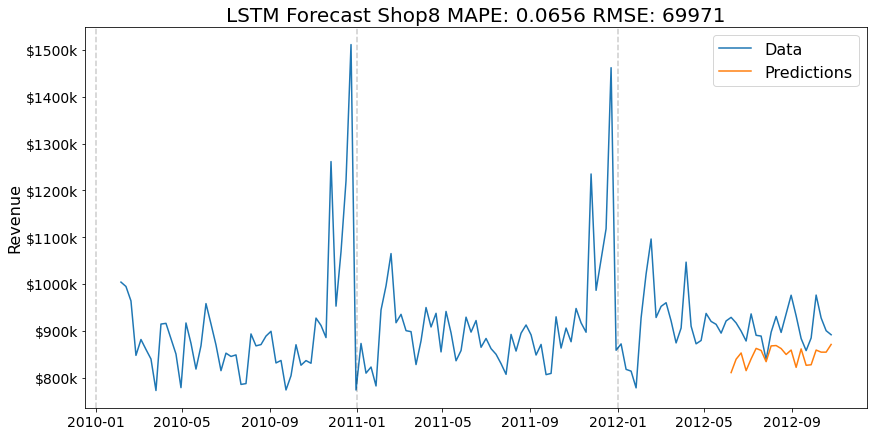

Mean Absolute Percent Error: 0.0383
Root Mean Squared Error: 27159


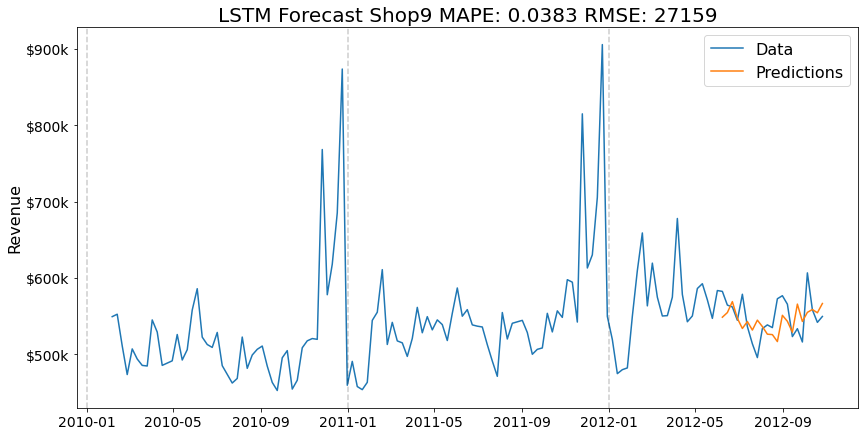

Mean Absolute Percent Error: 0.1347
Root Mean Squared Error: 259443


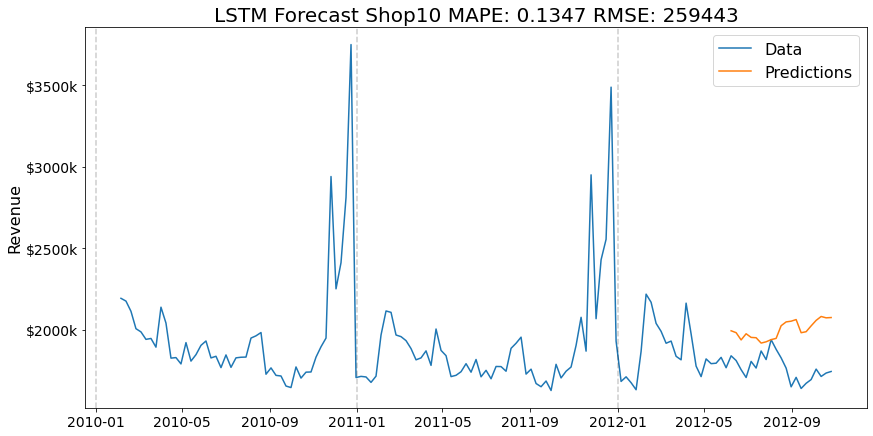

Mean Absolute Percent Error: 0.0479
Root Mean Squared Error: 74768


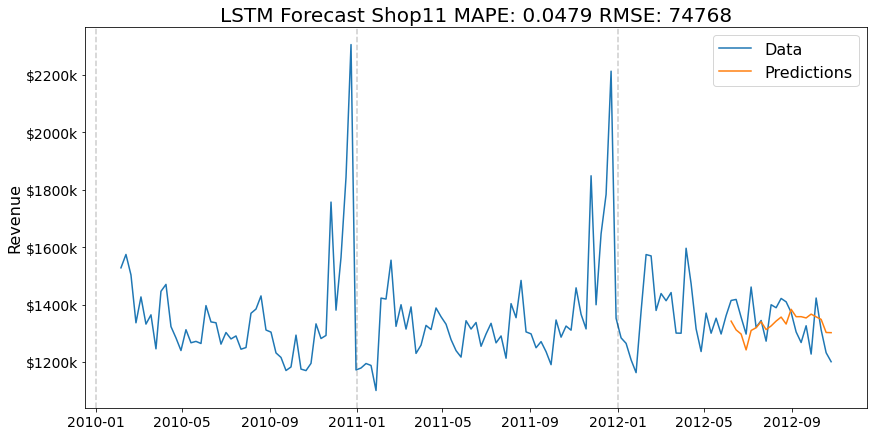

Mean Absolute Percent Error: 0.0435
Root Mean Squared Error: 48589


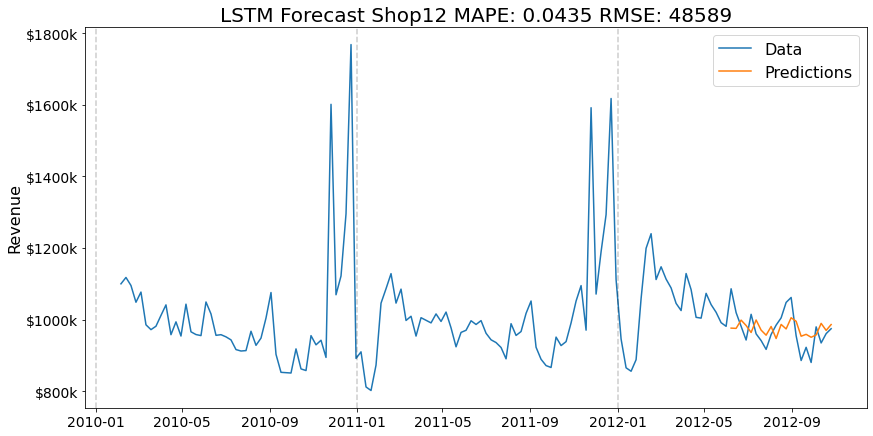

Mean Absolute Percent Error: 0.1298
Root Mean Squared Error: 284412


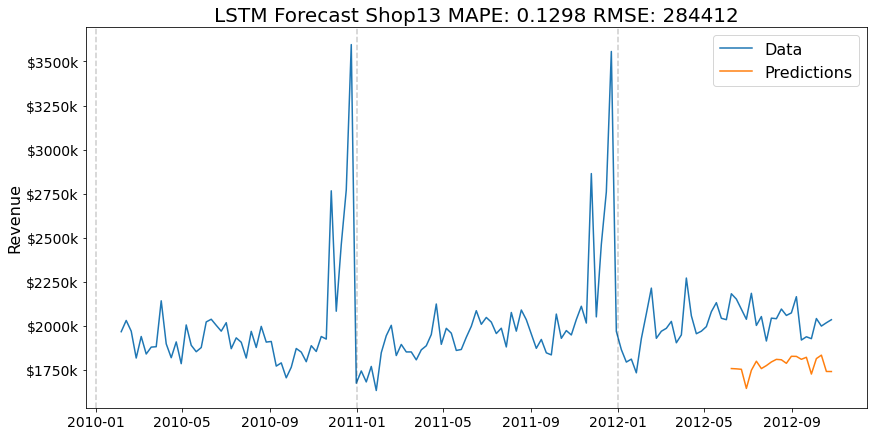

Mean Absolute Percent Error: 0.2015
Root Mean Squared Error: 363120


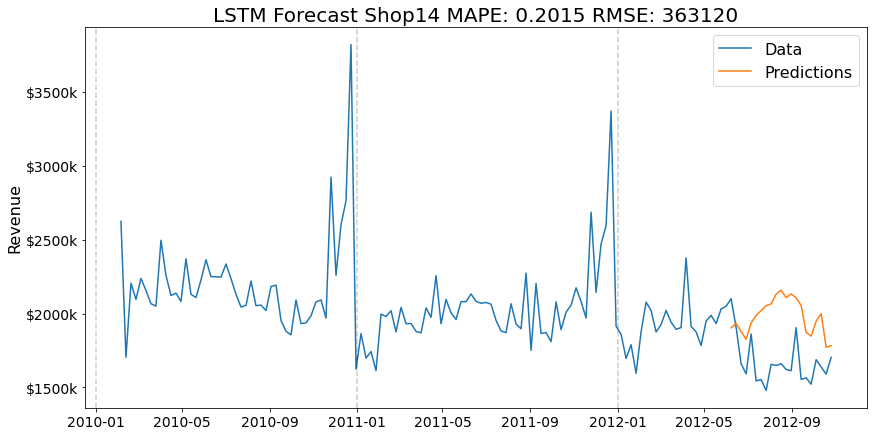

Mean Absolute Percent Error: 0.2896
Root Mean Squared Error: 172856


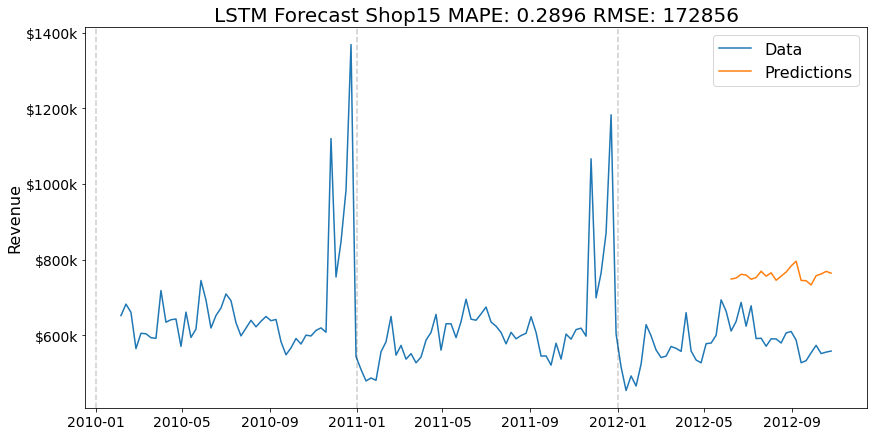

Mean Absolute Percent Error: 0.1555
Root Mean Squared Error: 100670


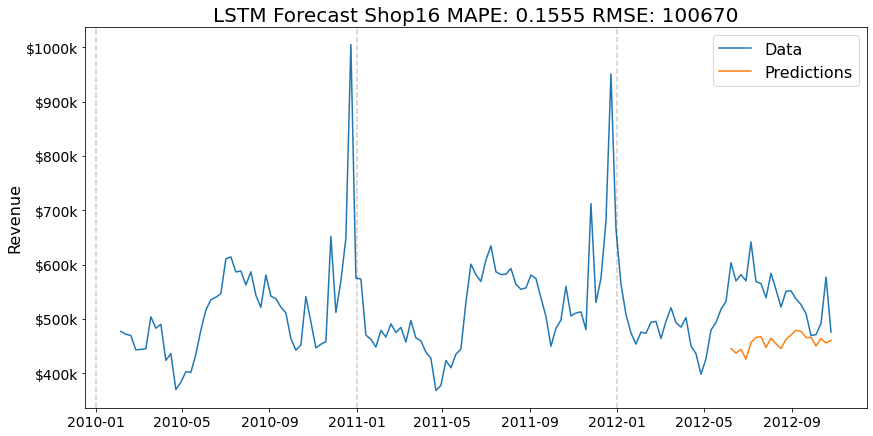

Mean Absolute Percent Error: 0.1639
Root Mean Squared Error: 183785


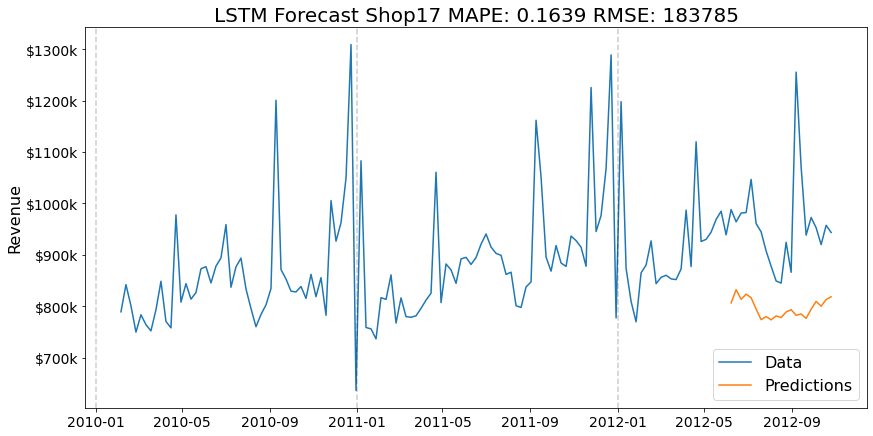

Mean Absolute Percent Error: 0.0971
Root Mean Squared Error: 115964


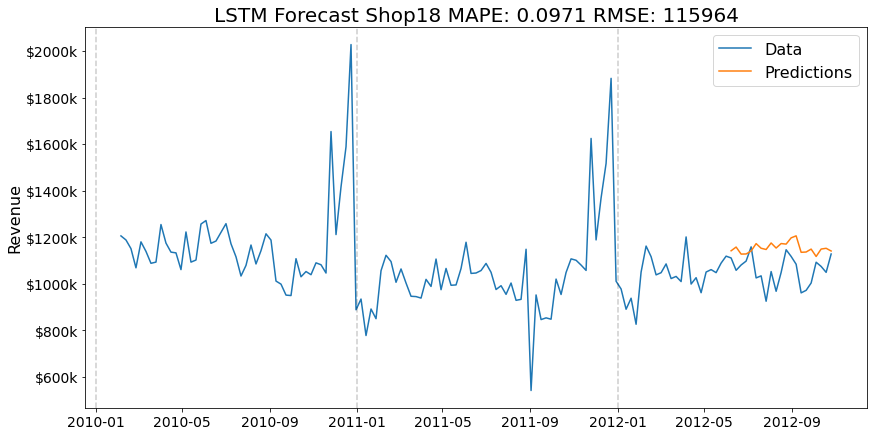

Mean Absolute Percent Error: 0.2009
Root Mean Squared Error: 294635


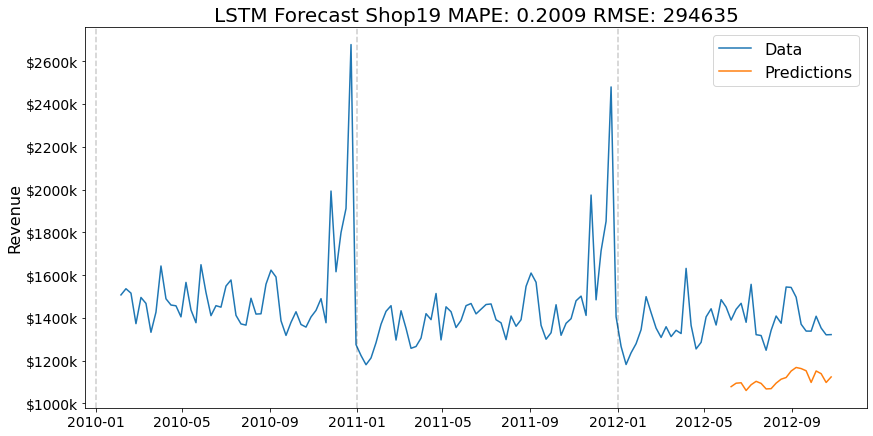

Mean Absolute Percent Error: 0.1442
Root Mean Squared Error: 329977


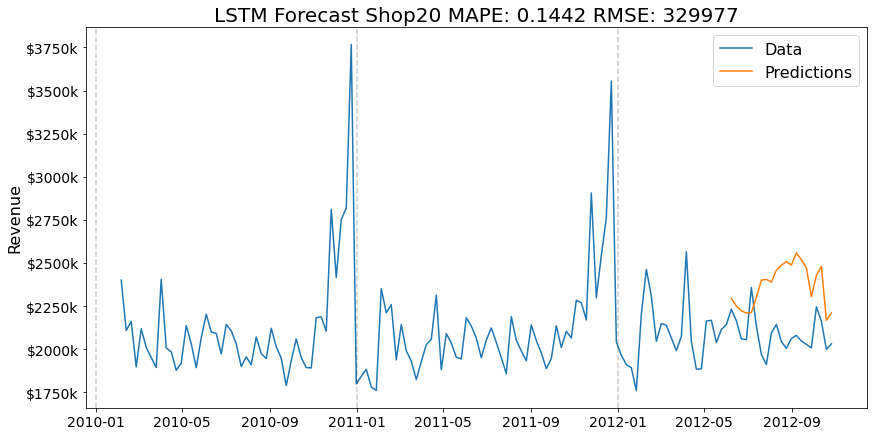

Mean Absolute Percent Error: 0.1847
Root Mean Squared Error: 134440


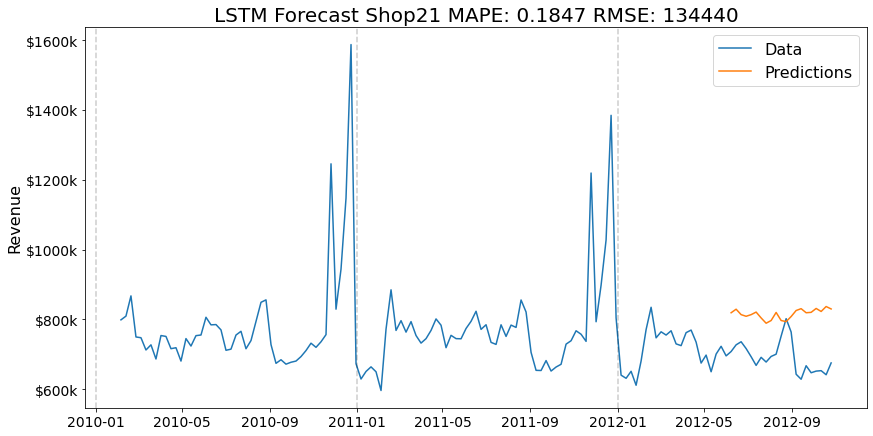

Mean Absolute Percent Error: 0.1939
Root Mean Squared Error: 205312


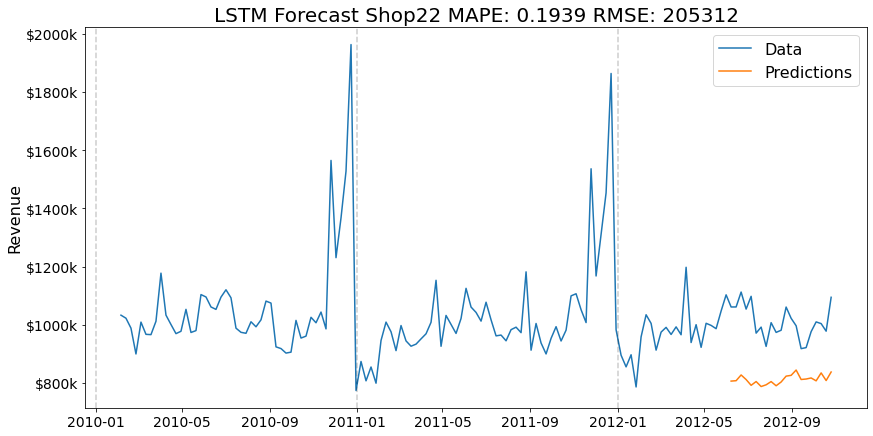

Mean Absolute Percent Error: 0.1479
Root Mean Squared Error: 244180


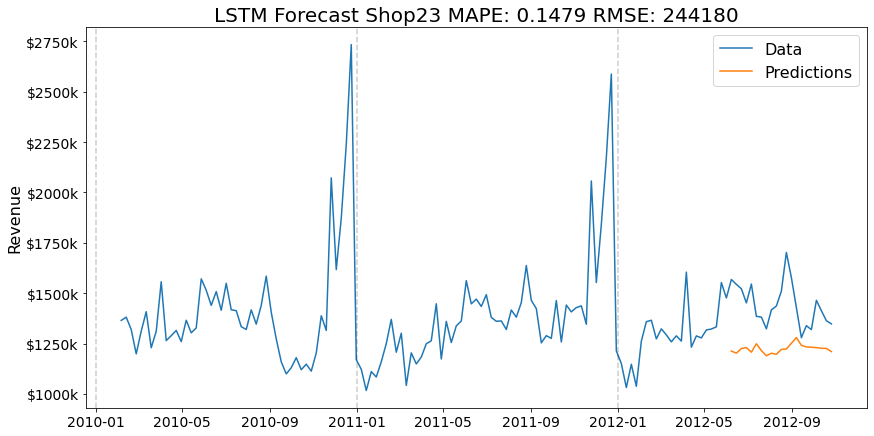

Mean Absolute Percent Error: 0.0569
Root Mean Squared Error: 100603


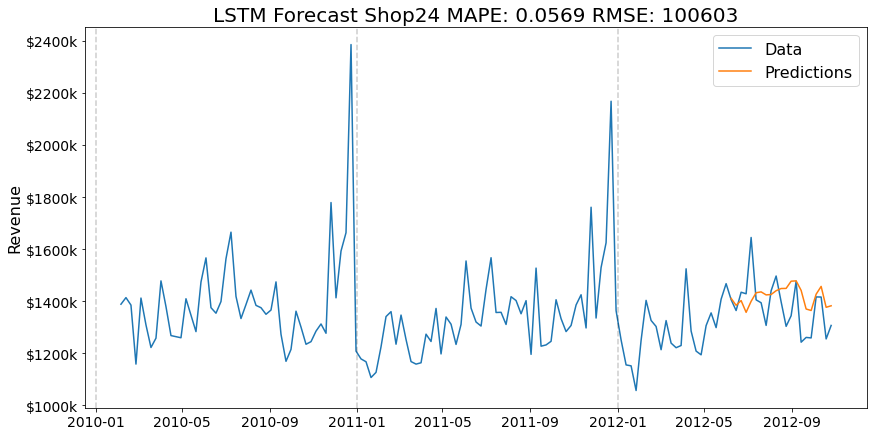

Mean Absolute Percent Error: 0.2497
Root Mean Squared Error: 179476


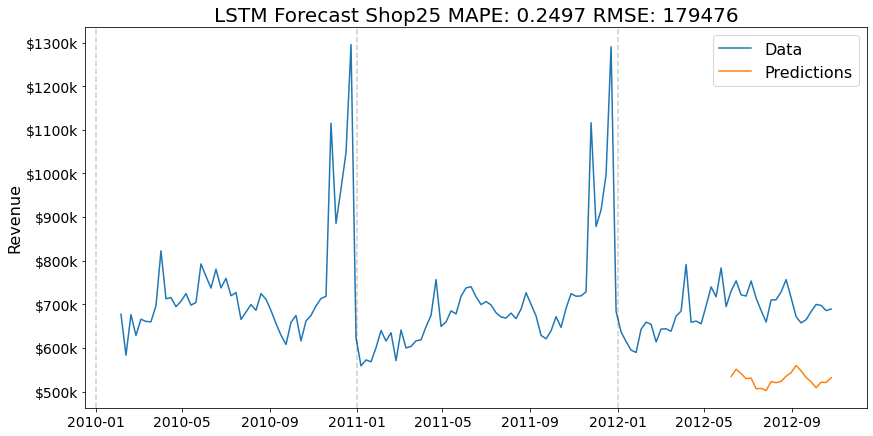

Mean Absolute Percent Error: 0.0487
Root Mean Squared Error: 63006


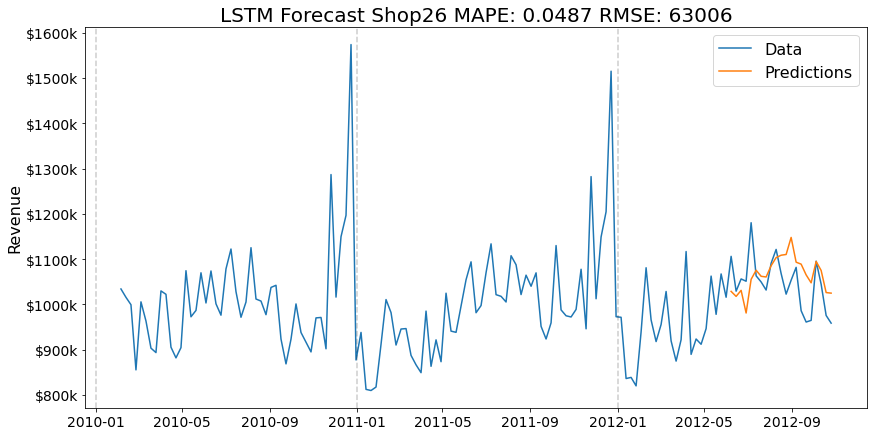

Mean Absolute Percent Error: 0.3068
Root Mean Squared Error: 540585


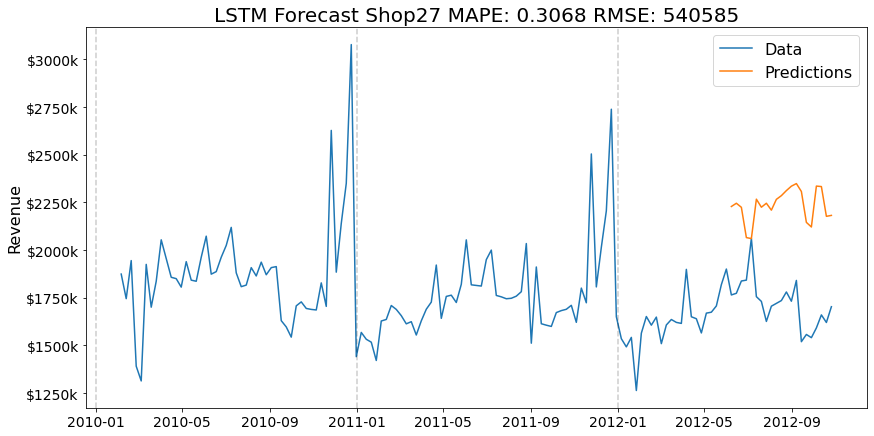

Mean Absolute Percent Error: 0.1347
Root Mean Squared Error: 173111


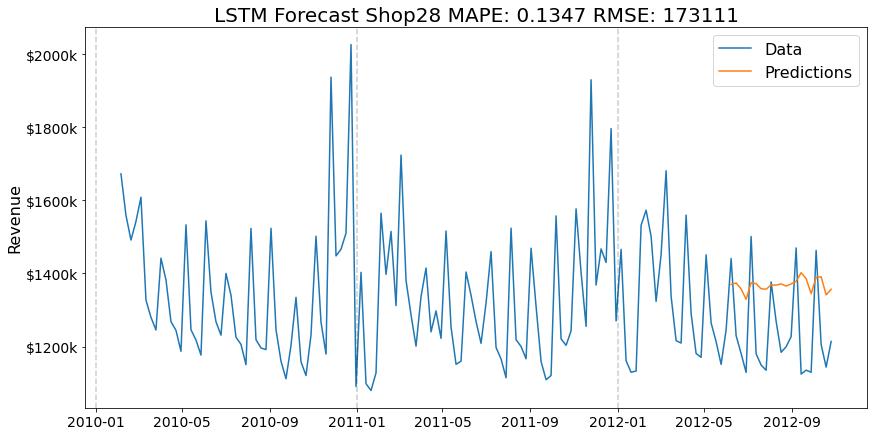

Mean Absolute Percent Error: 0.1537
Root Mean Squared Error: 91600


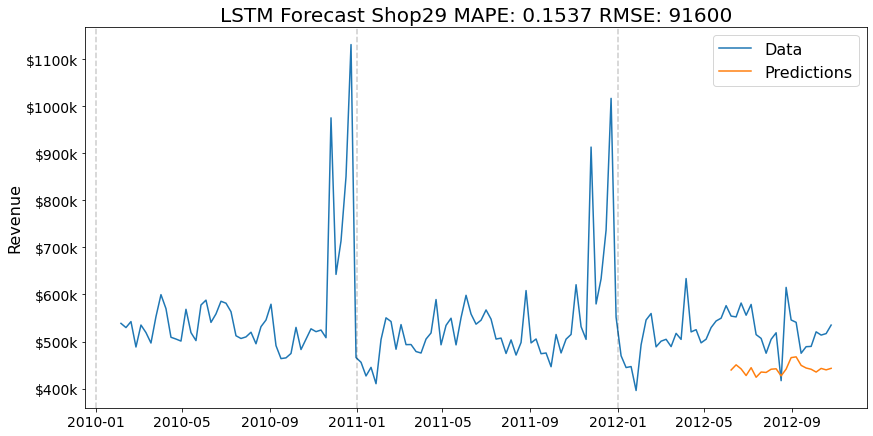

Mean Absolute Percent Error: 0.2139
Root Mean Squared Error: 96127


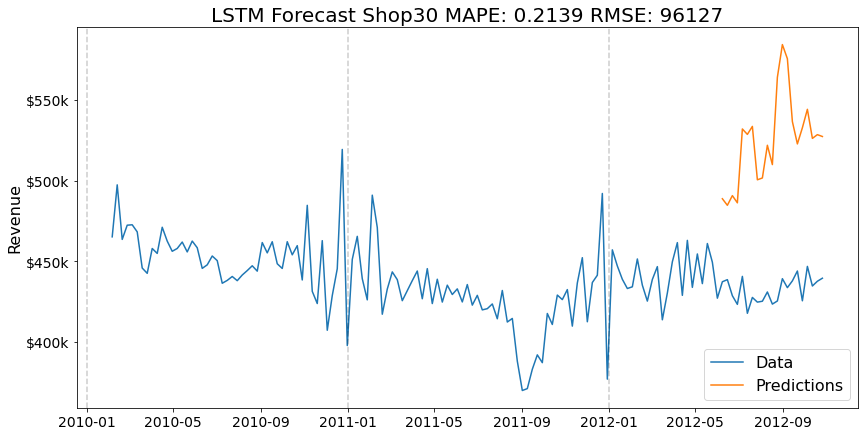

Mean Absolute Percent Error: 0.0752
Root Mean Squared Error: 113752


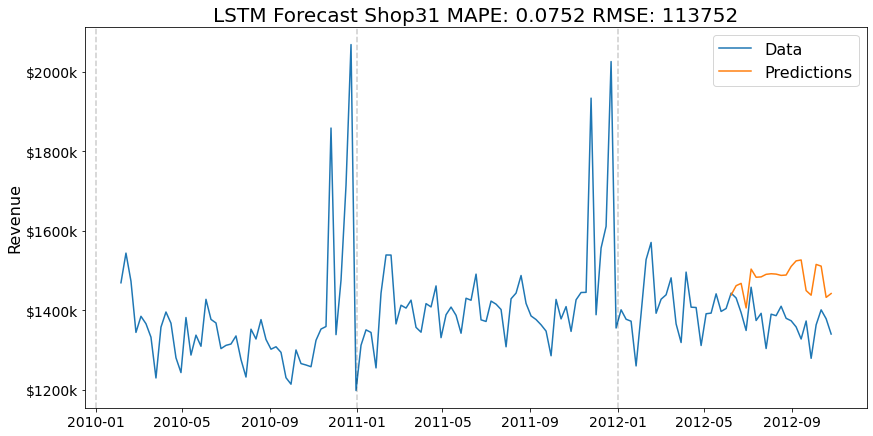

Mean Absolute Percent Error: 0.0932
Root Mean Squared Error: 118711


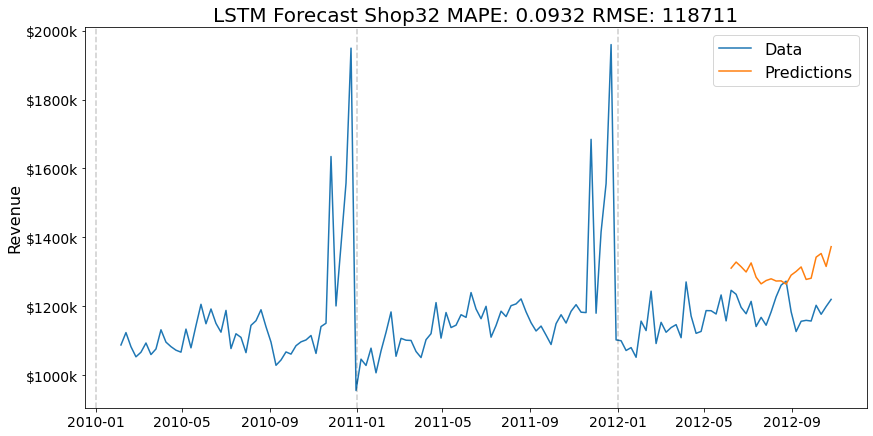

Mean Absolute Percent Error: 0.0676
Root Mean Squared Error: 22847


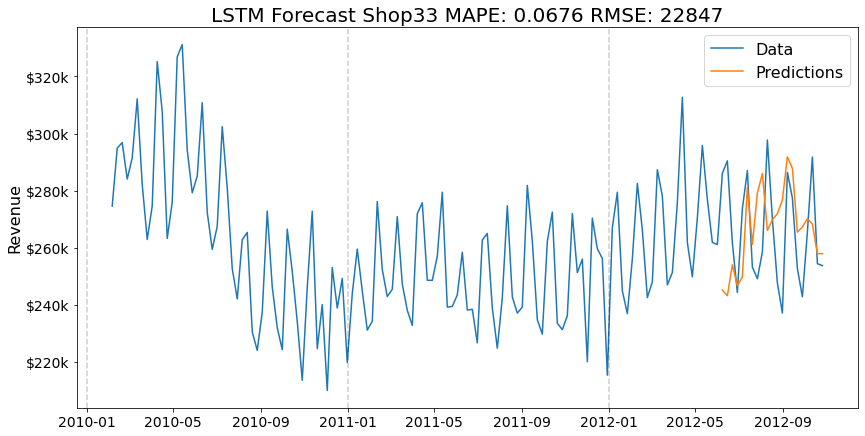

Mean Absolute Percent Error: 0.1088
Root Mean Squared Error: 120592


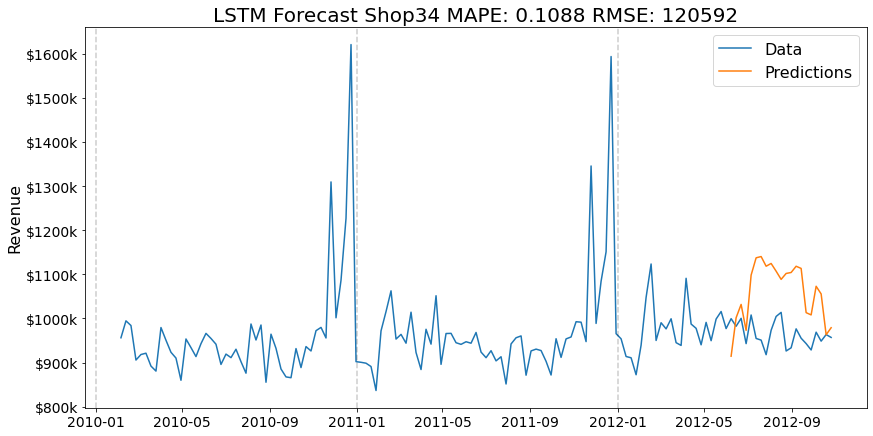

Mean Absolute Percent Error: 0.0384
Root Mean Squared Error: 42306


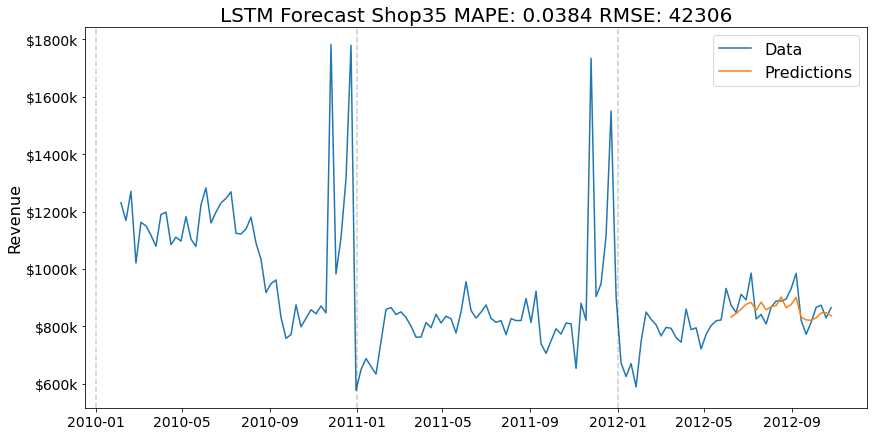

Mean Absolute Percent Error: 0.3956
Root Mean Squared Error: 121615


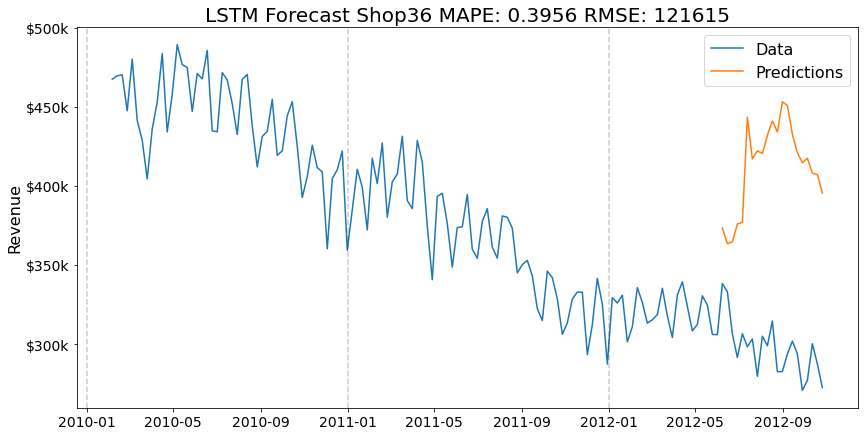

Mean Absolute Percent Error: 0.2728
Root Mean Squared Error: 144380


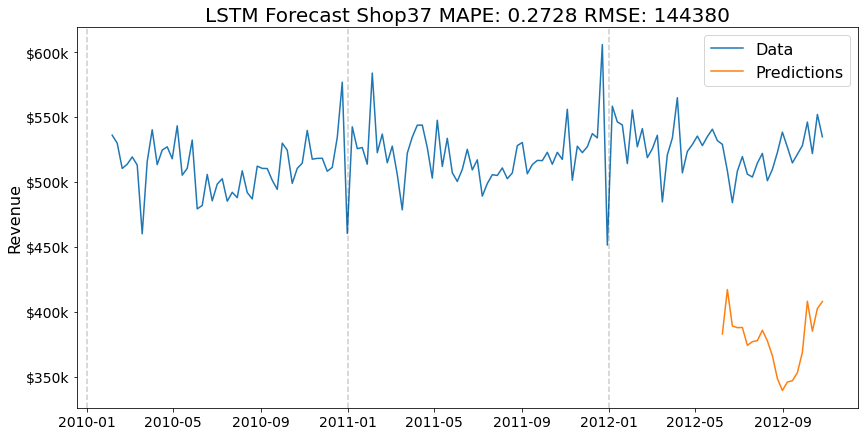

Mean Absolute Percent Error: 0.2428
Root Mean Squared Error: 108686


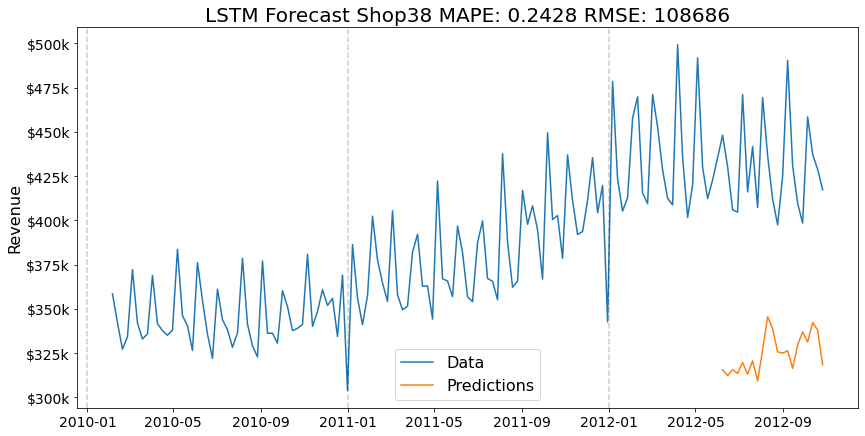

Mean Absolute Percent Error: 0.082
Root Mean Squared Error: 182430


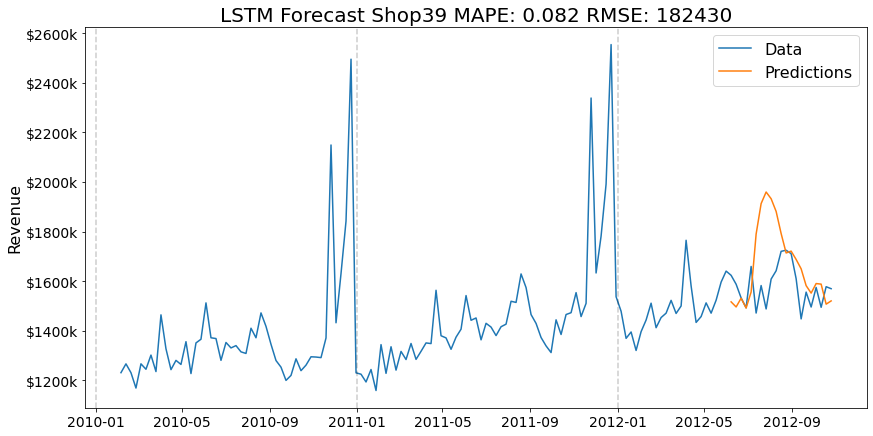

Mean Absolute Percent Error: 0.1733
Root Mean Squared Error: 179116


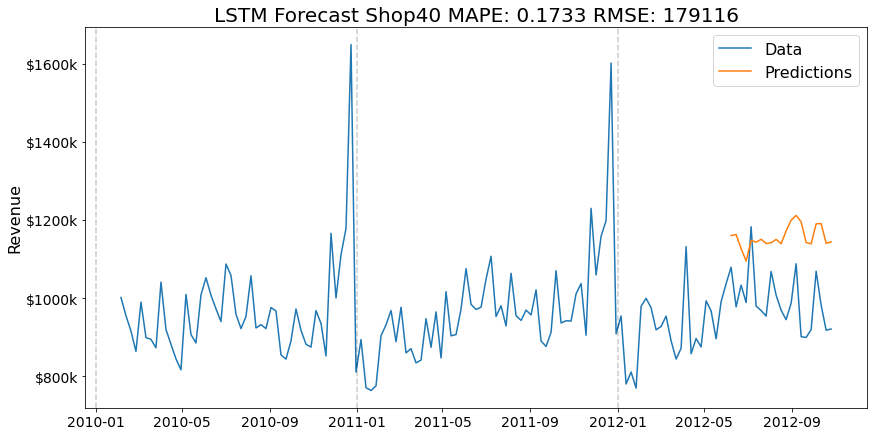

Mean Absolute Percent Error: 0.0425
Root Mean Squared Error: 77001


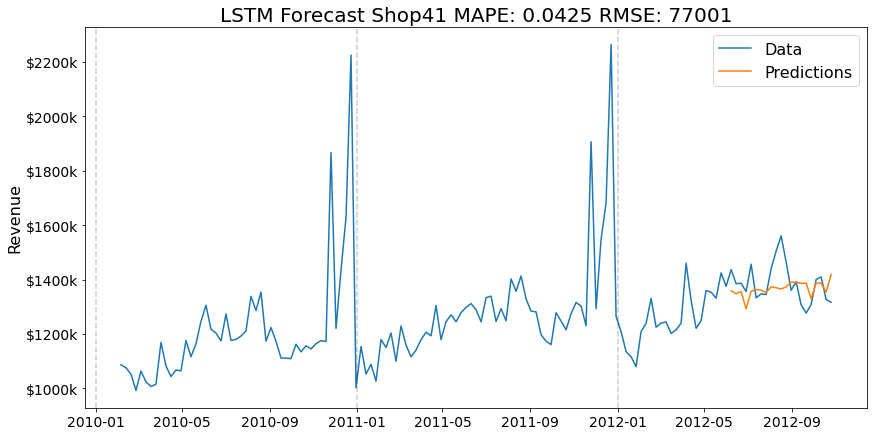

Mean Absolute Percent Error: 0.1513
Root Mean Squared Error: 95656


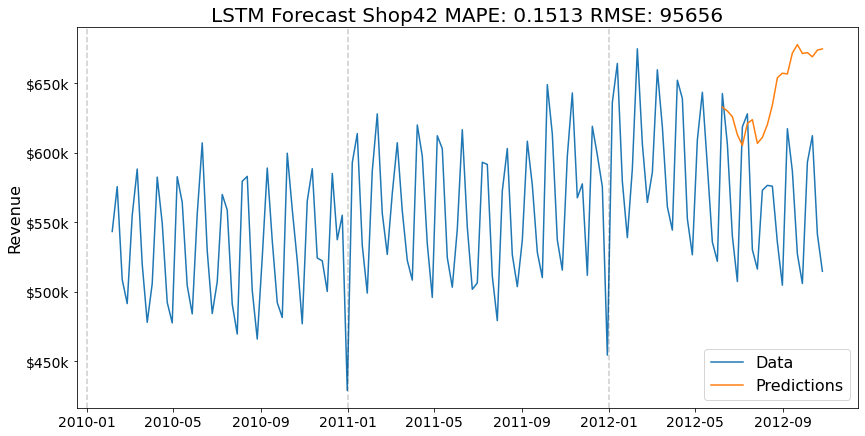

Mean Absolute Percent Error: 0.0534
Root Mean Squared Error: 40267


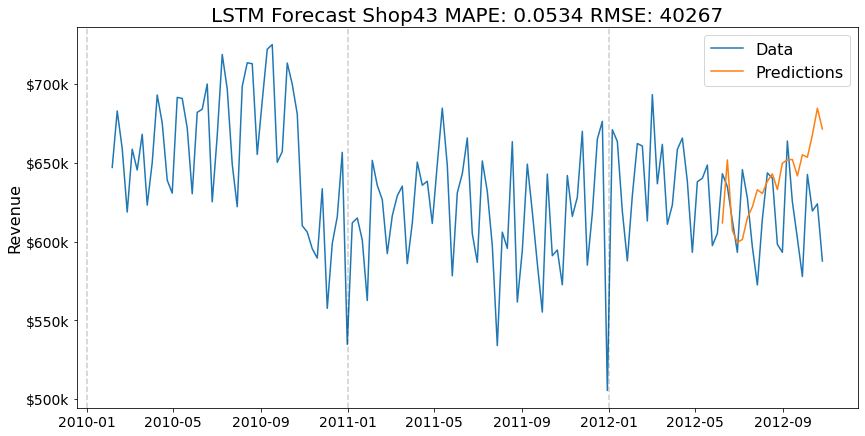

Mean Absolute Percent Error: 0.0352
Root Mean Squared Error: 15074


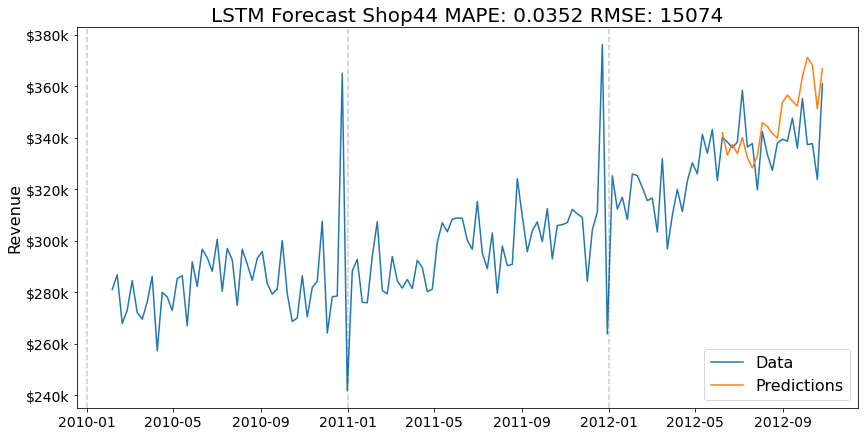

Mean Absolute Percent Error: 0.1749
Root Mean Squared Error: 138609


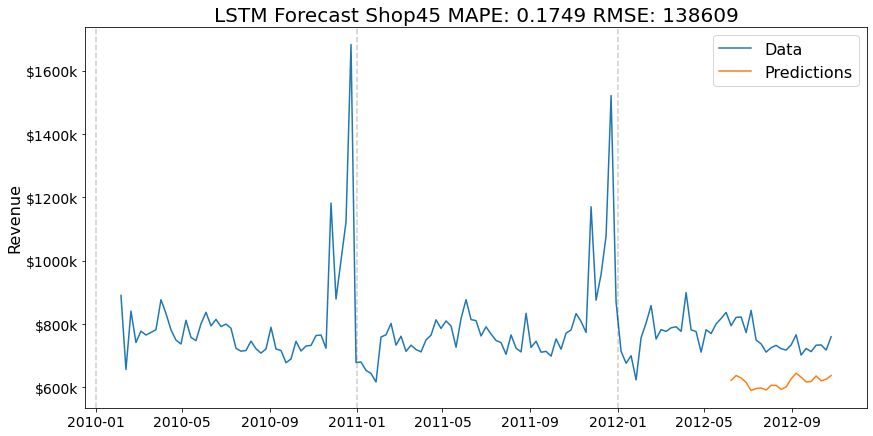

In [15]:
# Creates LSTM plots and calculates Errors

start_date = datetime(2010,2,5)
end_date = datetime(2012,10, 26)

#train_end = datetime(2012,6,1)
#test_end = datetime(2012,10,26)
#test_end = datetime(2013,7,26)

train_data = []
test_data = []
for column in df_stores_revenue:
    test_data.append(df_stores_revenue[column][train_end + timedelta(days=1):test_end])


predictions = []
#residuals:= Difference between forecast and true value
residuals = []
#MeanError:= Mean percental difference between forecast and true values
MeanError = []
#RootMeanSqError:= Mean root of the square of the residual
RootMeanSqError = []

MeanSqError = []
test_datas = []

for i in range(45):

    prediction = df_pred_LSTM['Store{}'.format(i+1)]
    predictions.append(prediction)
    test_data1 = pd.Series(test_data[i], index=test_data[0].index)
    test_datas.append(test_data1)

    residuals.append(test_data1 - predictions[i])
    MeanError.append(round(np.mean(abs(residuals[i]/test_data1)),4))
    RootMeanSqError.append(round(np.sqrt(np.mean(residuals[i]**2))))
    MeanSqError.append(round(np.mean(residuals[i]**2)))

    print('Mean Absolute Percent Error:', MeanError[i])
    print('Root Mean Squared Error:', RootMeanSqError[i])

    fig, ax = plt.subplots(figsize=(14,7))
    
    ax.plot(df_stores_revenue['Store{}'.format(i+1)])
    ax.plot(predictions[i])

    def thousands(x, pos):
        return '$%1.0fk' % (x*1e-3)

    formatter = FuncFormatter(thousands)
    ax.yaxis.set_major_formatter(formatter)

    ax.legend(('Data', 'Predictions'), fontsize=16)
    
    plt.title('LSTM Forecast Shop{}'.format(i+1)+' MAPE: {}'.format(MeanError[i]) + ' RMSE: {}'.format(RootMeanSqError[i]), fontsize=20)
    plt.ylabel('Revenue', fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    for year in range(start_date.year,end_date.year+1):
        plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
    # Saves plots as files
    #plt.savefig('LSTM Store{}'.format(i+1)+'.jpg')
    plt.show()

In [25]:
# Saves Errors as files

dict = []
for i in range(45):
    dict.append(MeanSqError[i])

df = pd.DataFrame(data=dict)
df.to_csv("MeanSqError_LSTM.csv", sep=';')

dict = {}
for i in range(45):
    dict[i] = residuals[i]

df = pd.DataFrame(data=dict)
df.to_csv("residuals_LSTM.csv", sep=',',index=True)

In [18]:
# Imports the predicted data from the MSEW hybrid model

df_MSEW = pd.read_csv('msew.csv', sep=',', index_col=0)
df_MSEW.index = pd.to_datetime(df_MSEW.index)

print(df_MSEW['0'])

Date
2012-06-08    1.557909e+06
2012-06-15    1.567360e+06
2012-06-22    1.531805e+06
2012-06-29    1.564065e+06
2012-07-06    1.594209e+06
2012-07-13    1.567550e+06
2012-07-20    1.536843e+06
2012-07-27    1.550074e+06
2012-08-03    1.660086e+06
2012-08-10    1.609089e+06
2012-08-17    1.604299e+06
2012-08-24    1.586898e+06
2012-08-31    1.630998e+06
2012-09-07    1.617553e+06
2012-09-14    1.591008e+06
2012-09-21    1.526451e+06
2012-09-28    1.550492e+06
2012-10-05    1.639263e+06
2012-10-12    1.586264e+06
2012-10-19    1.556039e+06
2012-10-26    1.550824e+06
Name: 0, dtype: float64


Mean Absolute Percent Error: 0.0361
Root Mean Squared Error: 72324


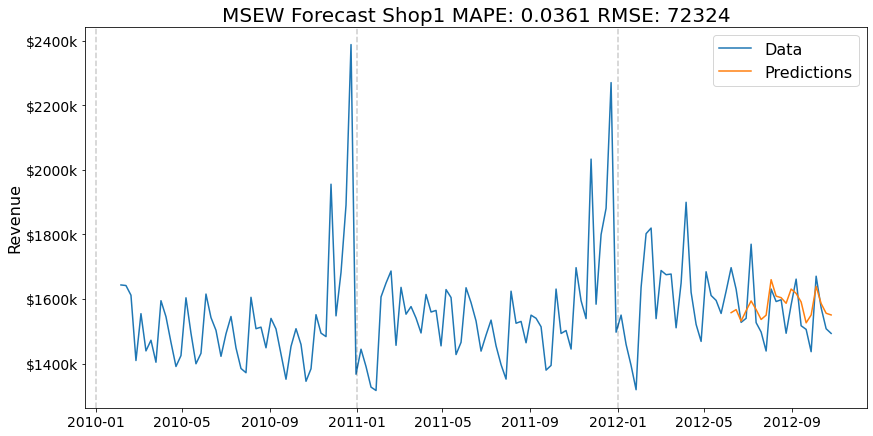

Mean Absolute Percent Error: 0.0239
Root Mean Squared Error: 55760


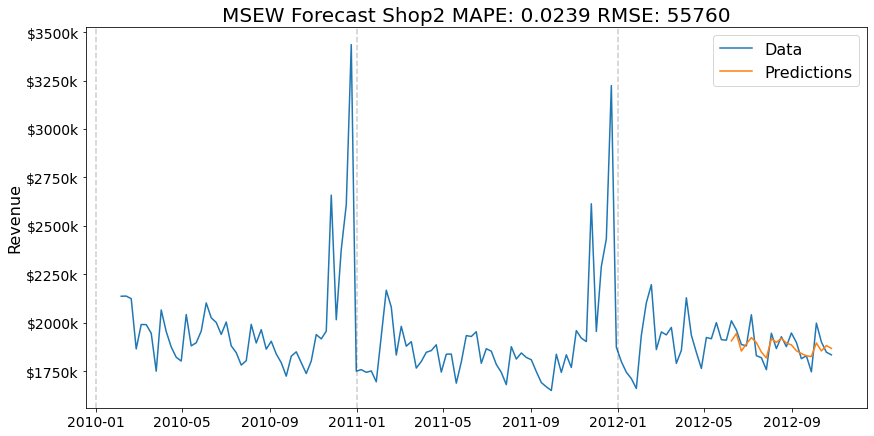

Mean Absolute Percent Error: 0.0357
Root Mean Squared Error: 16988


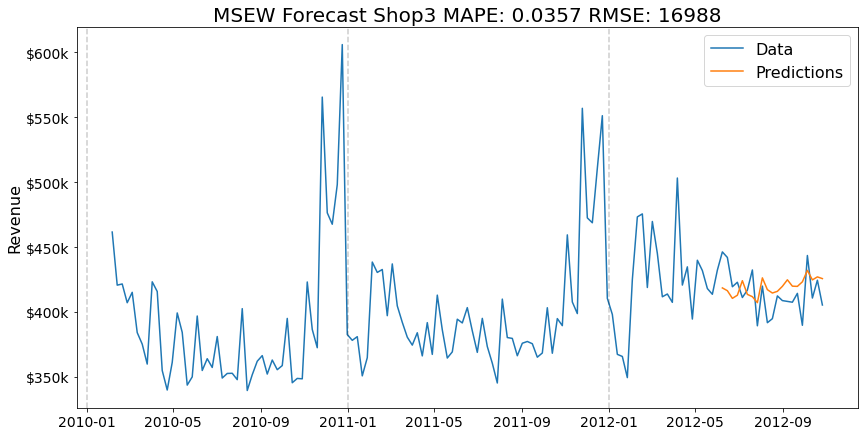

Mean Absolute Percent Error: 0.025
Root Mean Squared Error: 61218


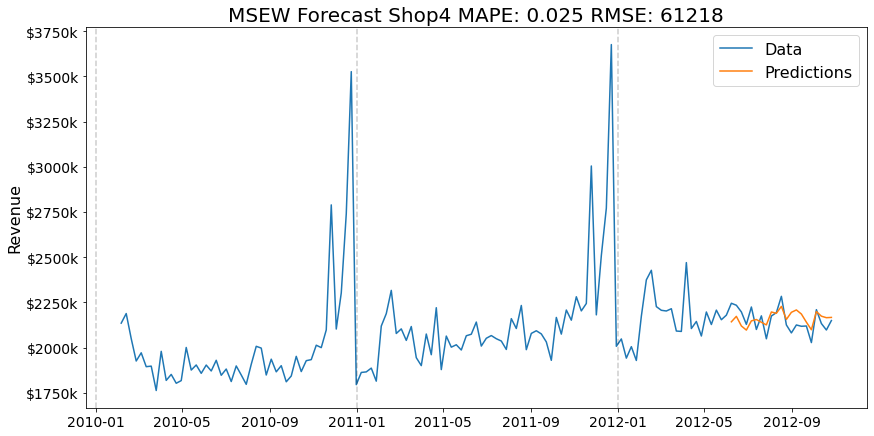

Mean Absolute Percent Error: 0.0639
Root Mean Squared Error: 22666


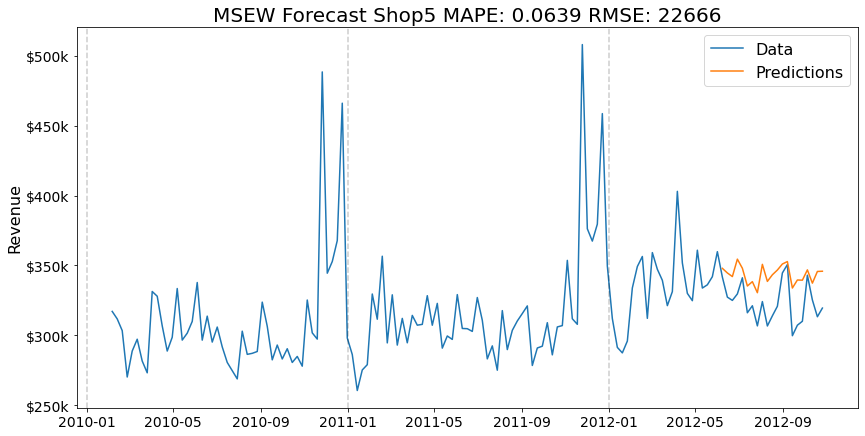

Mean Absolute Percent Error: 0.0361
Root Mean Squared Error: 75402


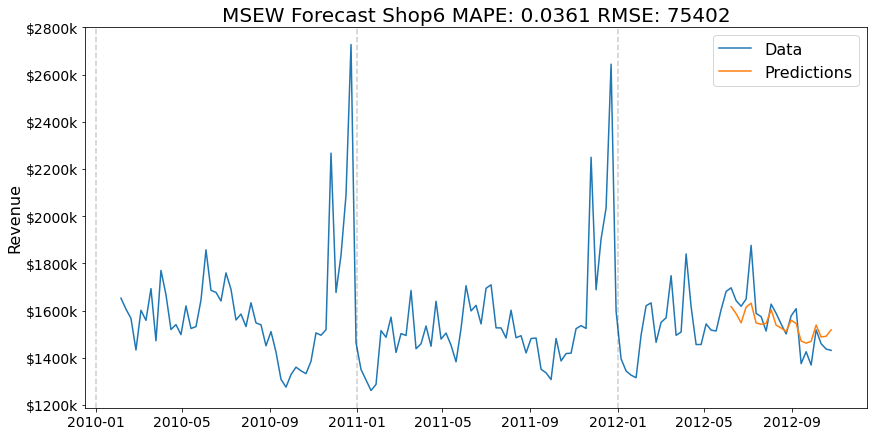

Mean Absolute Percent Error: 0.0756
Root Mean Squared Error: 52327


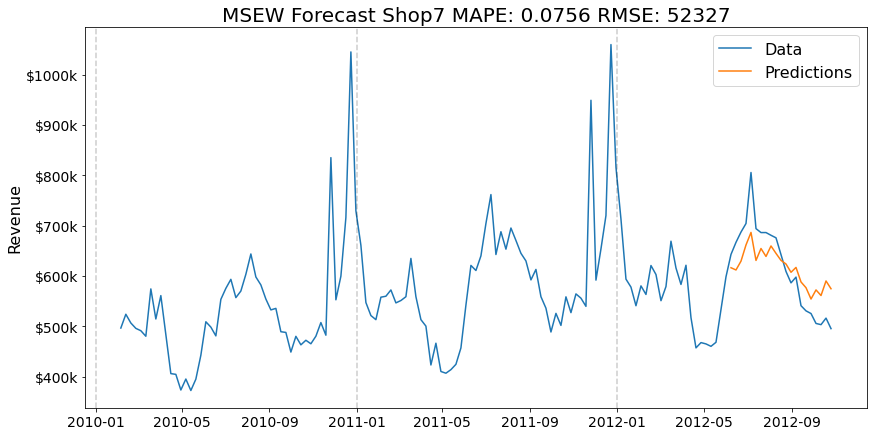

Mean Absolute Percent Error: 0.0261
Root Mean Squared Error: 29147


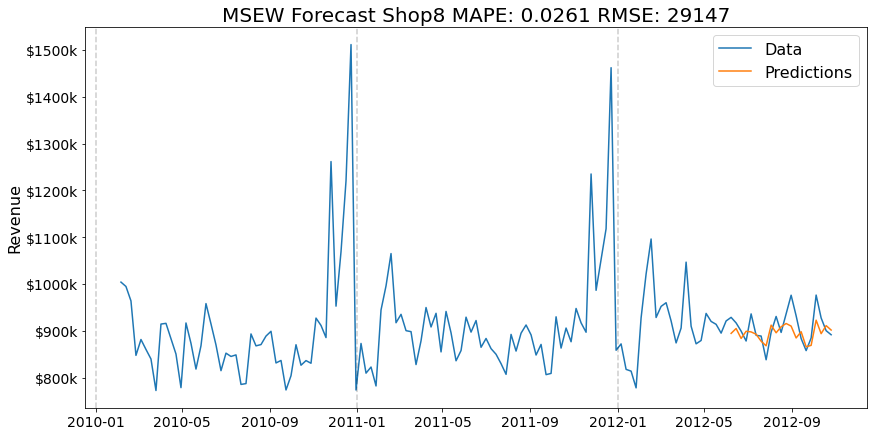

Mean Absolute Percent Error: 0.0355
Root Mean Squared Error: 22281


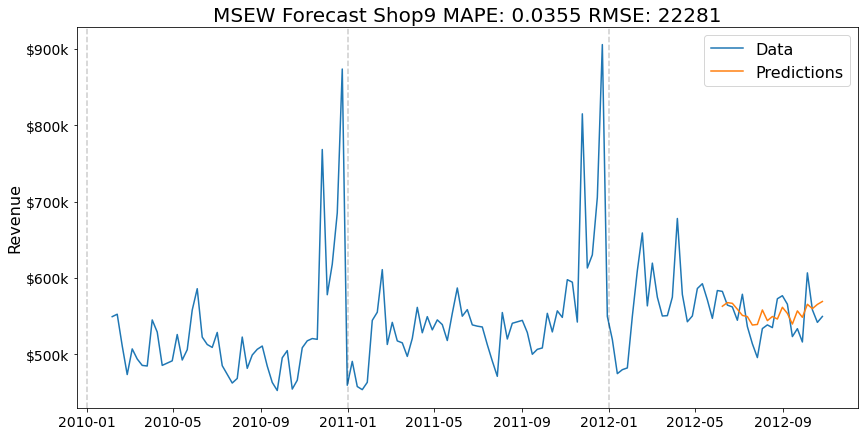

Mean Absolute Percent Error: 0.0495
Root Mean Squared Error: 100404


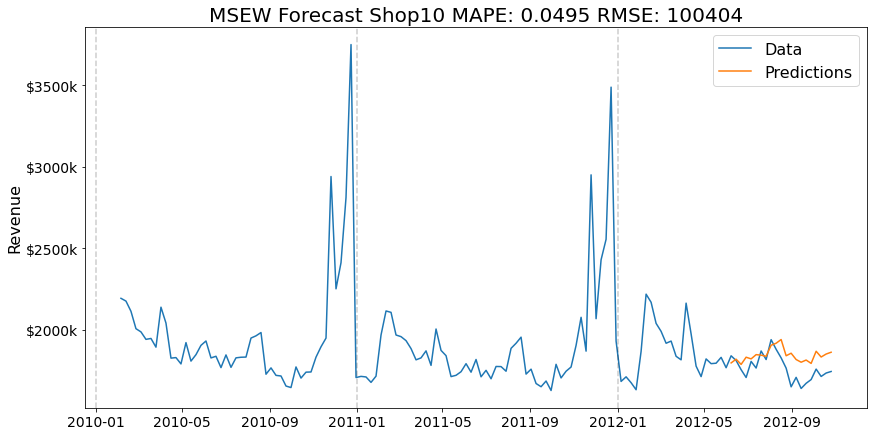

Mean Absolute Percent Error: 0.0392
Root Mean Squared Error: 64542


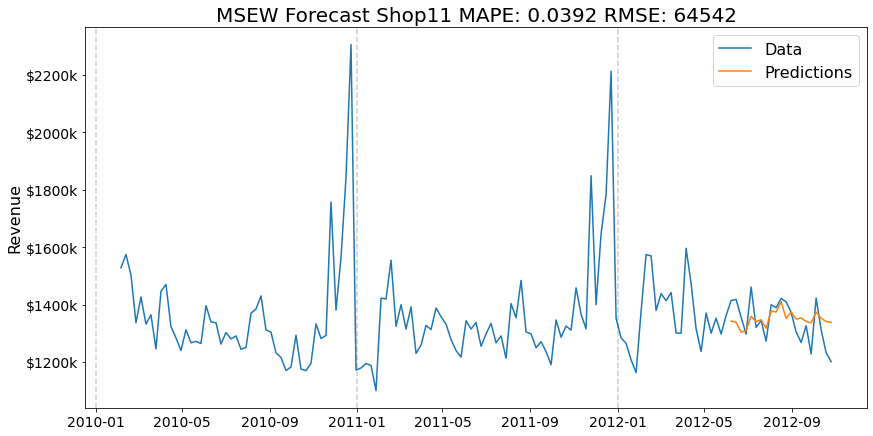

Mean Absolute Percent Error: 0.0332
Root Mean Squared Error: 39789


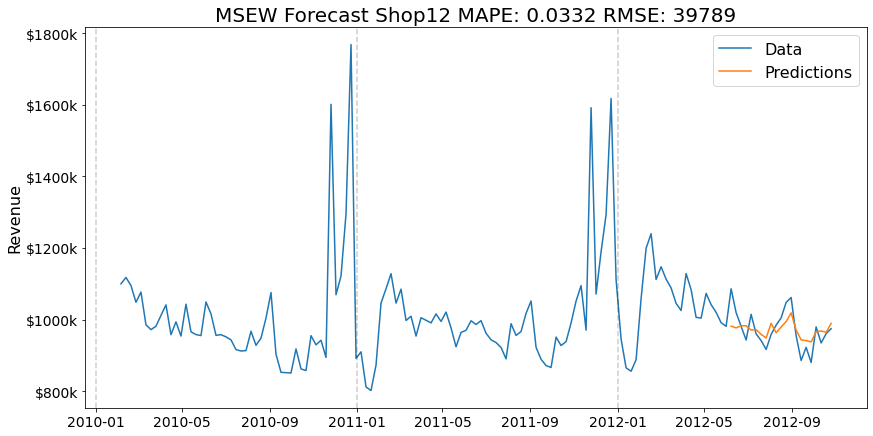

Mean Absolute Percent Error: 0.026
Root Mean Squared Error: 68026


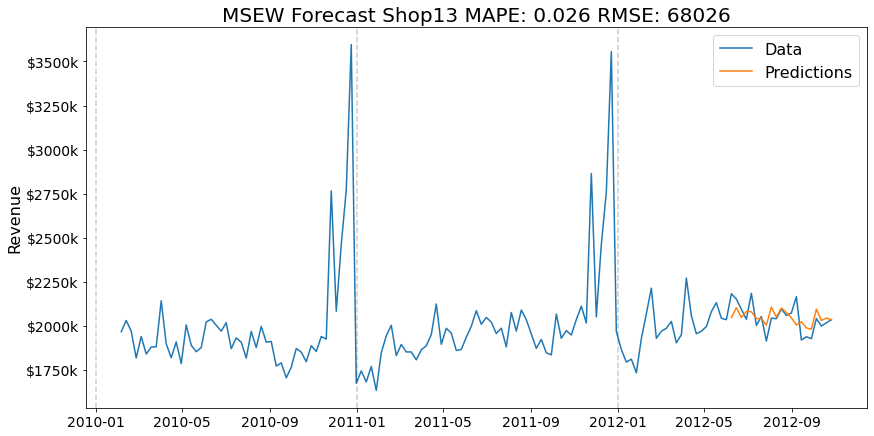

Mean Absolute Percent Error: 0.2108
Root Mean Squared Error: 363130


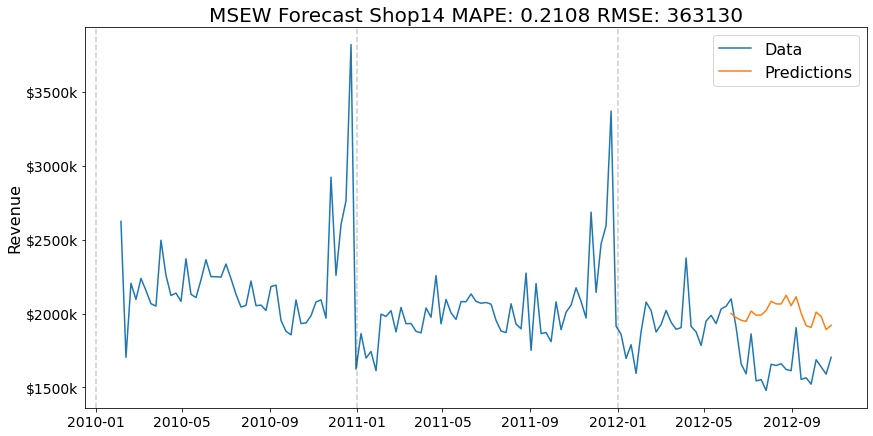

Mean Absolute Percent Error: 0.0545
Root Mean Squared Error: 34629


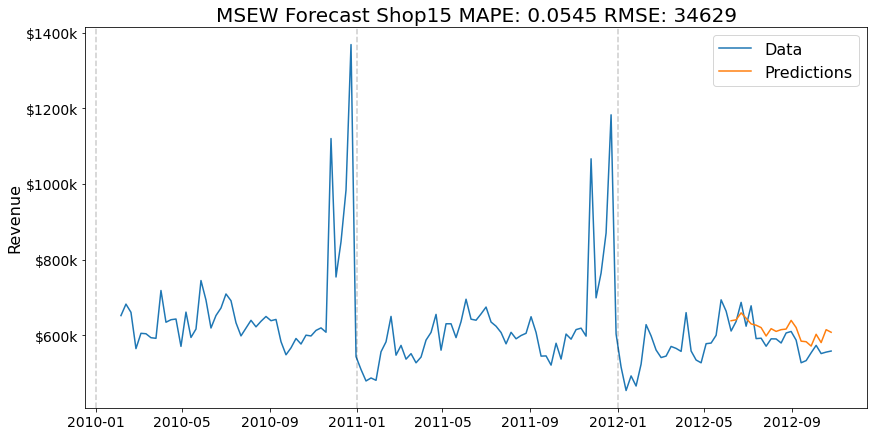

Mean Absolute Percent Error: 0.0395
Root Mean Squared Error: 26195


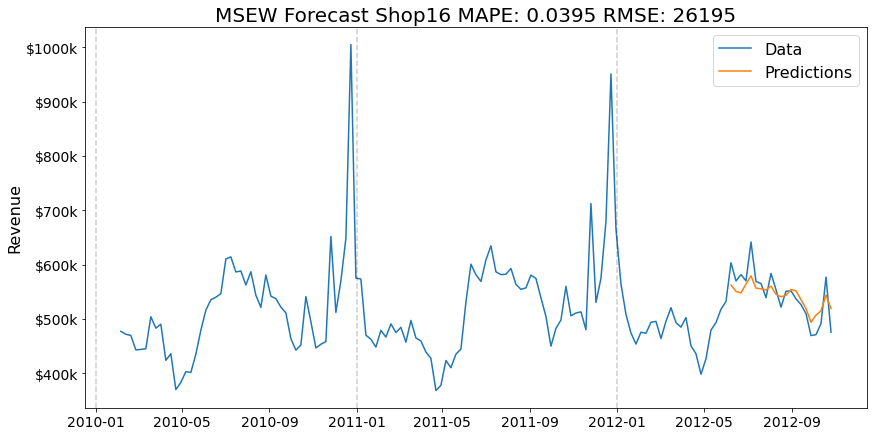

Mean Absolute Percent Error: 0.0364
Root Mean Squared Error: 50495


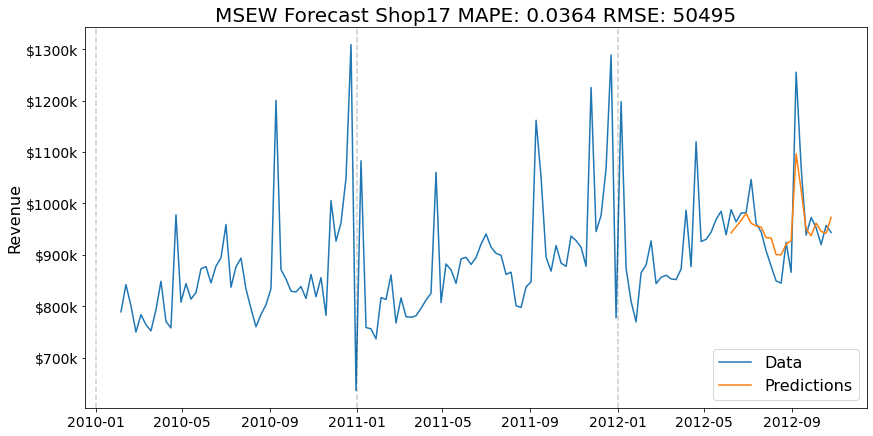

Mean Absolute Percent Error: 0.0395
Root Mean Squared Error: 57427


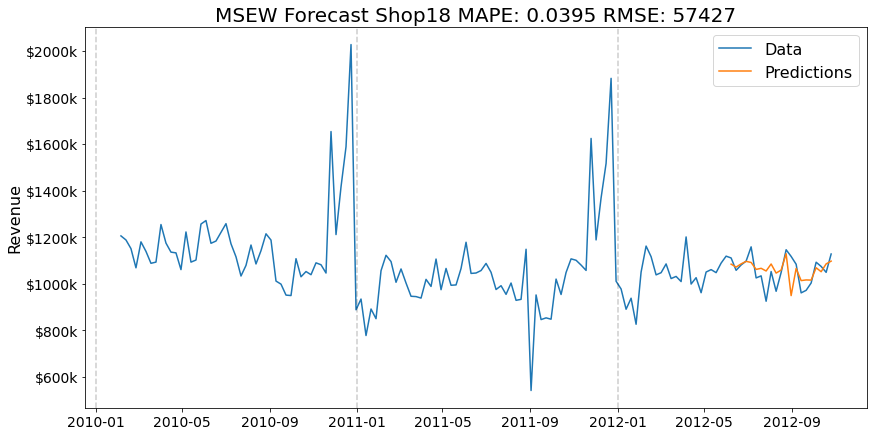

Mean Absolute Percent Error: 0.0368
Root Mean Squared Error: 59362


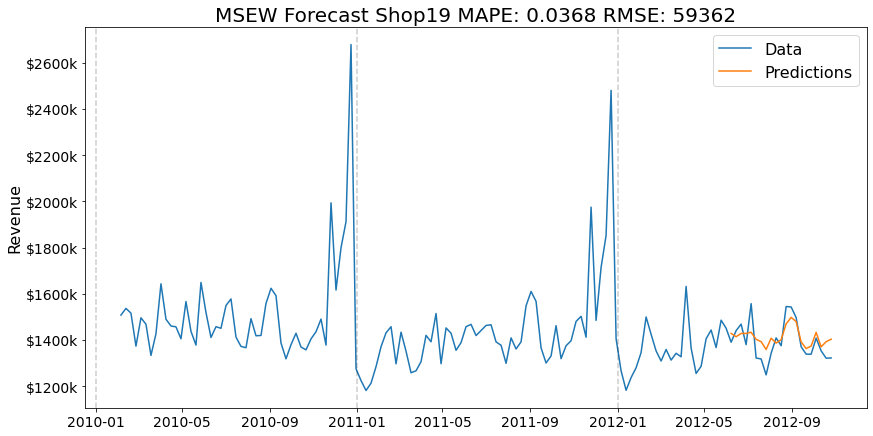

Mean Absolute Percent Error: 0.0489
Root Mean Squared Error: 113328


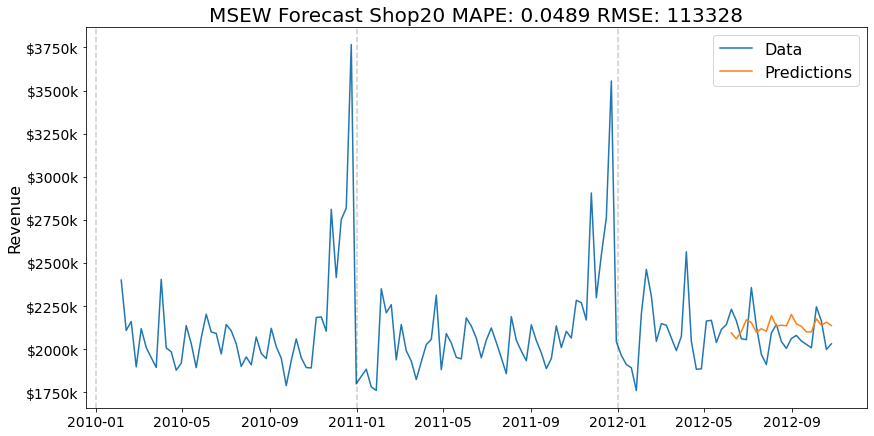

Mean Absolute Percent Error: 0.102
Root Mean Squared Error: 73529


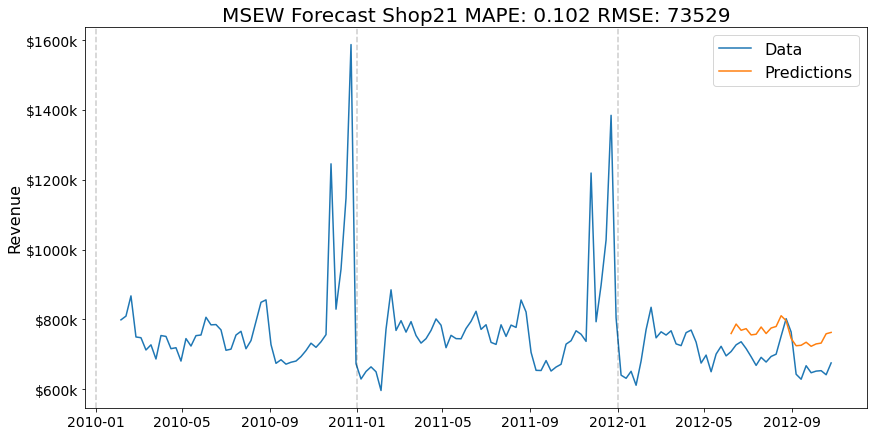

Mean Absolute Percent Error: 0.0319
Root Mean Squared Error: 40171


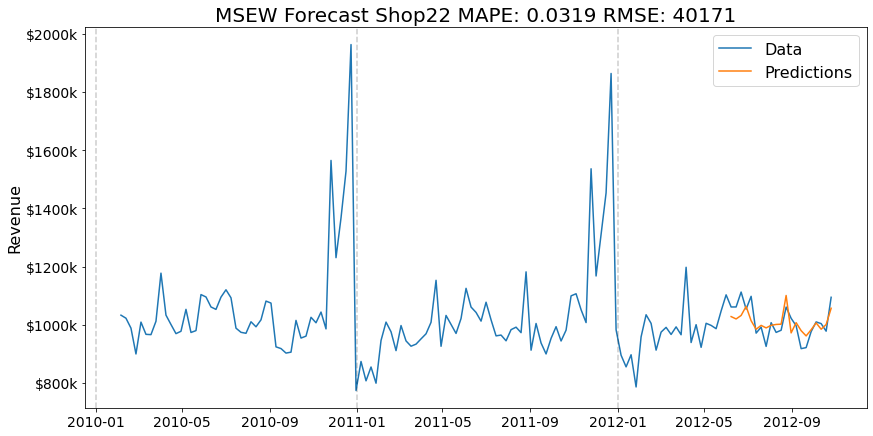

Mean Absolute Percent Error: 0.0429
Root Mean Squared Error: 87973


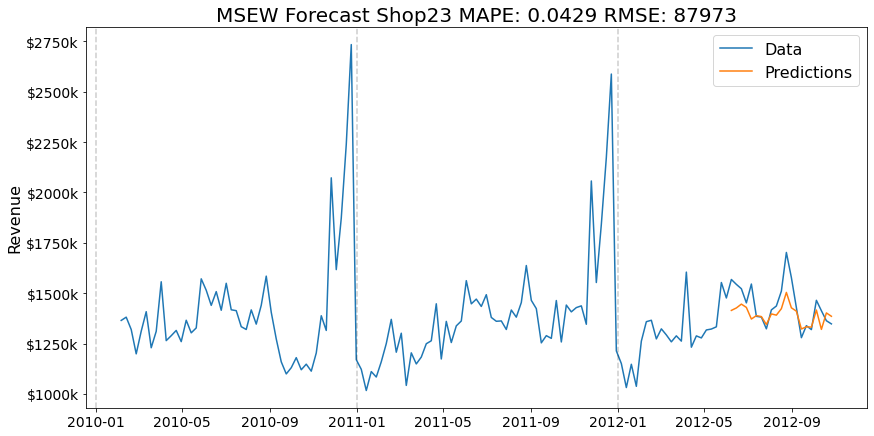

Mean Absolute Percent Error: 0.0373
Root Mean Squared Error: 67904


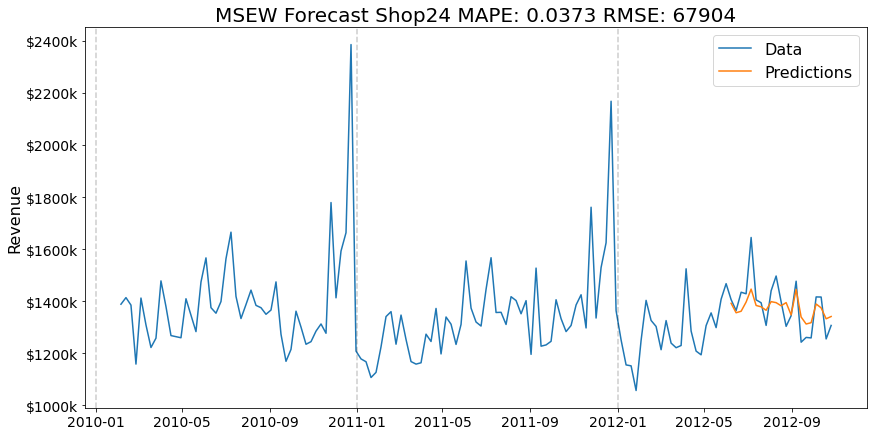

Mean Absolute Percent Error: 0.0333
Root Mean Squared Error: 29032


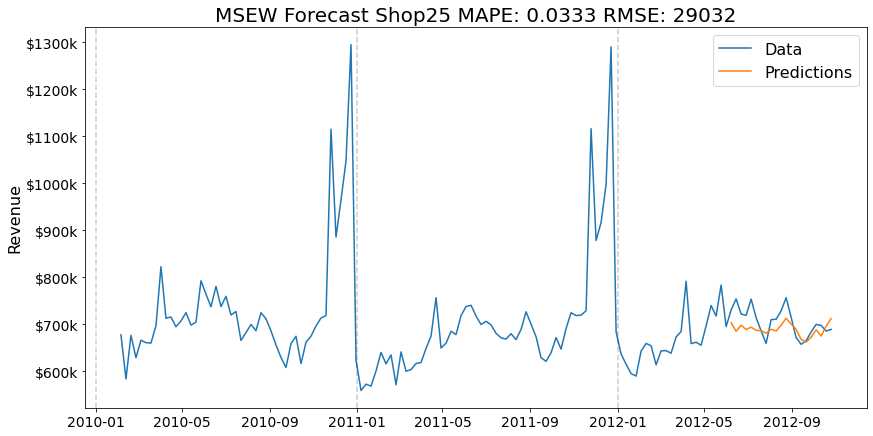

Mean Absolute Percent Error: 0.0294
Root Mean Squared Error: 36982


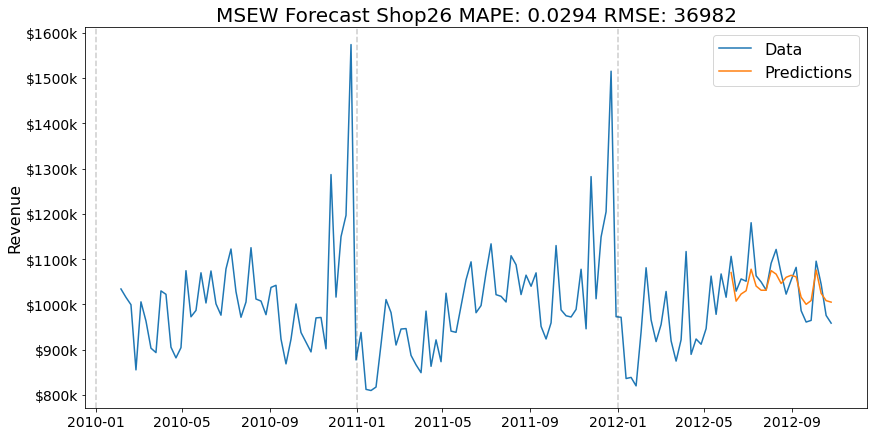

Mean Absolute Percent Error: 0.0347
Root Mean Squared Error: 78607


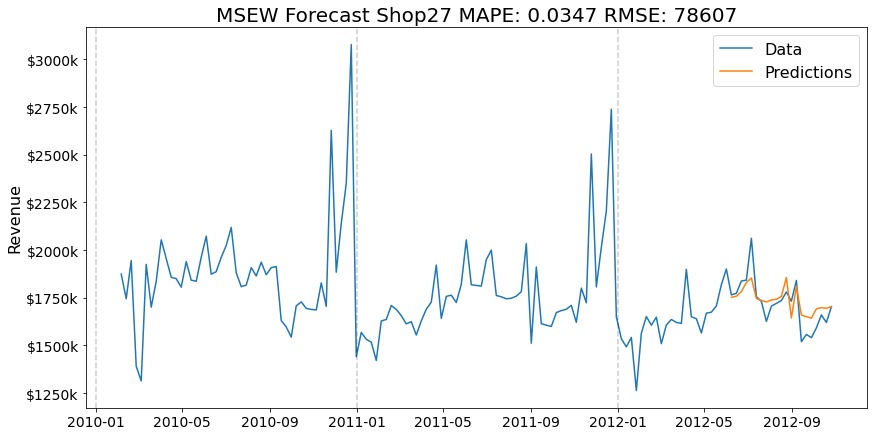

Mean Absolute Percent Error: 0.0937
Root Mean Squared Error: 120533


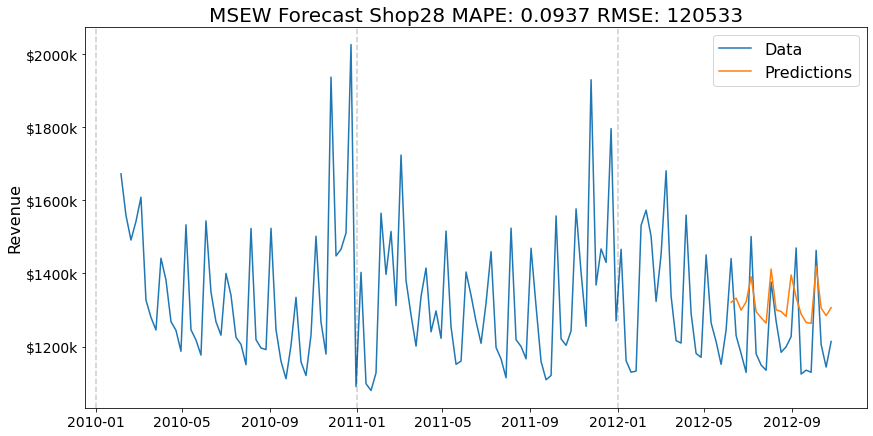

Mean Absolute Percent Error: 0.0442
Root Mean Squared Error: 31221


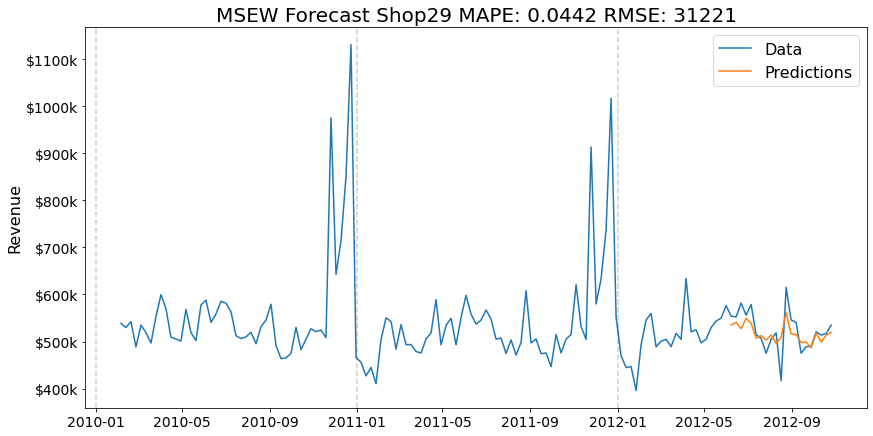

Mean Absolute Percent Error: 0.0204
Root Mean Squared Error: 10863


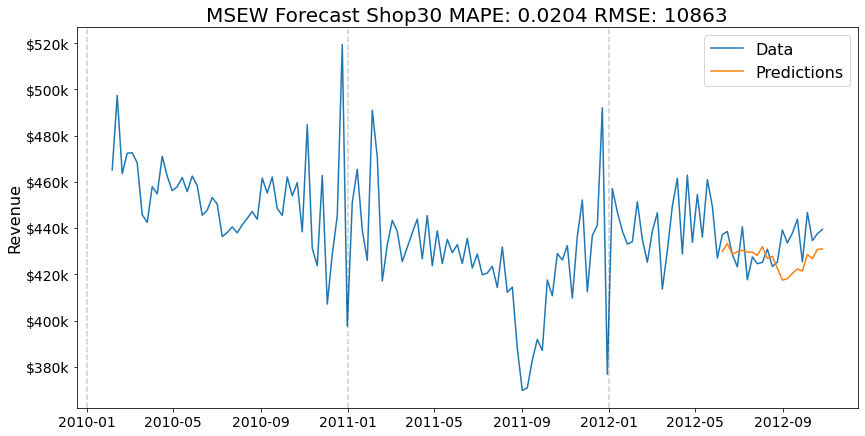

Mean Absolute Percent Error: 0.0328
Root Mean Squared Error: 50110


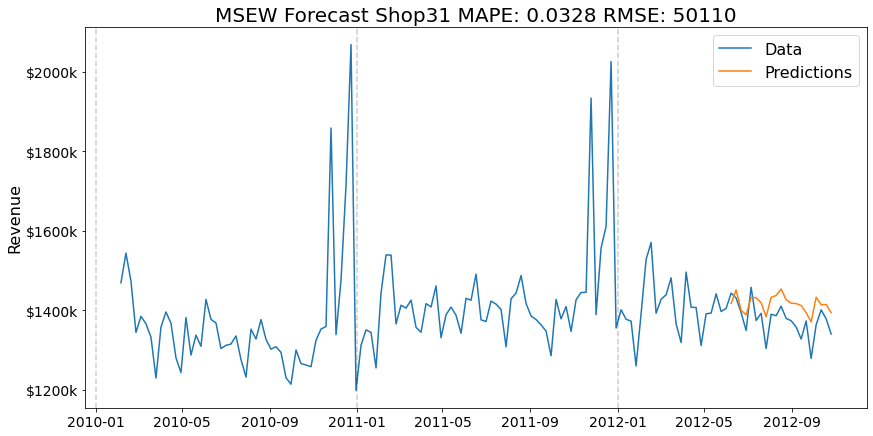

Mean Absolute Percent Error: 0.0233
Root Mean Squared Error: 33353


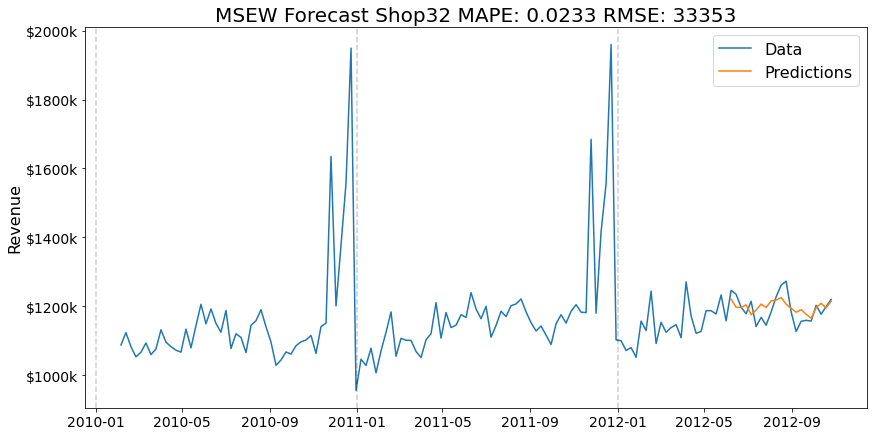

Mean Absolute Percent Error: 0.0332
Root Mean Squared Error: 12127


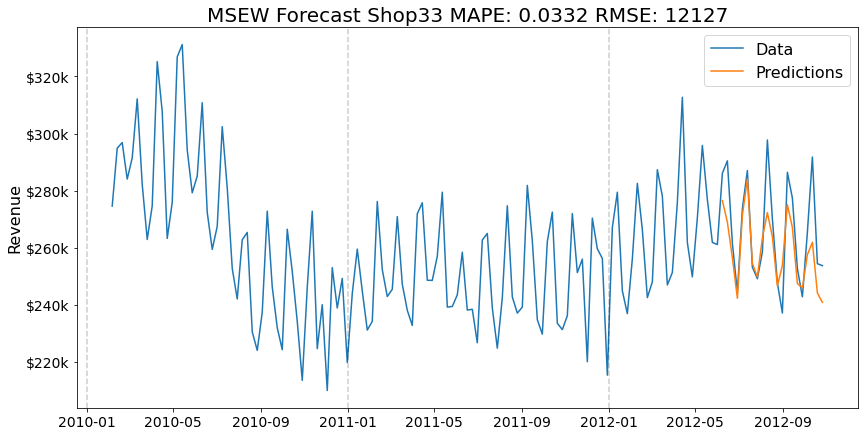

Mean Absolute Percent Error: 0.0197
Root Mean Squared Error: 21628


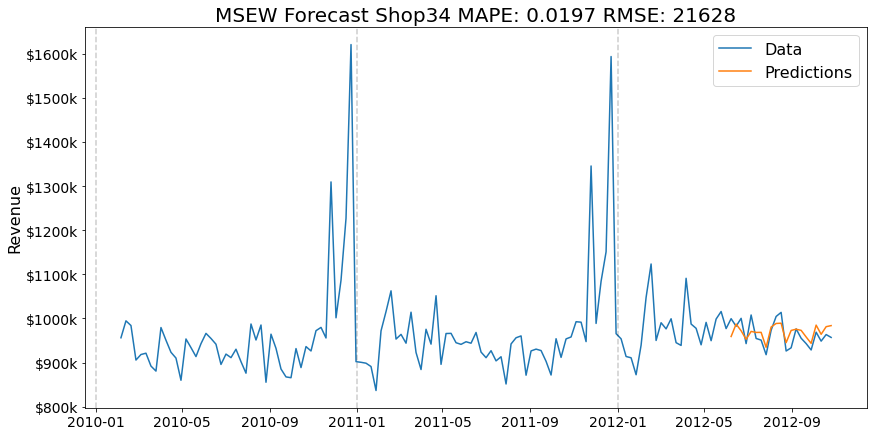

Mean Absolute Percent Error: 0.0376
Root Mean Squared Error: 44280


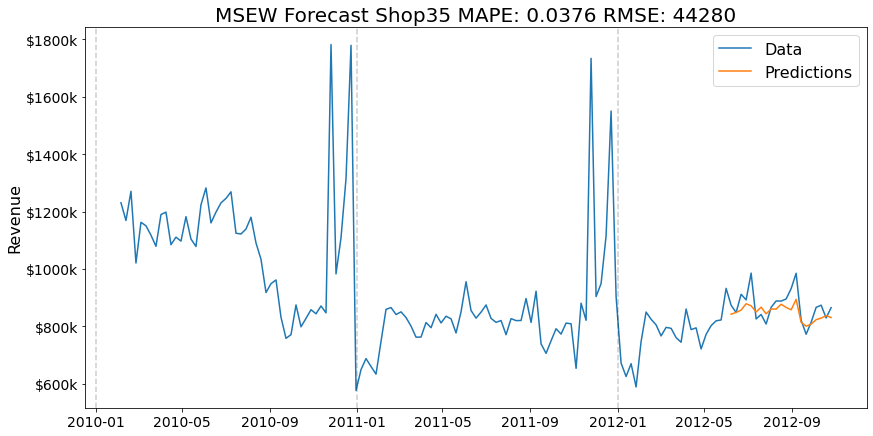

Mean Absolute Percent Error: 0.0835
Root Mean Squared Error: 26375


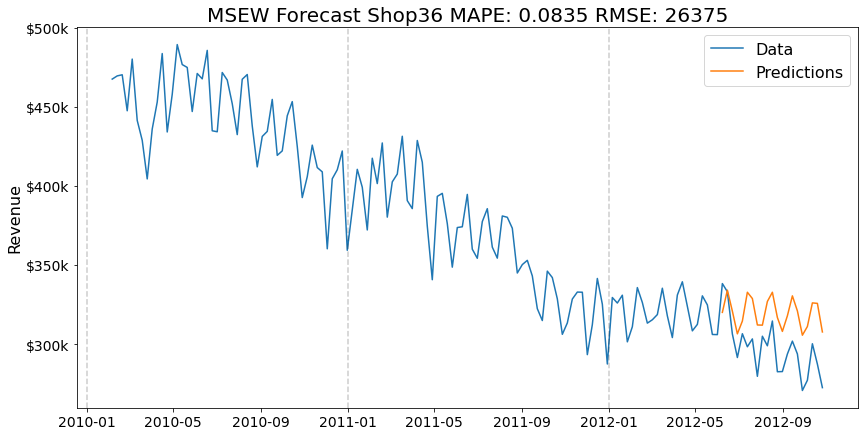

Mean Absolute Percent Error: 0.0307
Root Mean Squared Error: 19194


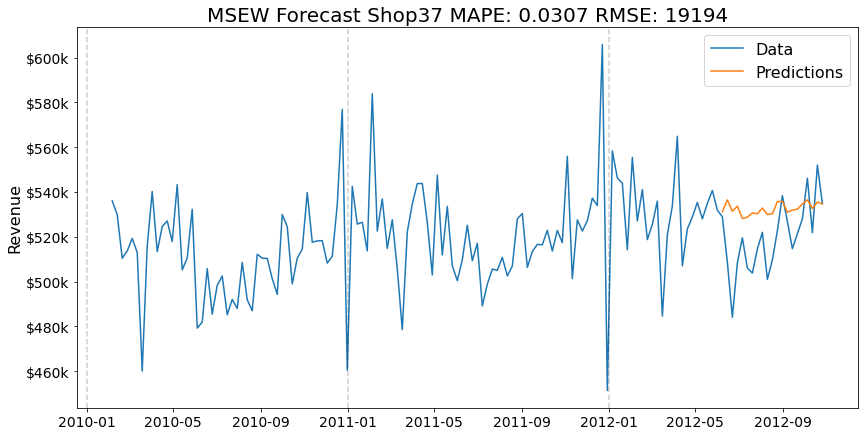

Mean Absolute Percent Error: 0.037
Root Mean Squared Error: 22115


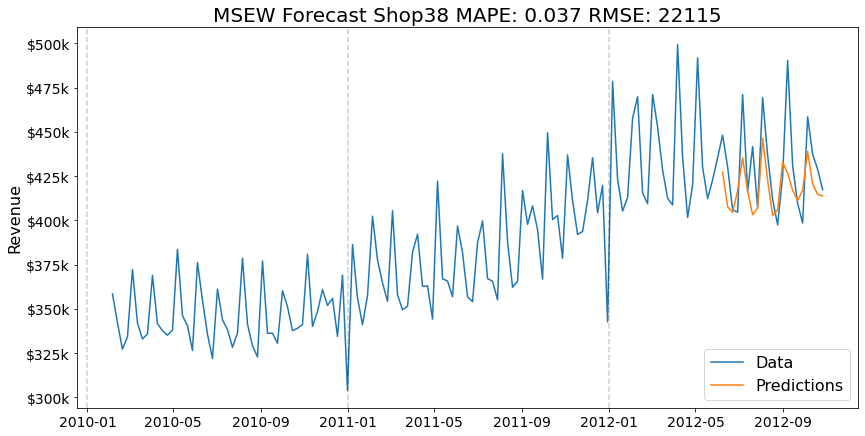

Mean Absolute Percent Error: 0.0293
Root Mean Squared Error: 60021


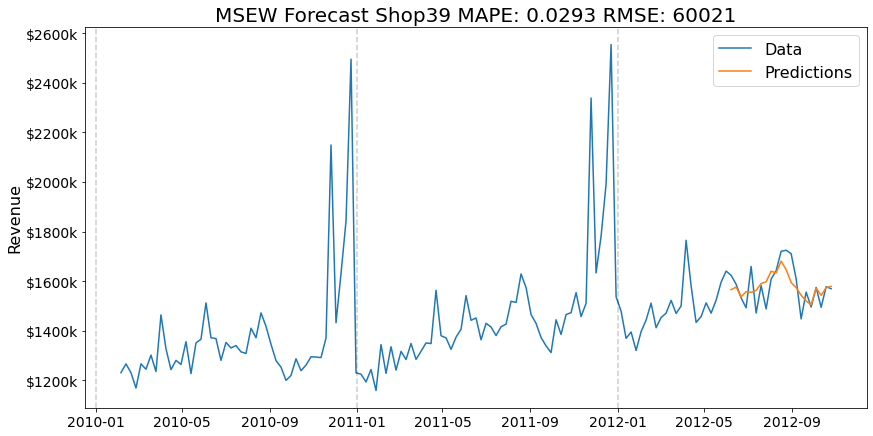

Mean Absolute Percent Error: 0.0402
Root Mean Squared Error: 49117


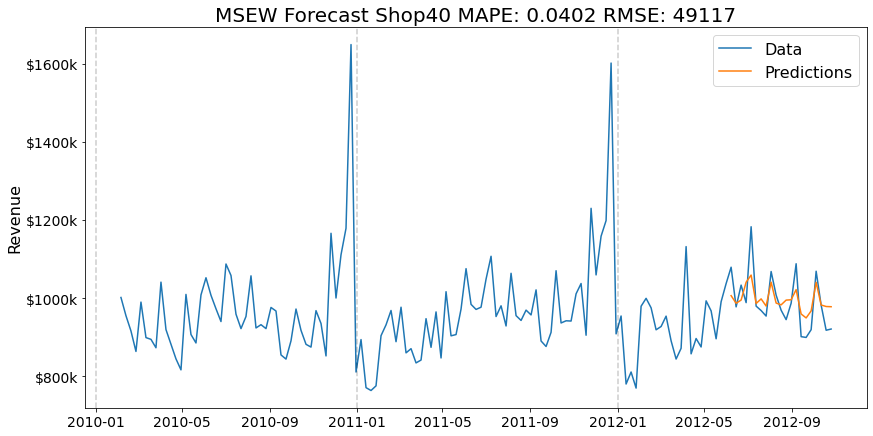

Mean Absolute Percent Error: 0.0312
Root Mean Squared Error: 59900


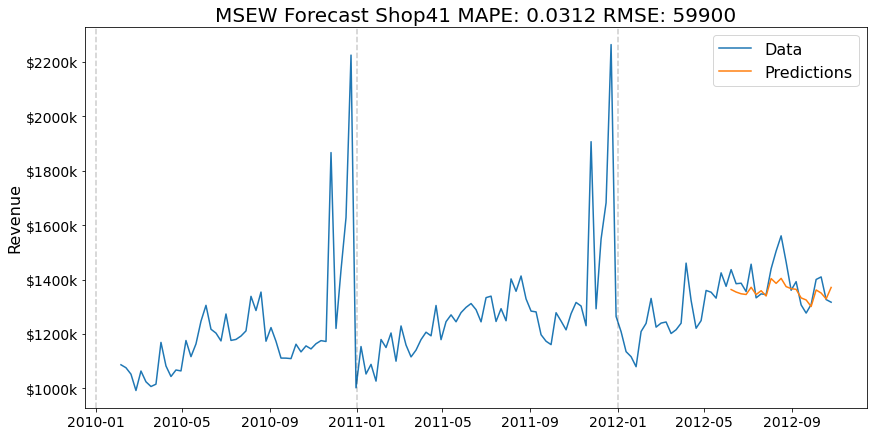

Mean Absolute Percent Error: 0.0272
Root Mean Squared Error: 19235


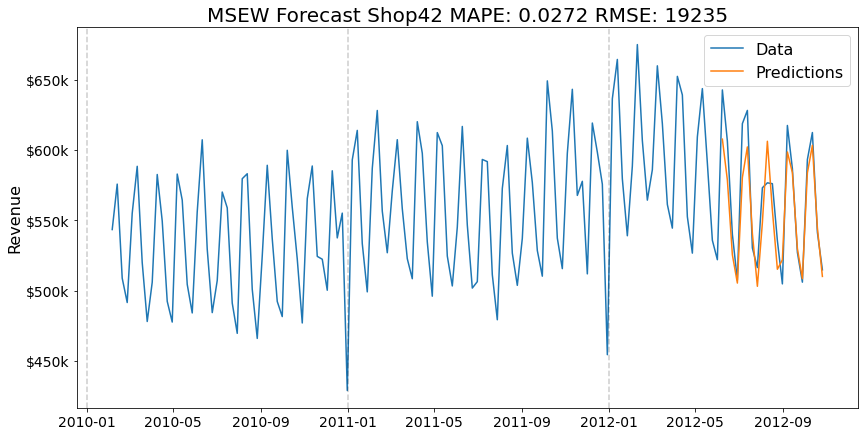

Mean Absolute Percent Error: 0.0218
Root Mean Squared Error: 15323


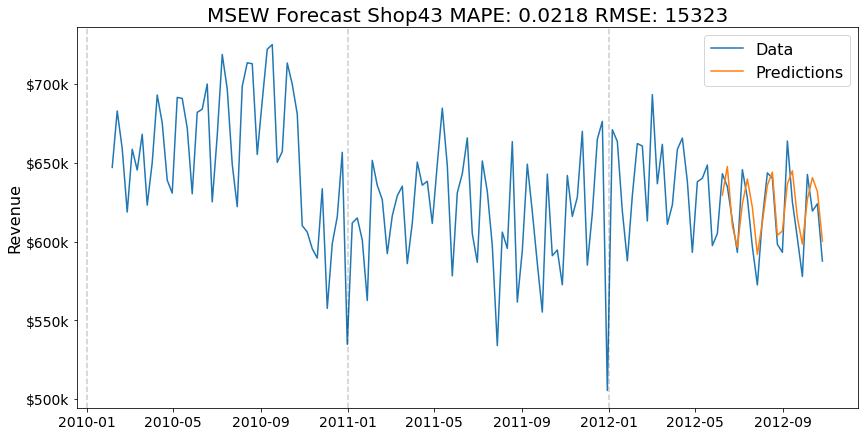

Mean Absolute Percent Error: 0.0224
Root Mean Squared Error: 9413


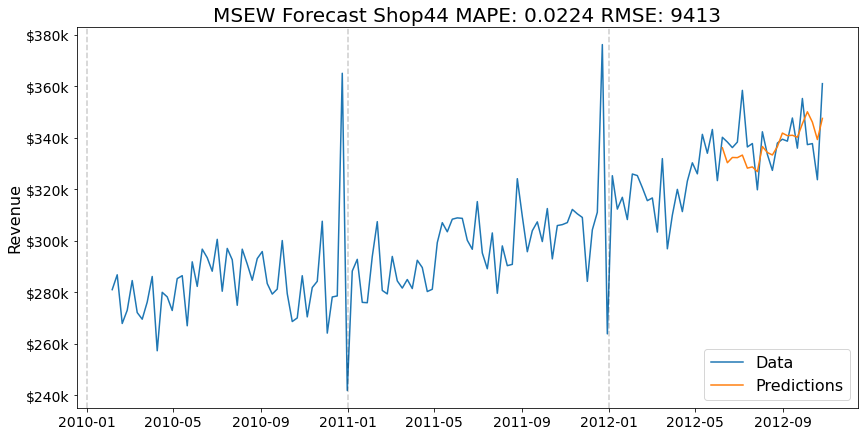

Mean Absolute Percent Error: 0.0411
Root Mean Squared Error: 37042


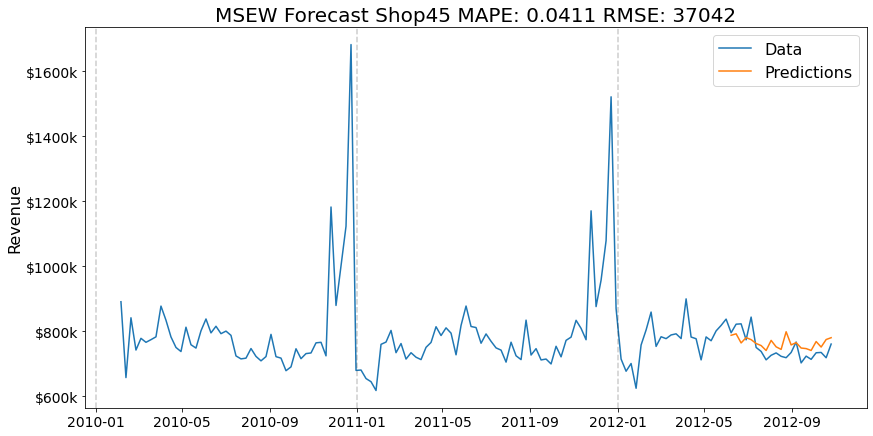

In [22]:
# Creates MSEW plots and calculates Errors

start_date = datetime(2010,2,5)
end_date = datetime(2012,10, 26)

#train_end = datetime(2012,6,1)
#test_end = datetime(2012,10,26)
#test_end = datetime(2013,7,26)

#Teilt Zeitreihe in Trainings- und Test-Daten auf
train_data = []
test_data = []
for column in df_stores_revenue:
    test_data.append(df_stores_revenue[column][train_end + timedelta(days=1):test_end])


predictions = []
#residuals:= Difference between forecast and true value
residuals = []
#MeanError:= Mean percental difference between forecast and true values
MeanError = []
#RootMeanSqError:= Mean root of the square of the residual
RootMeanSqError = []

MeanSqError = []
test_datas = []

for i in range(45):

    prediction = df_MSEW['{}'.format(i)]
    predictions.append(prediction)
    test_data1 = pd.Series(test_data[i], index=test_data[0].index)
    test_datas.append(test_data1)

    residuals.append(test_data1 - predictions[i])
    MeanError.append(round(np.mean(abs(residuals[i]/test_data1)),4))
    RootMeanSqError.append(round(np.sqrt(np.mean(residuals[i]**2))))
    MeanSqError.append(round(np.mean(residuals[i]**2)))

    print('Mean Absolute Percent Error:', MeanError[i])
    print('Root Mean Squared Error:', RootMeanSqError[i])

    fig, ax = plt.subplots(figsize=(14,7))

    ax.plot(df_stores_revenue['Store{}'.format(i+1)])
    ax.plot(predictions[i])
    
    def thousands(x, pos):
        return '$%1.0fk' % (x*1e-3)
    formatter = FuncFormatter(thousands)
    ax.yaxis.set_major_formatter(formatter)

    ax.legend(('Data', 'Predictions'), fontsize=16)
    
    plt.title('MSEW Forecast Shop{}'.format(i+1)+' MAPE: {}'.format(MeanError[i]) + ' RMSE: {}'.format(RootMeanSqError[i]), fontsize=20)
    plt.ylabel('Revenue', fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    for year in range(start_date.year,end_date.year+1):
        plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
    # Saves plot as file
    #plt.savefig('MSEW Store{}'.format(i+1)+'.jpg')
    plt.show()

In [31]:
# Saves Errors as files

dict = []
for i in range(45):
    dict.append(MeanError[i])

df = pd.DataFrame(data=dict)
df.to_csv("MeanError_MSEW.csv", sep=';')


dict = []
for i in range(45):
    dict.append(MeanSqError[i])

df = pd.DataFrame(data=dict)
df.to_csv("MeanSqError_MSEW.csv", sep=';')


dict = {}
for i in range(45):
    dict[i] = residuals[i]

df = pd.DataFrame(data=dict)
df.to_csv("residuals_MSEW.csv", sep=',',index=True)

         0
0   0.0361
1   0.0239
2   0.0357
3   0.0250
4   0.0639
5   0.0361
6   0.0756
7   0.0261
8   0.0355
9   0.0495
10  0.0392
11  0.0332
12  0.0260
13  0.2108
14  0.0545
15  0.0395
16  0.0364
17  0.0395
18  0.0368
19  0.0489
20  0.1020
21  0.0319
22  0.0429
23  0.0373
24  0.0333
25  0.0294
26  0.0347
27  0.0937
28  0.0442
29  0.0204
30  0.0328
31  0.0233
32  0.0332
33  0.0197
34  0.0376
35  0.0835
36  0.0307
37  0.0370
38  0.0293
39  0.0402
40  0.0312
41  0.0272
42  0.0218
43  0.0224
44  0.0411


In [29]:
# Rolling Forecast for all 45 shops
'''
rolling_pred = []
#residuals:= Differenz zwischen Real und Prognose
residuals = []
#MeanError:= Mittlere prozentuale Abweichung der Prognose zu Realdaten
MeanError = []
#RootMeanSqError:= Mittlere Wurzel des Quadrats des Residuals
RootMeanSqError = []
#for i in range(16,45):
#Zip for computing forecast per shop partly
for i,j in zip(range(45),range(45)):
    
    rolling_predictions = test_data[j].copy()
    #test_data is the last 20% of the time series
    for train_end in test_data[j].index:
        # train_end ist Zeitpunkt der letzten 20% der Zeitreihe(test_data)
        #Erstellt Datensatz von Store von Anfang bis train_end-1Tag
        train_data_RP = df_stores_revenue['Store{}'.format(j+1)][:train_end-timedelta(days=1)]
        #Erstellt Prognose für verkürzte Zeitreihe
        model = SARIMAX(train_data_RP, order=orders[j], seasonal_order=my_seasonal_order)
        model_fit = model.fit()
        # .forecast (default steps = 1)
        # pred = Prognose für je einen Datepunkt in der Zukunft
        pred = model_fit.forecast()
        #Fügt Prognose in 'rolling_predictions' an der Stelle des Datums 'train_end' ein
        rolling_predictions[train_end] = pred

    rolling_pred.append(rolling_predictions)
    residuals.append(test_data[j] - rolling_pred[i])
    MeanError.append(round(np.mean(abs(residuals[i]/test_data[i])),4))
    RootMeanSqError.append(np.sqrt(np.mean(residuals[i]**2)))

    print('Mean Absolute Percent Error:', MeanError[i])
    print('Root Mean Squared Error:', RootMeanSqError[i]) 

    plt.figure(figsize=(14,7))

    plt.plot(df_stores_revenue['Store{}'.format(j+1)])
    plt.plot(rolling_pred[i])

    plt.legend(('Data', 'Predictions'), fontsize=16)

    plt.title('Forecast Shop{}'.format(j+1)+' MAPE: {}'.format(MeanError[i]) + ' RMSE: {}'.format(RootMeanSqError[i]), fontsize=20)
    plt.ylabel('Revenue', fontsize=16)
    for year in range(start_date.year,end_date.year+1):
        plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)
    plt.savefig('Rol Store{}'.format(j+1)+'.jpg')
    plt.show()
'''

"\nrolling_pred = []\n#residuals:= Differenz zwischen Real und Prognose\nresiduals = []\n#MeanError:= Mittlere prozentuale Abweichung der Prognose zu Realdaten\nMeanError = []\n#RootMeanSqError:= Mittlere Wurzel des Quadrats des Residuals\nRootMeanSqError = []\n#for i in range(16,45):\n#Zip for computing forecast per shop partly\nfor i,j in zip(range(45),range(45)):\n    \n    rolling_predictions = test_data[j].copy()\n    #test_data is the last 20% of the time series\n    for train_end in test_data[j].index:\n        # train_end ist Zeitpunkt der letzten 20% der Zeitreihe(test_data)\n        #Erstellt Datensatz von Store von Anfang bis train_end-1Tag\n        train_data_RP = df_stores_revenue['Store{}'.format(j+1)][:train_end-timedelta(days=1)]\n        #Erstellt Prognose für verkürzte Zeitreihe\n        model = SARIMAX(train_data_RP, order=orders[j], seasonal_order=my_seasonal_order)\n        model_fit = model.fit()\n        # .forecast (default steps = 1)\n        # pred = Prognose 